### import packages

In [107]:
import os
from pathlib import Path

import numpy as np
import xarray as xr
import pandas as pd

import geopandas as gpd

import scipy.io
from scipy import stats

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


from datetime import timedelta


from scipy.stats import pearsonr, spearmanr

import seaborn as sns







## Data load

### read in shapefiles

In [2]:
# Define path to ice shapefile and Isfjorden shapefile
shp_path = "/home/hugo/uni/master/seaicetimeseries/data/shapefiles"

# Load ice shapefile
# ice_shp = gpd.read_file(os.path.join(shp_path, "icecharts_2019_2025_epsg3996.shp"))
ice_shp = gpd.read_file(os.path.join(shp_path, "icecharts_isfjorden_epsg3996_edited.shp"))


# Load Isfjorden shapefile
isfjorden_shp = gpd.read_file(os.path.join(shp_path, "isfjorden_coastline.shp"))


# Print the columns and info of the shapefiles
print('ice_shp:')
print(ice_shp.columns)
print(ice_shp)
print(ice_shp)
print(ice_shp.info())

print('xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx')

print('isfjorden_shp:')
print(isfjorden_shp.columns)
print(isfjorden_shp)
print(isfjorden_shp.info())

ice_shp:
Index(['id', 'datetime', 'norway_ice', 'si3ct', 'si3fp', 'si3poly_ty',
       'geometry'],
      dtype='object')
             id                 datetime           norway_ice  si3ct  si3fp  \
0             2  1967/01/07 15:00:00.000      Close Drift Ice     79     98   
1             2  1967/01/07 15:00:00.000      Close Drift Ice     79     98   
2             2  1967/01/07 15:00:00.000      Close Drift Ice     79     98   
3             2  1967/01/07 15:00:00.000      Close Drift Ice     79     98   
4             2  1967/01/07 15:00:00.000      Close Drift Ice     79     98   
...         ...                      ...                  ...    ...    ...   
496416  1640350  2025/02/14 15:00:00.000  Very Open Drift Ice     14     98   
496417  1640350  2025/02/14 15:00:00.000  Very Open Drift Ice     14     98   
496418  1640350  2025/02/14 15:00:00.000  Very Open Drift Ice     14     98   
496419  1640350  2025/02/14 15:00:00.000  Very Open Drift Ice     14     98   
496420  1

## Preprocessing

### make coordinate transformation

In [3]:
# Print CRS before transformation
print("CRS before transformation:")
print("Ice shapefile CRS:", ice_shp.crs)
print("Isfjorden shapefile CRS:", isfjorden_shp.crs)

# Ensure coordinate systems match
ice_shp = ice_shp.to_crs(isfjorden_shp.crs)

# Print CRS after transformation
print("CRS after transformation:")
print("Ice shapefile CRS:", ice_shp.crs)
print("Isfjorden shapefile CRS:", isfjorden_shp.crs)

CRS before transformation:
Ice shapefile CRS: EPSG:3996
Isfjorden shapefile CRS: PROJCS["Lambert Azimuthal Equal-area",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Azimuthal_Equal_Area"],PARAMETER["latitude_of_center",90],PARAMETER["longitude_of_center",0],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",SOUTH],AXIS["Northing",SOUTH]]
CRS after transformation:
Ice shapefile CRS: PROJCS["Lambert Azimuthal Equal-area",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Azimuthal_Equal_Area"],PARAMETER["latitude_of_center",90],PARAMETER["longitude_of_center",0],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNI

### cut out only isfjorden area

In [4]:
# Clip ice data to Isfjorden region
ice_in_isfjorden = gpd.overlay(ice_shp, isfjorden_shp, how="intersection")

# Drop the hours, minutes, seconds, and milliseconds from the datetime column
ice_in_isfjorden["datetime"] = ice_in_isfjorden["datetime"].str.split().str[0]
ice_shp["datetime"] = ice_shp["datetime"].str.split().str[0]

# Print the result to verify
print(ice_in_isfjorden.columns)
print(ice_in_isfjorden)
print(ice_in_isfjorden.info())

Index(['id', 'datetime', 'norway_ice', 'si3ct', 'si3fp', 'si3poly_ty', 'Id',
       'A', 'geometry'],
      dtype='object')
             id    datetime           norway_ice  si3ct  si3fp si3poly_ty  Id  \
0             2  1967/01/07      Close Drift Ice     79     98          I   0   
1             3  1967/01/14      Close Drift Ice     79     98          I   0   
2             8  1967/01/21      Close Drift Ice     79     98          I   0   
3            10  1967/01/28             Fast Ice     92      8          I   0   
4            11  1967/01/28             Fast Ice     92      8          I   0   
...         ...         ...                  ...    ...    ...        ...  ..   
144805  1640343  2025/02/14             Fast Ice     92      8          I   0   
144806  1640343  2025/02/14             Fast Ice     92      8          I   0   
144807  1640347  2025/02/14           Open Water      1     98          I   0   
144808  1640350  2025/02/14  Very Open Drift Ice     14     98    

### calc area per ice type

In [5]:
# Calculate the area of each geometry and add it as a new column
ice_in_isfjorden["calculated_area"] = ice_in_isfjorden.geometry.area
ice_shp["calculated_area"] = ice_shp.geometry.area

# Print the result to verify
print(ice_in_isfjorden.columns)
print(ice_in_isfjorden)
print(ice_in_isfjorden.info())

print(ice_shp.columns)
print(ice_shp)
print(ice_shp.info())

Index(['id', 'datetime', 'norway_ice', 'si3ct', 'si3fp', 'si3poly_ty', 'Id',
       'A', 'geometry', 'calculated_area'],
      dtype='object')
             id    datetime           norway_ice  si3ct  si3fp si3poly_ty  Id  \
0             2  1967/01/07      Close Drift Ice     79     98          I   0   
1             3  1967/01/14      Close Drift Ice     79     98          I   0   
2             8  1967/01/21      Close Drift Ice     79     98          I   0   
3            10  1967/01/28             Fast Ice     92      8          I   0   
4            11  1967/01/28             Fast Ice     92      8          I   0   
...         ...         ...                  ...    ...    ...        ...  ..   
144805  1640343  2025/02/14             Fast Ice     92      8          I   0   
144806  1640343  2025/02/14             Fast Ice     92      8          I   0   
144807  1640347  2025/02/14           Open Water      1     98          I   0   
144808  1640350  2025/02/14  Very Open Drift Ic

### show ice classification in Isfjorden for specific date

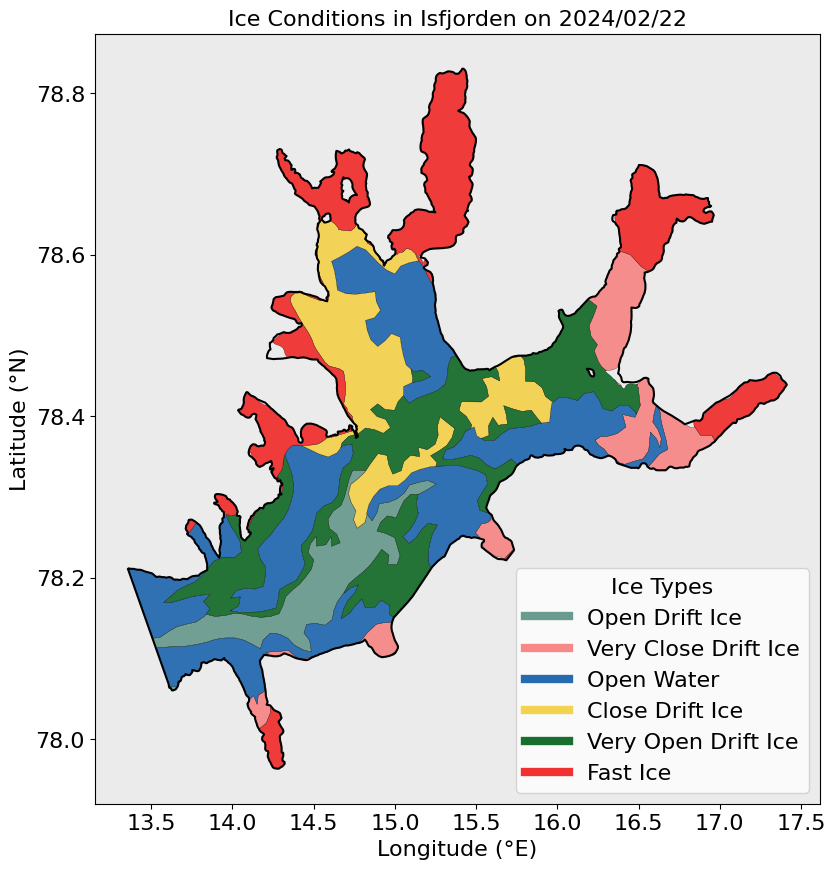

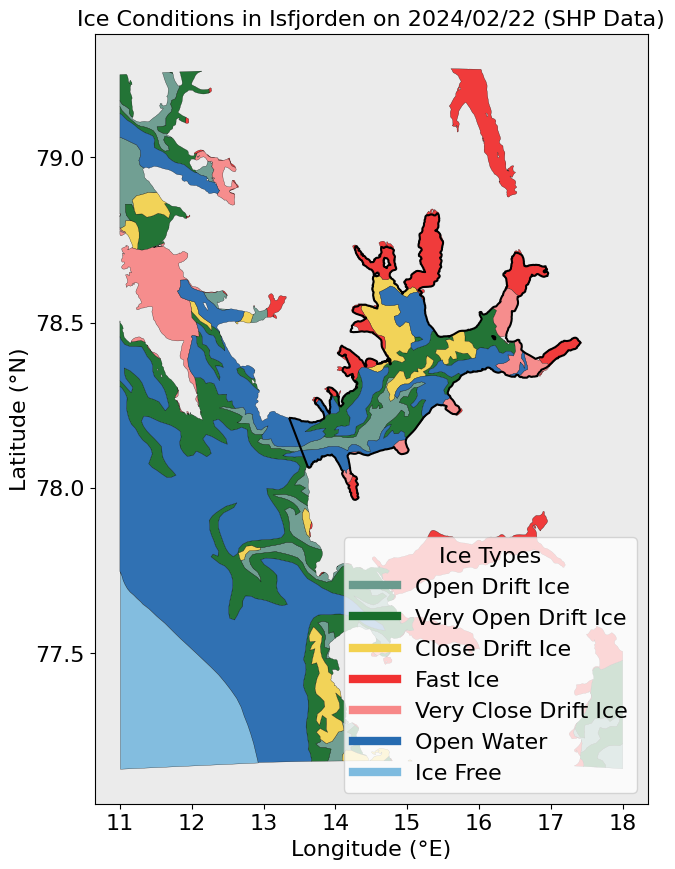

In [6]:
def plot_ice_charts(specific_day, ice_in_isfjorden, ice_shp, isfjorden_shp):

    # Convert all data to Latitude/Longitude (EPSG:4326)
    isfjorden_shp = isfjorden_shp.to_crs(epsg=4326)
    ice_in_isfjorden = ice_in_isfjorden.to_crs(epsg=4326)
    ice_shp = ice_shp.to_crs(epsg=4326)

    # 1. CREATE THE MASTER COLOR DICTIONARY
    all_ice_types = set(ice_in_isfjorden["norway_ice"].dropna().unique()).union(
                    set(ice_shp["norway_ice"].dropna().unique()))
    
    all_ice_types = sorted(list(all_ice_types))
    
    # --- NEW: Density Gradient for Ice Types ---
    custom_colors = {
        "Open Water": "#266BB0",             # Deep ocean blue
        "Ice Free": "#7EBBDF",               # Soft light blue
        
        # The Ice Density Gradient (Frosty White -> Deep Slate/Teal)
        "Fast Ice": "#F13131",               # Solid frosty white (Most dense)
        "Very Closed Drift Ice": "#D2E3DE",  # Pale icy mint
        "Closed Drift Ice": "#A0C4B8",       # Soft celadon
        "Open Drift Ice": "#6A9B8E",         # Muted teal
        "Very Open Drift Ice": "#186E2C"     # Dark slate (Least dense)
    }

    # Backup palette for any unexpected ice types (like "Nilas" or "New Ice")
    nice_palette = ["#F3D250", "#EA6A47", "#F78888", "#B2B2B2"]
    
    color_dict = {}
    
    # Assign colors
    color_idx = 0
    for ice_type in all_ice_types:
        if ice_type in custom_colors:
            color_dict[ice_type] = custom_colors[ice_type]
        else:
            color_dict[ice_type] = nice_palette[color_idx % len(nice_palette)]
            color_idx += 1

    # 2. FILTER DATA FOR THE SPECIFIC DAY
    ice_in_isfjorden_single_day = ice_in_isfjorden[ice_in_isfjorden["datetime"] == specific_day]
    ice_shp_single_day = ice_shp[ice_shp["datetime"] == specific_day]

    ice_types_isfjorden = ice_in_isfjorden_single_day["norway_ice"].unique()
    ice_types_ice_shp = ice_shp_single_day["norway_ice"].unique()

    # --- PLOT 1: Isfjorden Data ---
    fig, ax = plt.subplots(figsize=(10, 10))
    # We set the facecolor of the plot to a light grey so the white "Fast Ice" pops out
    ax.set_facecolor("#EBEBEB") 
    isfjorden_shp.boundary.plot(ax=ax, color="black", linewidth=1.5)

    legend_entries_isfjorden = []

    for ice_type in ice_types_isfjorden:
        ice_type_data = ice_in_isfjorden_single_day[ice_in_isfjorden_single_day["norway_ice"] == ice_type]
        c = color_dict[ice_type] 
        # Added edgecolor to make the ice polygons look crisp
        ice_type_data.plot(ax=ax, color=c, edgecolor="black", linewidth=0.2, label=ice_type, alpha=0.95)
        legend_entries_isfjorden.append(Line2D([0], [0], color=c, lw=6, label=ice_type))

    plt.legend(handles=legend_entries_isfjorden, title="Ice Types", loc="lower right")
    plt.title(f"Ice Conditions in Isfjorden on {specific_day}")
    plt.xlabel("Longitude (°E)")
    plt.ylabel("Latitude (°N)")
    plt.show()

    # --- PLOT 2: Ice SHP Data ---
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_facecolor("#EBEBEB") # Light grey background
    isfjorden_shp.boundary.plot(ax=ax, color="black", linewidth=1.5)

    legend_entries_ice_shp = []

    for ice_type in ice_types_ice_shp:
        ice_type_data = ice_shp_single_day[ice_shp_single_day["norway_ice"] == ice_type]
        c = color_dict[ice_type] 
        ice_type_data.plot(ax=ax, color=c, edgecolor="black", linewidth=0.2, label=ice_type, alpha=0.95)
        legend_entries_ice_shp.append(Line2D([0], [0], color=c, lw=6, label=ice_type))

    plt.legend(handles=legend_entries_ice_shp, title="Ice Types", loc="lower right")
    plt.title(f"Ice Conditions in Isfjorden on {specific_day} (SHP Data)")
    plt.xlabel("Longitude (°E)")
    plt.ylabel("Latitude (°N)")
    plt.show()







# Globally increase font sizes
plt.rcParams.update({
    'font.size': 16,          
    'axes.titlesize': 16,     
    'axes.labelsize': 16,     
    'xtick.labelsize': 16,    
    'ytick.labelsize': 16,    
    'legend.fontsize': 16,    
    'legend.title_fontsize': 16 
})

# Filter data for a specific day
specific_day = "2024/02/22"


plot_ice_charts(specific_day, ice_in_isfjorden, ice_shp, isfjorden_shp)

### Calc total area of Isfjorden

In [7]:
print(ice_in_isfjorden)
total_isfjorden_area = ice_in_isfjorden['A'].mean()
print('The total area of Isfjorden is:', total_isfjorden_area)

             id    datetime           norway_ice  si3ct  si3fp si3poly_ty  Id  \
0             2  1967/01/07      Close Drift Ice     79     98          I   0   
1             3  1967/01/14      Close Drift Ice     79     98          I   0   
2             8  1967/01/21      Close Drift Ice     79     98          I   0   
3            10  1967/01/28             Fast Ice     92      8          I   0   
4            11  1967/01/28             Fast Ice     92      8          I   0   
...         ...         ...                  ...    ...    ...        ...  ..   
144805  1640343  2025/02/14             Fast Ice     92      8          I   0   
144806  1640343  2025/02/14             Fast Ice     92      8          I   0   
144807  1640347  2025/02/14           Open Water      1     98          I   0   
144808  1640350  2025/02/14  Very Open Drift Ice     14     98          I   0   
144809  1640350  2025/02/14  Very Open Drift Ice     14     98          I   0   

                   A       

### prepare time series

In [8]:
# Aggregate ice type areas over time
time_series_isfjorden_foo = ice_in_isfjorden.groupby(["datetime", "norway_ice"])["calculated_area"].sum().reset_index()
time_series_ice_shp_foo = ice_shp.groupby(["datetime", "norway_ice"])["calculated_area"].sum().reset_index()

time_series_isfjorden = time_series_isfjorden_foo.pivot(index="datetime", columns="norway_ice", values="calculated_area")
time_series_ice_shp = time_series_ice_shp_foo.pivot(index="datetime", columns="norway_ice", values="calculated_area")

# Add a column "Total Isfjorden Area" with the constant value from total_isfjorden_area
time_series_isfjorden["Total Isfjorden Area"] = total_isfjorden_area

### Continue only for time_series_isfjorden - show time series

In [9]:
print(time_series_isfjorden.columns)
print(time_series_isfjorden)
print(time_series_isfjorden.info())

Index(['Close Drift Ice', 'Fast Ice', 'Ice Free', 'Open Drift Ice',
       'Open Water', 'Unknown', 'Very Close Drift Ice', 'Very Open Drift Ice',
       'Total Isfjorden Area'],
      dtype='object', name='norway_ice')
norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
datetime                                                              
1967/01/07     2.417074e+09           NaN       NaN             NaN   
1967/01/14     2.417074e+09           NaN       NaN             NaN   
1967/01/21     2.417074e+09           NaN       NaN             NaN   
1967/01/28     1.215979e+09  1.200932e+09       NaN             NaN   
1967/02/04     1.566655e+08  2.260409e+09       NaN             NaN   
...                     ...           ...       ...             ...   
2025/02/10     1.339680e+07  3.474404e+08       NaN    1.363973e+08   
2025/02/11     1.339680e+07  3.470118e+08       NaN    1.391046e+08   
2025/02/12     1.339680e+07  3.470118e+08       NaN    1.391046e+08   

### Handle nans - first show per type

Plotting column: Close Drift Ice


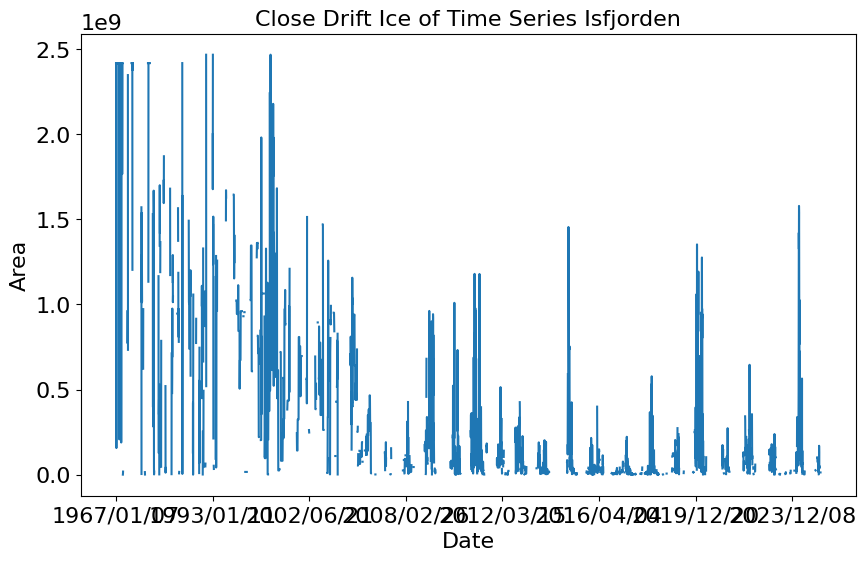

Plotting column: Fast Ice


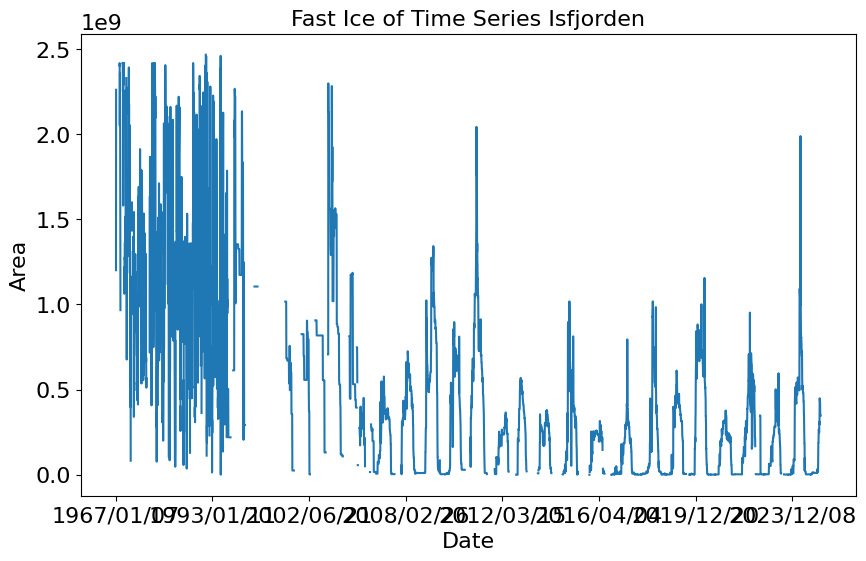

Plotting column: Ice Free


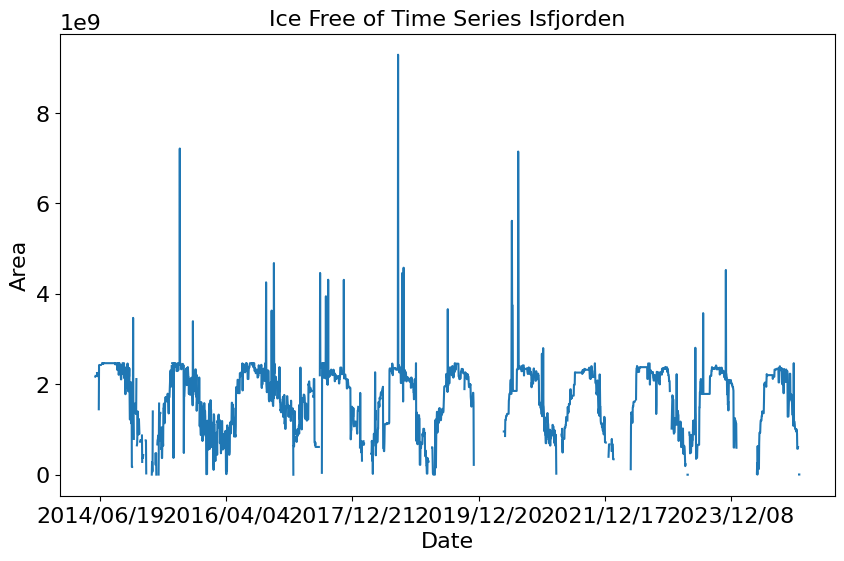

Plotting column: Open Drift Ice


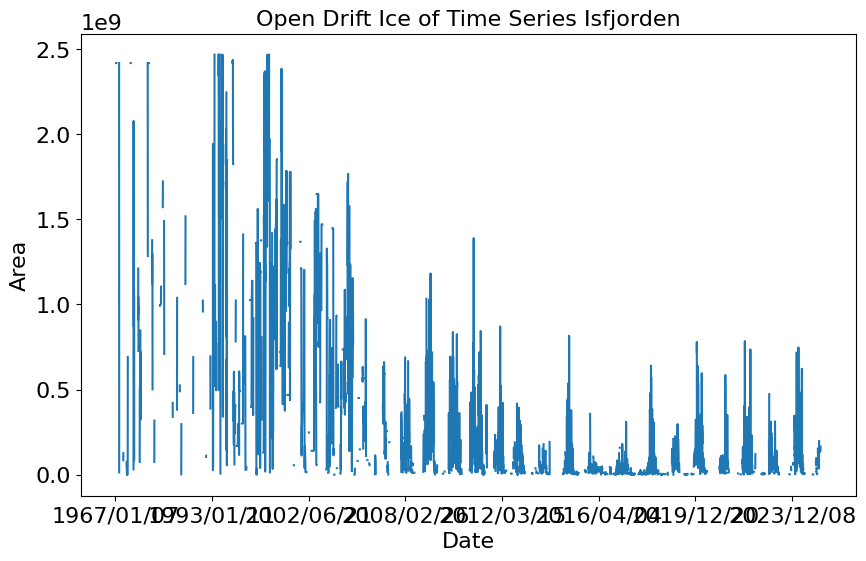

Plotting column: Open Water


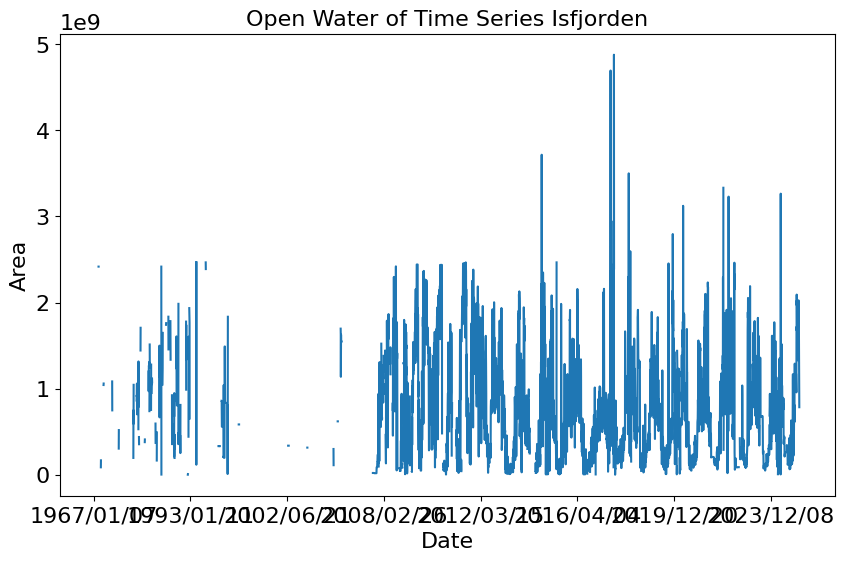

Plotting column: Unknown


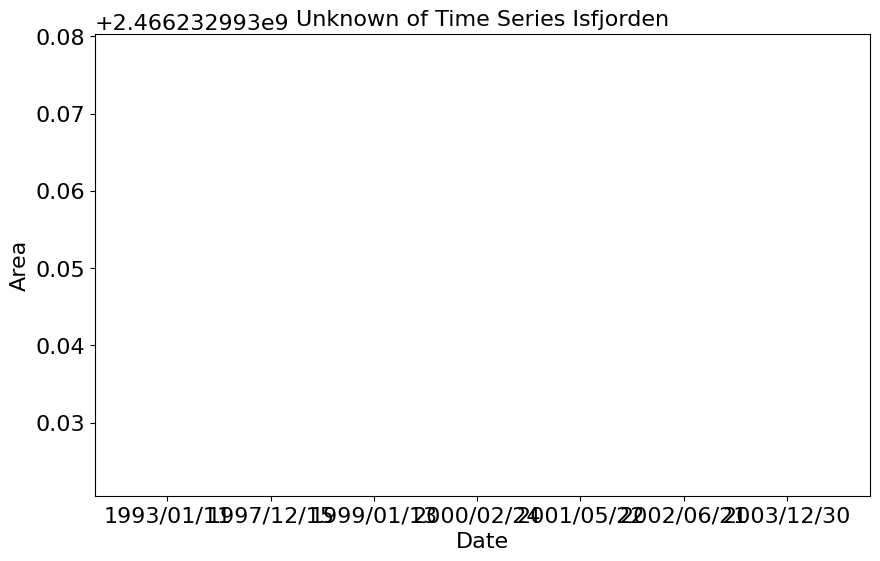

Plotting column: Very Close Drift Ice


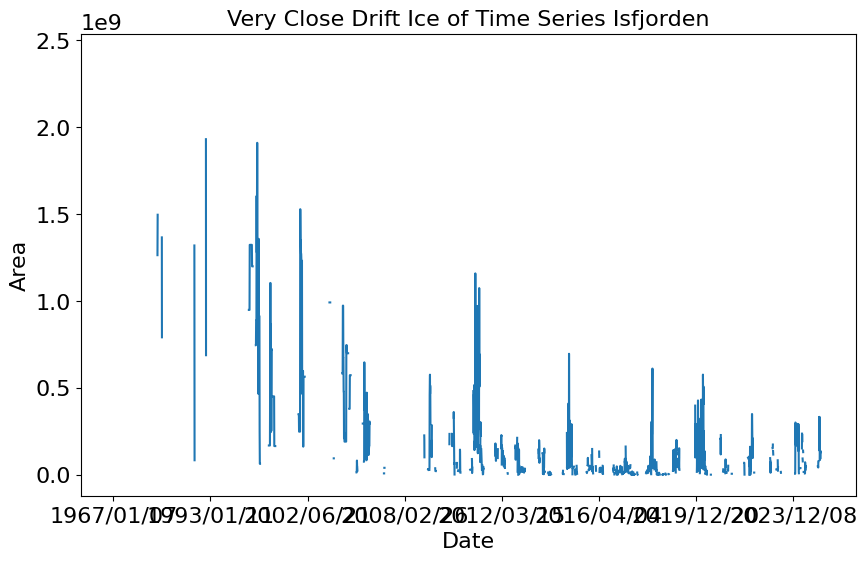

Plotting column: Very Open Drift Ice


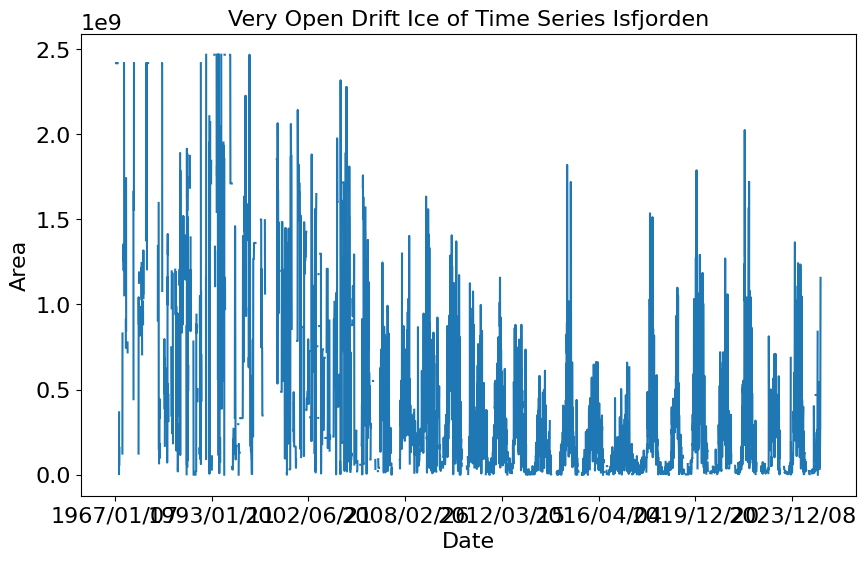

Plotting column: Total Isfjorden Area


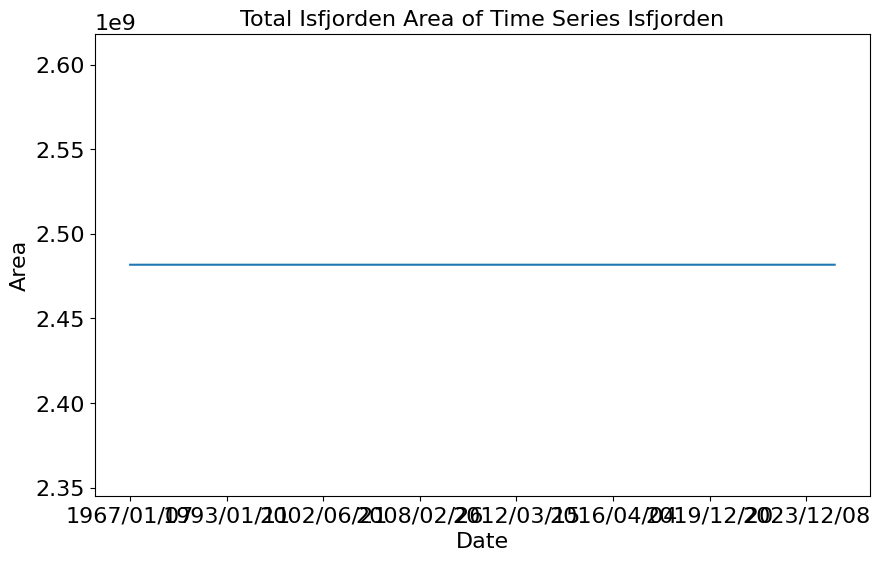

In [10]:
# Loop over all column names and plot each one

for column_name in time_series_isfjorden.columns:
    print(f"Plotting column: {column_name}")
    time_series_isfjorden[column_name].plot(figsize=(10, 6), title=f'{column_name} of Time Series Isfjorden')
    plt.xlabel('Date')
    plt.ylabel('Area')
    plt.show()

### are there empty columns?

In [11]:
# Handle nan values

# rows with NaN values
full_nan_rows = time_series_isfjorden[time_series_isfjorden.isna().all(axis=1)]
print(f"Number of fully NaN rows: {full_nan_rows.shape[0]}")
print(full_nan_rows)

Number of fully NaN rows: 0
Empty DataFrame
Columns: [Close Drift Ice, Fast Ice, Ice Free, Open Drift Ice, Open Water, Unknown, Very Close Drift Ice, Very Open Drift Ice, Total Isfjorden Area]
Index: []


### how many nan per column?

In [12]:
# columns with NaN values
nan_columns = time_series_isfjorden.columns[time_series_isfjorden.isna().all()]
print("Columns that are always NaN:", list(nan_columns))

nan_counts = time_series_isfjorden.isna().sum()
print(nan_counts)
print('from in total:', time_series_isfjorden.shape[0])

Columns that are always NaN: []
norway_ice
Close Drift Ice         4935
Fast Ice                1795
Ice Free                4987
Open Drift Ice          4371
Open Water              2977
Unknown                 7293
Very Close Drift Ice    5852
Very Open Drift Ice     2449
Total Isfjorden Area       0
dtype: int64
from in total: 7295


### drop unknown class

In [13]:
# Drop columns that are almost always NaN - in that case Unknown
time_series_isfjorden = time_series_isfjorden.drop(columns='Unknown')



### check quality of data - is everything classified?

In [14]:
partial_nan_rows = time_series_isfjorden[time_series_isfjorden.isna().any(axis=1)]
print(f"Number of partially NaN rows: {partial_nan_rows.shape[0]} from {time_series_isfjorden.shape[0]}")
print(partial_nan_rows)


Number of partially NaN rows: 7133 from 7295
norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
datetime                                                              
1967/01/07     2.417074e+09           NaN       NaN             NaN   
1967/01/14     2.417074e+09           NaN       NaN             NaN   
1967/01/21     2.417074e+09           NaN       NaN             NaN   
1967/01/28     1.215979e+09  1.200932e+09       NaN             NaN   
1967/02/04     1.566655e+08  2.260409e+09       NaN             NaN   
...                     ...           ...       ...             ...   
2025/02/10     1.339680e+07  3.474404e+08       NaN    1.363973e+08   
2025/02/11     1.339680e+07  3.470118e+08       NaN    1.391046e+08   
2025/02/12     1.339680e+07  3.470118e+08       NaN    1.391046e+08   
2025/02/13     1.339680e+07  3.470118e+08       NaN    1.391046e+08   
2025/02/14     1.339680e+07  3.470119e+08       NaN    1.655435e+08   

norway_ice    Open Water  Very 

### check for specific time period

norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
datetime                                                              
2013/01/04     2.284115e+08           NaN       NaN             NaN   
2013/01/07     1.622063e+08           NaN       NaN    1.011602e+08   
2013/01/08     7.459838e+06           NaN       NaN             NaN   
2013/01/09     2.270262e+07           NaN       NaN    8.009795e+07   
2013/01/10     2.762410e+07           NaN       NaN    6.840922e+07   
...                     ...           ...       ...             ...   
2013/12/19     4.747276e+07  2.451464e+07       NaN             NaN   
2013/12/20     1.899946e+08  2.451464e+07       NaN             NaN   
2013/12/23     1.262423e+08  2.896454e+07       NaN             NaN   
2013/12/27              NaN  4.290389e+07       NaN             NaN   
2013/12/30     4.138590e+07  4.290389e+07       NaN    2.773906e+07   

norway_ice    Open Water  Very Close Drift Ice  Very Open Drift Ice  \
datet

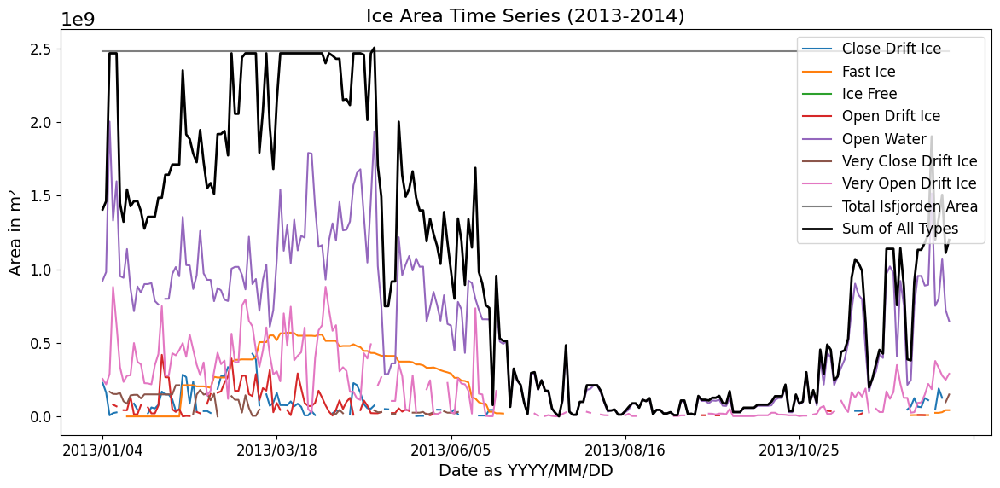

In [15]:
import matplotlib.pyplot as plt

# Filter the data
data_subset = time_series_isfjorden.loc['2013':'2014']
print(data_subset)

# Plot the main dataframe and capture the axis (ax)
# Added fontsize to the title
ax = data_subset.plot(figsize=(12, 6), title='Ice Area Time Series (2013-2014)')

# Calculate the sum of all columns except 'Total Isfjorden Area'
sum_columns = data_subset.drop(columns=['Total Isfjorden Area'], errors='ignore').sum(axis=1)

# Plot the sum line on the same axis
ax.plot(sum_columns.index, sum_columns.values, color='black', label='Sum of All Types', linewidth=2)

# --- Increase Font Sizes Here ---
ax.set_title('Ice Area Time Series (2013-2014)', fontsize=16)
ax.set_xlabel('Date as YYYY/MM/DD', fontsize=14)
ax.set_ylabel('Area in m²', fontsize=14)

# Make the tick marks (the dates and numbers) bigger
ax.tick_params(axis='both', which='major', labelsize=12)

# Make the legend bigger
ax.legend(loc='upper right', fontsize=12, title_fontsize=12)

plt.tight_layout() # This ensures labels don't get cut off at the edges
plt.show()

### how does the classification for a not fully classified day look like? 

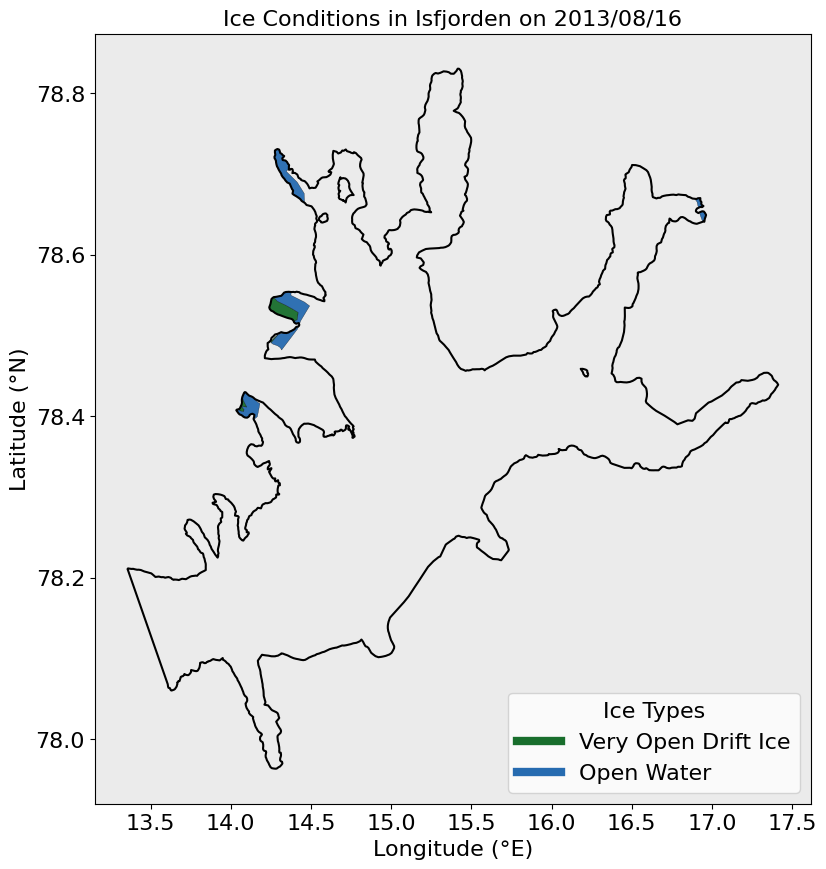

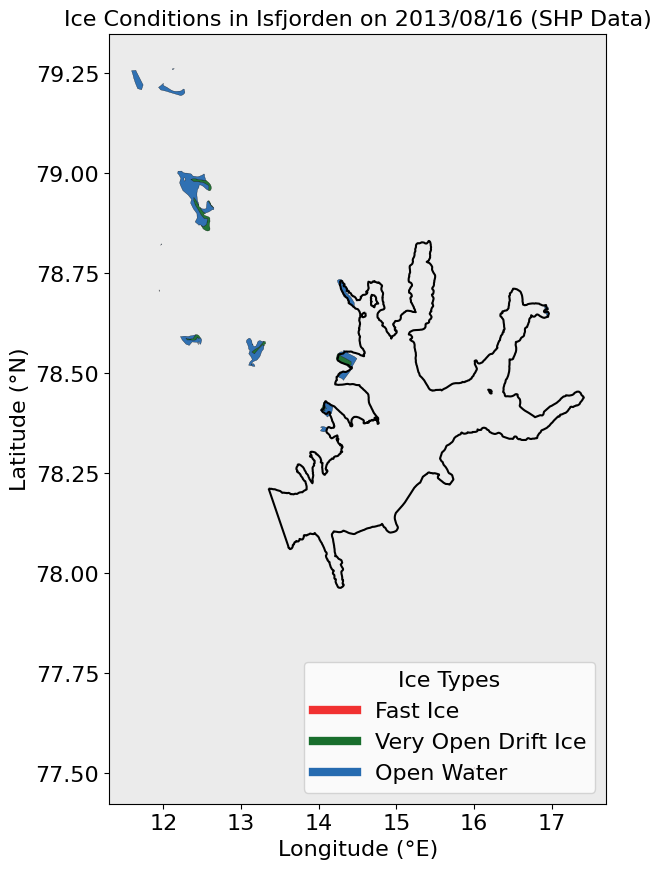

In [16]:

plot_ice_charts('2013/08/16',ice_in_isfjorden, ice_shp, isfjorden_shp)

### Since there are also not completely classified dates, we will introduce a "not classified" indication

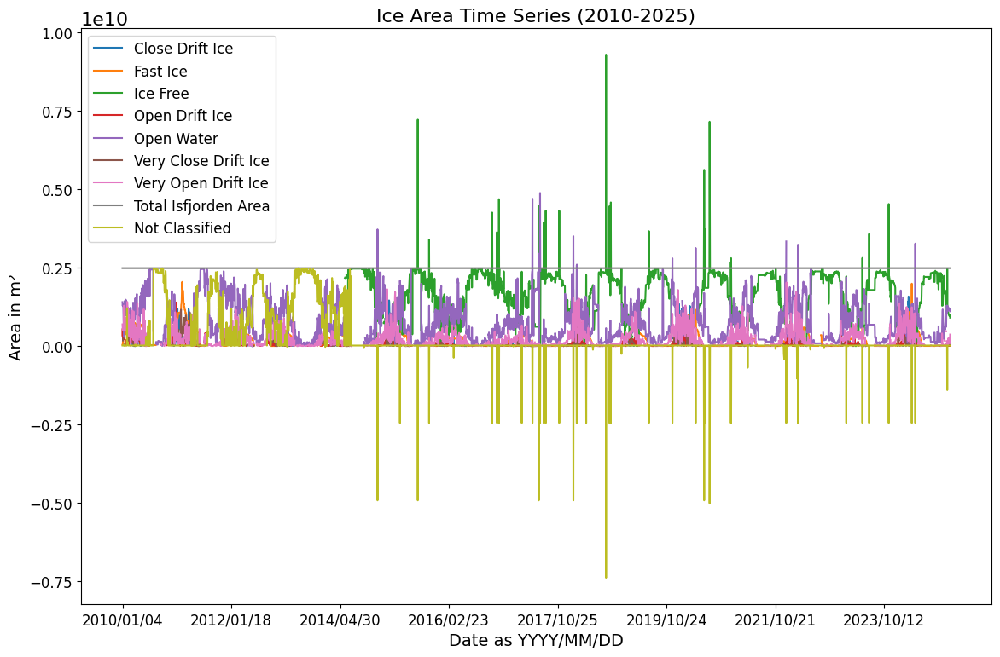

In [17]:
import matplotlib.pyplot as plt

# Define all columns that represent classified ice categories
classified_columns = [
    "Close Drift Ice", "Fast Ice", "Ice Free", "Open Drift Ice",
    "Open Water", "Very Close Drift Ice", "Very Open Drift Ice"
]

# Calculate the sum of classified areas (ignoring NaNs)
classified_sum = time_series_isfjorden[classified_columns].sum(axis=1, skipna=True)

# Compute the "Not Classified" column
time_series_isfjorden["Not Classified"] = time_series_isfjorden["Total Isfjorden Area"] - classified_sum

# Plot the data and capture the axis (ax)
# UPDATE: Set figsize to (14, 10) for a 14:10 length-to-height ratio
ax = time_series_isfjorden.loc['2010':'2025'].plot(figsize=(12, 8))

# --- Formatting ---
# Set the title to size 16, normal weight (not bold)
ax.set_title('Ice Area Time Series (2010-2025)', fontsize=16)

# Set axis labels to size 14
ax.set_xlabel('Date as YYYY/MM/DD', fontsize=14)
ax.set_ylabel('Area in m²', fontsize=14)

# Set the tick numbers on the axes to size 12
ax.tick_params(axis='both', which='major', labelsize=12)

# Set the legend font size to 12
ax.legend(loc='upper left', fontsize=12)

# Ensure everything fits perfectly without cutting off labels
plt.tight_layout()
plt.show()

### Now handle the dates with more as 100% (over-classification), meaning where Non Classified is negative. First, how does such a day look like?

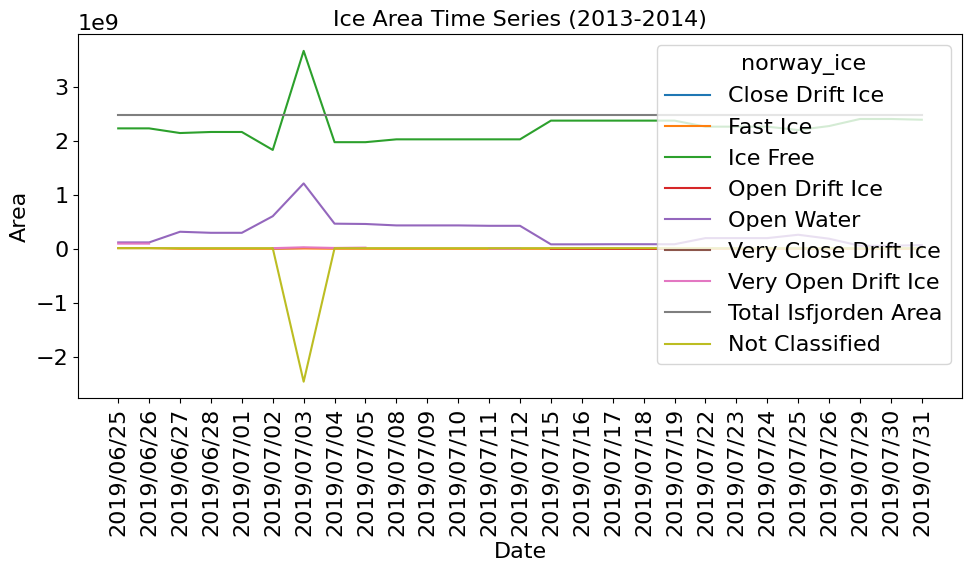

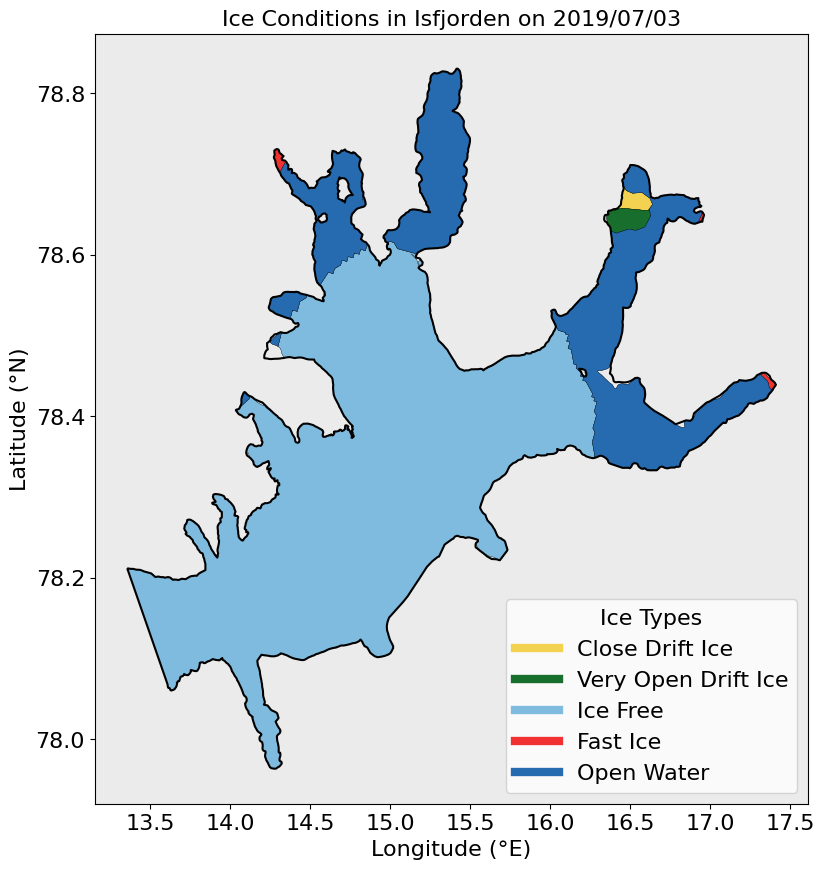

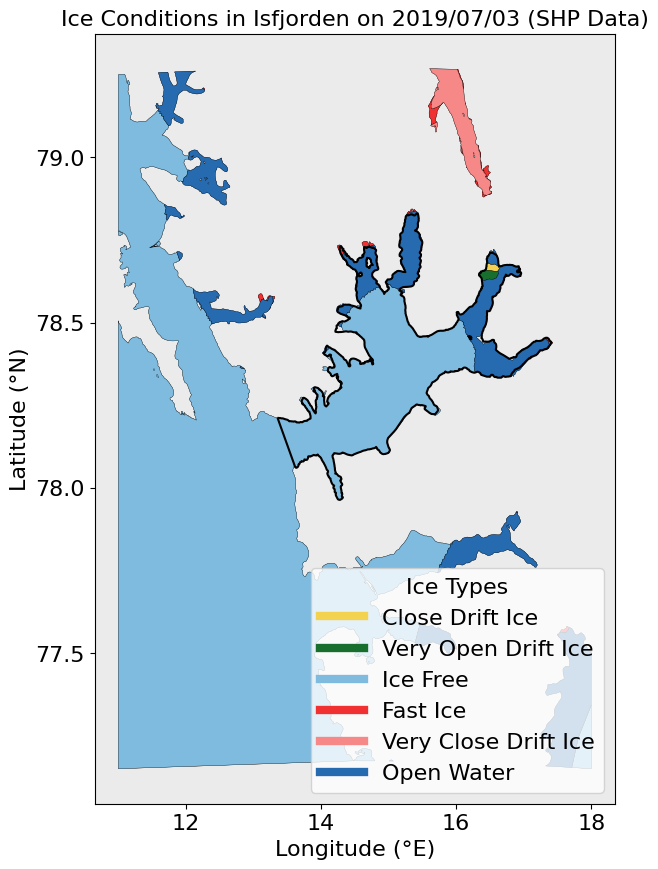

In [18]:
import matplotlib.pyplot as plt

# 1. Slice your data first so we can easily grab the dates
subset = time_series_isfjorden.loc['2019/06/25':'2019/07/5']

# 2. Your original plot command (assigned to 'ax' so we can modify the ticks)
ax = subset.plot(figsize=(10, 6), title='Ice Area Time Series (2013-2014)')

# 3. Force a tick for every single row in the subset, and label it with your exact index
ax.set_xticks(range(len(subset)))
ax.set_xticklabels(subset.index, rotation=90)

plt.xlabel('Date')
plt.ylabel('Area')
plt.tight_layout() # Prevents the rotated labels from getting cut off
plt.show()


plot_ice_charts('2019/07/03',ice_in_isfjorden, ice_shp, isfjorden_shp)

### check if there is an overlay of ice classes

/tmp/ipykernel_53377/1694946172.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors_isfjorden = plt.cm.get_cmap("tab20", len(ice_types_isfjorden))


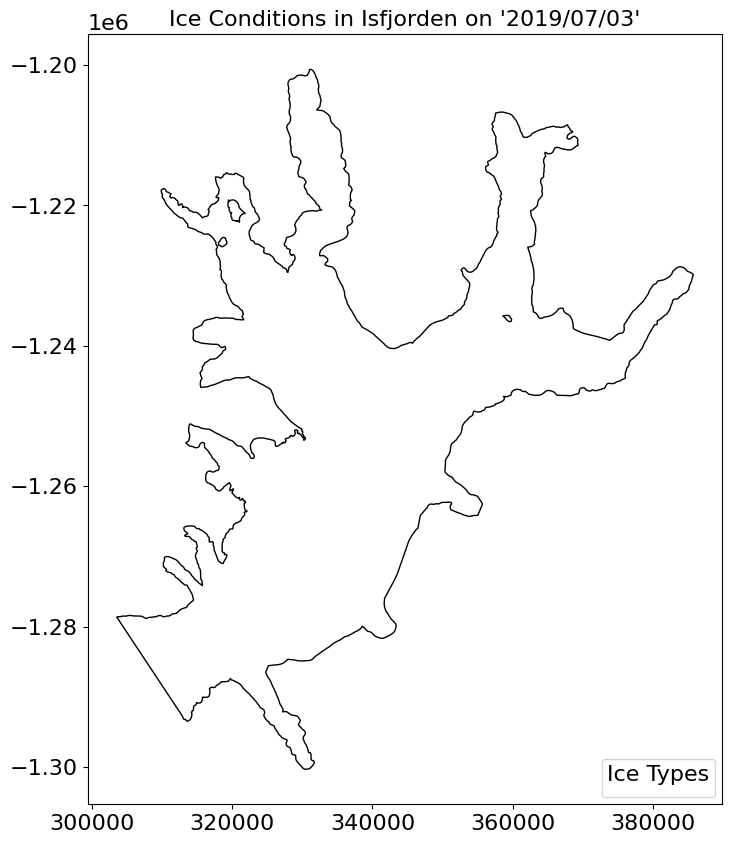

No overlapping areas found in Isfjorden.


In [19]:


def plot_ice_chart_with_overlaps_isfjorden(specific_day, ice_in_isfjorden, isfjorden_shp):
    # Filter data for the specific day
    ice_isfjorden_single_day = ice_in_isfjorden[ice_in_isfjorden["datetime"] == specific_day]

    # Get unique ice types
    ice_types_isfjorden = ice_isfjorden_single_day["norway_ice"].unique()

    # Define a colormap
    colors_isfjorden = plt.cm.get_cmap("tab20", len(ice_types_isfjorden))

    # --- PLOT 1: Ice Types in Isfjorden ---
    fig, ax = plt.subplots(figsize=(10, 10))
    isfjorden_shp.boundary.plot(ax=ax, color="black", linewidth=1)  # Plot Isfjorden boundary

    legend_entries = []

    # Plot each ice type in Isfjorden
    for i, ice_type in enumerate(ice_types_isfjorden):
        ice_type_data = ice_isfjorden_single_day[ice_isfjorden_single_day["norway_ice"] == ice_type]
        ice_type_data.plot(ax=ax, 
                           facecolor=colors_isfjorden(i), 
                           edgecolor="black", 
                           alpha=0.5, 
                           linewidth=1)
        legend_entries.append(Patch(facecolor=colors_isfjorden(i), edgecolor="black", label=ice_type, alpha=0.5))

    plt.legend(handles=legend_entries, title="Ice Types", loc="lower right", fontsize=10)
    plt.title(f"Ice Conditions in Isfjorden on {specific_day}")
    plt.show()

    # --- FIND OVERLAPPING AREAS ONLY IN ISFJORDEN ---
    overlap_areas = gpd.overlay(ice_isfjorden_single_day, ice_isfjorden_single_day, how="intersection")

    if not overlap_areas.empty:
        # --- PLOT 2: Highlight Overlapping Areas in Isfjorden ---
        fig, ax = plt.subplots(figsize=(10, 10))
        isfjorden_shp.boundary.plot(ax=ax, color="black", linewidth=1)  # Plot Isfjorden boundary

        # Show all polygons as outlines
        ice_isfjorden_single_day.plot(ax=ax, 
                                      facecolor="none", 
                                      edgecolor="gray", 
                                      linewidth=1, 
                                      alpha=0.5)

        # Highlight overlapping areas in red with hatching
        overlap_areas.plot(ax=ax, 
                           facecolor="red", 
                           edgecolor="black", 
                           alpha=0.7, 
                           hatch="xxx")

        plt.title(f"Overlapping Ice Areas in Isfjorden on {specific_day}")
        plt.show()
    else:
        print("No overlapping areas found in Isfjorden.")

# Example usage
plot_ice_chart_with_overlaps_isfjorden("'2019/07/03'", ice_in_isfjorden, isfjorden_shp)


### Since no overlappings, lets check the dates and types of those error events...

In [20]:
negative_not_classified = time_series_isfjorden[time_series_isfjorden["Not Classified"] < 0]

print("Dates and ice types where 'Not Classified' is negative:")
print(negative_not_classified)


Dates and ice types where 'Not Classified' is negative:
norway_ice  Close Drift Ice      Fast Ice      Ice Free  Open Drift Ice  \
datetime                                                                  
1999/04/27     7.130974e+08           NaN           NaN    1.560538e+09   
1999/04/28     7.130974e+08           NaN           NaN    1.560538e+09   
1999/04/29     7.130974e+08           NaN           NaN    1.560538e+09   
1999/04/30     7.130974e+08           NaN           NaN    1.546508e+09   
1999/05/03     7.130974e+08           NaN           NaN    1.546508e+09   
...                     ...           ...           ...             ...   
2023/11/10              NaN  2.806929e+06  4.526912e+09             NaN   
2024/04/16              NaN  1.988389e+09           NaN    3.808910e+08   
2024/05/10     5.648025e+08  7.246040e+08           NaN    2.893855e+08   
2024/12/05              NaN  1.078575e+07  1.083980e+09    9.677753e+07   
2024/12/06              NaN  1.078575e+07  2

### illustrate them per period (max, melt, min, growth)

/tmp/ipykernel_53377/1611935947.py:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc="upper right")


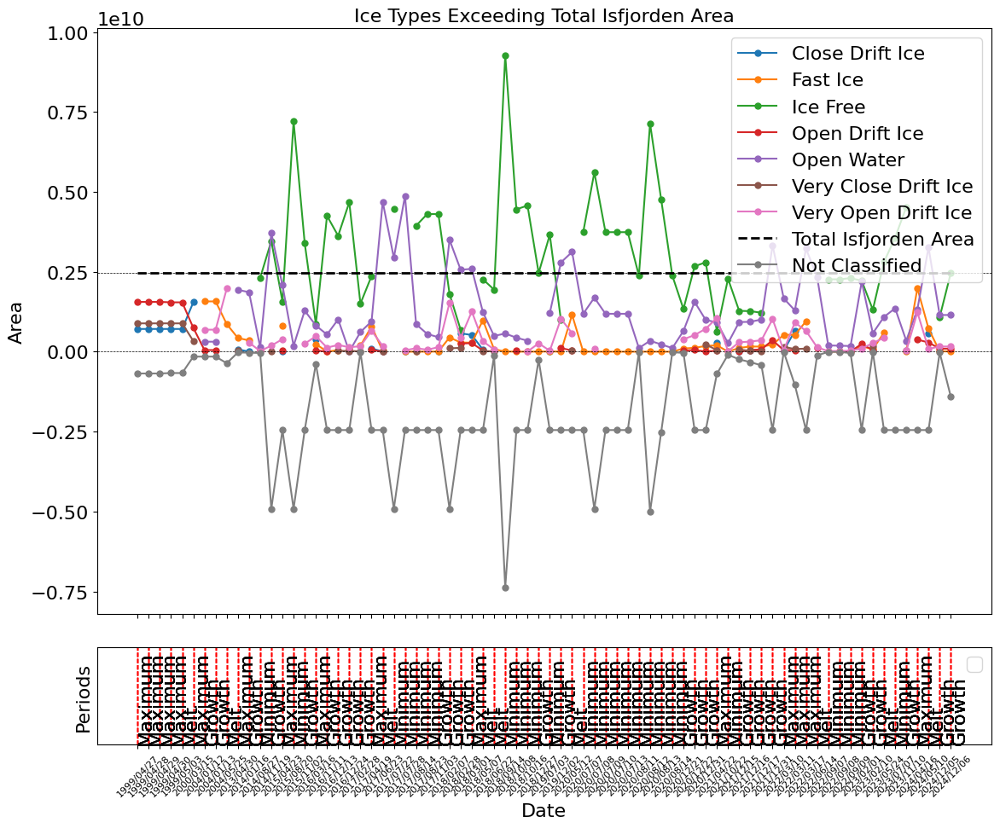

In [21]:

# Define the periods
periods = {
    "Maximum": [3, 4],
    "Melt": [5, 6],
    "Minimum": [7, 8, 9, 10],
    "Growth": [11, 12, 1, 2]
}

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [6, 1]}, sharex=True)

# Plot the events where "Not Classified" is negative
for column in negative_not_classified.columns:
    if column != "Total Isfjorden Area":
        ax1.plot(negative_not_classified.index, negative_not_classified[column], label=column, marker="o", markersize=5)
    else:
        ax1.plot(negative_not_classified.index, negative_not_classified[column], label=column, linestyle="--", color="black", linewidth=2)
        ax1.axhline(y=0, color="black", linestyle="--", linewidth=0.5)
        ax1.axhline(y=negative_not_classified["Total Isfjorden Area"].mean(), color="black", linestyle="--", linewidth=0.5)

ax1.set_ylabel("Area")
ax1.legend()
ax1.set_title("Ice Types Exceeding Total Isfjorden Area")
ax1.legend(loc="upper right")

# Plot the periods
for period, months in periods.items():
    for dates in negative_not_classified.index:
       date = pd.to_datetime(dates)
       for period in periods:
           if date.month in periods[period]:
               ax2.axvline(x=dates, color="red", linestyle="--", linewidth=1)
               ax2.text(dates, 0, period, rotation=90, verticalalignment="bottom")


ax2.set_yticks([])
ax2.set_xlabel("Date")
ax2.set_ylabel("Periods")
ax2.legend(loc="upper right")

# Set the x-tick font size smaller
plt.xticks(rotation=45, fontsize=8)
plt.tight_layout()
plt.show()

### how are they distributed over the whole time series?

Amount of rows where 'Not Classified' is negative:
74
Dates and ice types where 'Not Classified' is negative:
norway_ice  Close Drift Ice      Fast Ice      Ice Free  Open Drift Ice  \
datetime                                                                  
1999/04/27     7.130974e+08           NaN           NaN    1.560538e+09   
1999/04/28     7.130974e+08           NaN           NaN    1.560538e+09   
1999/04/29     7.130974e+08           NaN           NaN    1.560538e+09   
1999/04/30     7.130974e+08           NaN           NaN    1.546508e+09   
1999/05/03     7.130974e+08           NaN           NaN    1.546508e+09   
...                     ...           ...           ...             ...   
2023/11/10              NaN  2.806929e+06  4.526912e+09             NaN   
2024/04/16              NaN  1.988389e+09           NaN    3.808910e+08   
2024/05/10     5.648025e+08  7.246040e+08           NaN    2.893855e+08   
2024/12/05              NaN  1.078575e+07  1.083980e+09    9.6777

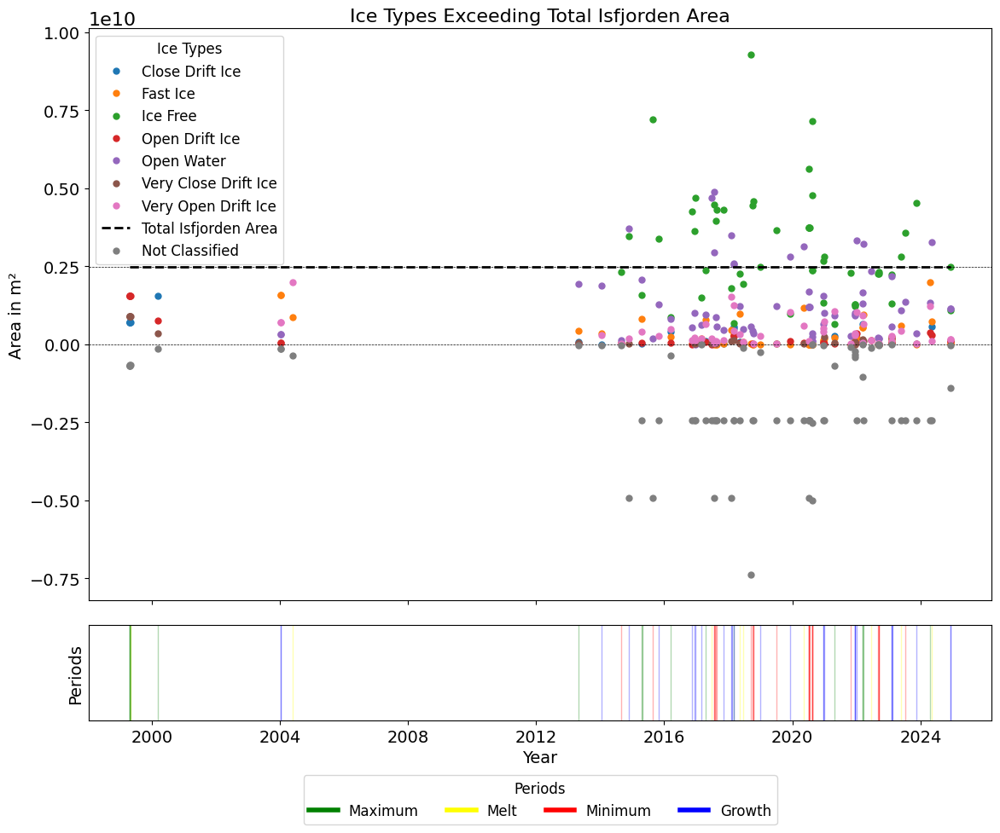

In [22]:
print("Amount of rows where 'Not Classified' is negative:")
print(negative_not_classified.shape[0])
print("Dates and ice types where 'Not Classified' is negative:")
print(negative_not_classified)

# Convert the index to datetime format
negative_not_classified.index = pd.to_datetime(negative_not_classified.index)

# Define the periods with corresponding colors
periods = {
    "Maximum": ([3, 4], "green"),
    "Melt": ([5, 6], "yellow"),
    "Minimum": ([7, 8, 9, 10], "red"),
    "Growth": ([11, 12, 1, 2], "blue")
}

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [6, 1]}, sharex=True)

# --- Top Plot (ax1) ---
# Plot the events where "Not Classified" is negative
for column in negative_not_classified.columns:
    if column != "Total Isfjorden Area":
        ax1.plot(negative_not_classified.index, negative_not_classified[column], label=column, marker="o", markersize=5, linestyle="")
    else:
        ax1.plot(negative_not_classified.index, negative_not_classified[column], label=column, linestyle="--", color="black", linewidth=2)
        ax1.axhline(y=0, color="black", linestyle="--", linewidth=0.5)
        ax1.axhline(y=negative_not_classified["Total Isfjorden Area"].mean(), color="black", linestyle="--", linewidth=0.5)

# Formatting for top plot
ax1.set_title("Ice Types Exceeding Total Isfjorden Area", fontsize=16)
ax1.set_ylabel("Area in m²", fontsize=14)
ax1.tick_params(axis='y', labelsize=14)

# I removed the duplicate legend call and combined them into one
ax1.legend(loc="upper left", title="Ice Types", fontsize=12, title_fontsize=12)

# --- Bottom Plot (ax2) ---
# Plot the periods as colored bars
for period, (months, color) in periods.items():
    for dates in negative_not_classified.index:
        if dates.month in months:
            ax2.axvspan(dates, dates + pd.Timedelta(days=1), color=color, alpha=0.3)

# Add a legend for the periods
handles = [plt.Line2D([0], [0], color=color, lw=4, label=period) for period, (_, color) in periods.items()]
# ax2.legend(handles=handles, title="Periods", bbox_to_anchor=(1, 1), fontsize=12, title_fontsize=12)
ax2.legend(handles=handles, title="Periods", loc="upper center", bbox_to_anchor=(0.5, -0.5), ncol=4, fontsize=12, title_fontsize=12)


# Formatting for bottom plot
ax2.set_yticks([])
ax2.set_xlabel("Year", fontsize=14)
ax2.set_ylabel("Periods", fontsize=14)

# Replaced the old plt.xticks with ax2.tick_params to make it straight (rotation=0) and larger
ax2.tick_params(axis='x', labelsize=14, rotation=0)

plt.tight_layout()
plt.show()

### Now that I identified the times and periods where the total amount is greater than the total fjord area, I have to decide how to handle those cases

### Since i am interested in ice, i can set "ice free" or "open water" to 0 if "not classified" is negative and calculate not classified again

In [23]:

condition = time_series_isfjorden["Not Classified"] < 0

# Set the values of "Open Water" and "Ice Free" to 0 for those rows
time_series_isfjorden_modified = time_series_isfjorden.copy()



time_series_isfjorden_modified.loc[condition, ["Open Water", "Ice Free"]] = 0

# Drop the existing "Not Classified" column
time_series_isfjorden_modified = time_series_isfjorden_modified.drop(columns=["Not Classified"])

# Define all columns that represent classified ice categories
classified_columns = [
    "Close Drift Ice", "Fast Ice", "Ice Free", "Open Drift Ice",
    "Open Water", "Very Close Drift Ice", "Very Open Drift Ice"
]

# Calculate the sum of classified areas (ignoring NaNs)
classified_sum = time_series_isfjorden_modified[classified_columns].sum(axis=1, skipna=True)

# Compute the "Not Classified" column
time_series_isfjorden_modified["Not Classified"] = time_series_isfjorden_modified["Total Isfjorden Area"] - classified_sum


### check again

Amount of rows where 'Not Classified' is negative:
8
Dates and ice types where 'Not Classified' is negative:
norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
datetime                                                              
1999/04/27     7.130974e+08           NaN       0.0    1.560538e+09   
1999/04/28     7.130974e+08           NaN       0.0    1.560538e+09   
1999/04/29     7.130974e+08           NaN       0.0    1.560538e+09   
1999/04/30     7.130974e+08           NaN       0.0    1.546508e+09   
1999/05/03     7.130974e+08           NaN       0.0    1.546508e+09   
2000/03/15     1.549984e+09           NaN       0.0    7.480333e+08   
2004/05/25              NaN  8.652713e+08       0.0             NaN   
2024/04/16              NaN  1.988389e+09       0.0    3.808910e+08   

norway_ice  Open Water  Very Close Drift Ice  Very Open Drift Ice  \
datetime                                                            
1999/04/27         0.0          8.883025e+

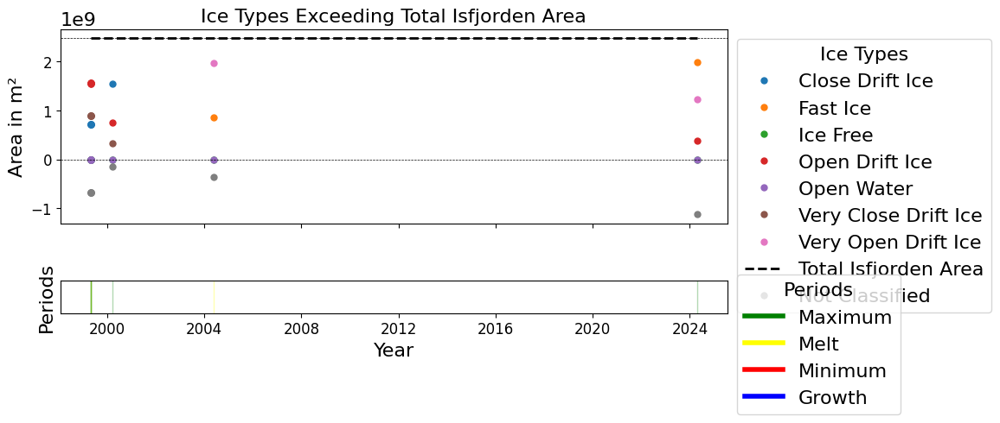

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming time_series_isfjorden_modified is already defined and loaded

# Identify the rows where "Not Classified" is negative
negative_not_classified_modified = time_series_isfjorden_modified[time_series_isfjorden_modified["Not Classified"] < 0]

print("Amount of rows where 'Not Classified' is negative:")
print(negative_not_classified_modified.shape[0])
print("Dates and ice types where 'Not Classified' is negative:")
print(negative_not_classified_modified)

# Convert the index to datetime format
negative_not_classified_modified.index = pd.to_datetime(negative_not_classified_modified.index)

# Define the periods with corresponding colors
periods = {
    "Maximum": ([3, 4], "green"),
    "Melt": ([5, 6], "yellow"),
    "Minimum": ([7, 8, 9, 10], "red"),
    "Growth": ([11, 12, 1, 2], "blue")
}

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 5), gridspec_kw={'height_ratios': [6, 1]}, sharex=True)

# Plot the events where "Not Classified" is negative
for column in negative_not_classified_modified.columns:
    if column != "Total Isfjorden Area":
        ax1.plot(negative_not_classified_modified.index, negative_not_classified_modified[column], label=column, marker="o", markersize=5, linestyle="")
    else:
        ax1.plot(negative_not_classified_modified.index, negative_not_classified_modified[column], label=column, linestyle="--", color="black", linewidth=2)
        ax1.axhline(y=0, color="black", linestyle="--", linewidth=0.5)
        ax1.axhline(y=negative_not_classified_modified["Total Isfjorden Area"].mean(), color="black", linestyle="--", linewidth=0.5)

ax1.set_ylabel("Area in m²")
ax1.legend()
ax1.set_title("Ice Types Exceeding Total Isfjorden Area")
ax1.legend(title="Ice Types", bbox_to_anchor=(1, 1))

# Plot the periods as colored bars
for period, (months, color) in periods.items():
    for dates in negative_not_classified_modified.index:
        if dates.month in months:
            ax2.axvspan(dates, dates + pd.Timedelta(days=1), color=color, alpha=0.3)

# Add a legend for the periods
handles = [plt.Line2D([0], [0], color=color, lw=4, label=period) for period, (_, color) in periods.items()]
ax2.legend(handles=handles, title="Periods", bbox_to_anchor=(1, 1.5))

ax2.set_yticks([])
ax2.set_xlabel("Year")
ax2.set_ylabel("Periods")

# Set the x-tick font size smaller
plt.xticks(rotation=0, fontsize=12)

# --- NEW LINE: Make only the Y-axis tick labels bigger ---
ax1.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()

### drop the last events since only 8 days...

In [25]:
condition = time_series_isfjorden_modified["Not Classified"] < 0

if condition.any():
    true_events = time_series_isfjorden_modified[condition]
    print(true_events)
    print(f"Number of true events: {true_events.shape[0]}")


# drop events when condition is true
time_series_isfjorden_modified = time_series_isfjorden_modified[~condition]


if condition.any():
    true_events = time_series_isfjorden_modified[condition]
    print(true_events)
    print(f"Number of true events: {true_events.shape[0]}")

norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
datetime                                                              
1999/04/27     7.130974e+08           NaN       0.0    1.560538e+09   
1999/04/28     7.130974e+08           NaN       0.0    1.560538e+09   
1999/04/29     7.130974e+08           NaN       0.0    1.560538e+09   
1999/04/30     7.130974e+08           NaN       0.0    1.546508e+09   
1999/05/03     7.130974e+08           NaN       0.0    1.546508e+09   
2000/03/15     1.549984e+09           NaN       0.0    7.480333e+08   
2004/05/25              NaN  8.652713e+08       0.0             NaN   
2024/04/16              NaN  1.988389e+09       0.0    3.808910e+08   

norway_ice  Open Water  Very Close Drift Ice  Very Open Drift Ice  \
datetime                                                            
1999/04/27         0.0          8.883025e+08                  NaN   
1999/04/28         0.0          8.883025e+08                  NaN   
1999/04/29   

/tmp/ipykernel_53377/1024811408.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  true_events = time_series_isfjorden_modified[condition]


### Nice - now the time series should be clean and ready to use :) - lets take a look

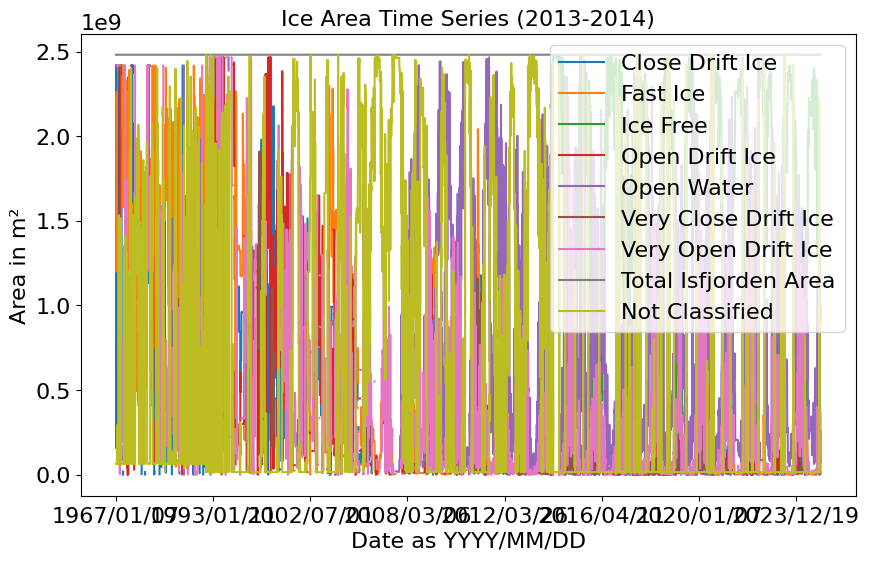

In [26]:

time_series_isfjorden_modified.loc['1967':'2025'].plot(figsize=(10, 6), title='Ice Area Time Series (2013-2014)')
plt.xlabel('Date as YYYY/MM/DD')
plt.ylabel('Area in m²')
plt.legend(loc='upper right')
plt.show()

### Check again for nans

In [27]:
# columns with NaN values
nan_columns = time_series_isfjorden_modified.columns[time_series_isfjorden_modified.isna().all()]
print("Columns that are always NaN:", list(nan_columns))

nan_counts = time_series_isfjorden_modified.isna().sum()
print(nan_counts)
print('from in total:', time_series_isfjorden_modified.shape[0])

partial_nan_rows = time_series_isfjorden_modified[time_series_isfjorden_modified.isna().any(axis=1)]
print(f"Number of partially NaN rows: {partial_nan_rows.shape[0]} from {time_series_isfjorden_modified.shape[0]}")
print(partial_nan_rows)

Columns that are always NaN: []
norway_ice
Close Drift Ice         4933
Fast Ice                1789
Ice Free                4965
Open Drift Ice          4370
Open Water              2969
Very Close Drift Ice    5850
Very Open Drift Ice     2443
Total Isfjorden Area       0
Not Classified             0
dtype: int64
from in total: 7287
Number of partially NaN rows: 7122 from 7287
norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
datetime                                                              
1967/01/07     2.417074e+09           NaN       NaN             NaN   
1967/01/14     2.417074e+09           NaN       NaN             NaN   
1967/01/21     2.417074e+09           NaN       NaN             NaN   
1967/01/28     1.215979e+09  1.200932e+09       NaN             NaN   
1967/02/04     1.566655e+08  2.260409e+09       NaN             NaN   
...                     ...           ...       ...             ...   
2025/02/10     1.339680e+07  3.474404e+08       Na

###  and replace with 0... so i assume if no classification was done the ice type is zero.  i know thats not true but for that i have the ice type "not classified"

In [28]:
# replace nan with 0

time_series_isfjorden_modified.fillna(0, inplace=True)




# check again
nan_columns = time_series_isfjorden_modified.columns[time_series_isfjorden_modified.isna().all()]
print("Columns that are always NaN:", list(nan_columns))

nan_counts = time_series_isfjorden_modified.isna().sum()
print(nan_counts)
print('from in total:', time_series_isfjorden_modified.shape[0])

partial_nan_rows = time_series_isfjorden_modified[time_series_isfjorden_modified.isna().any(axis=1)]
print(f"Number of partially NaN rows: {partial_nan_rows.shape[0]} from {time_series_isfjorden_modified.shape[0]}")
print(partial_nan_rows)

Columns that are always NaN: []
norway_ice
Close Drift Ice         0
Fast Ice                0
Ice Free                0
Open Drift Ice          0
Open Water              0
Very Close Drift Ice    0
Very Open Drift Ice     0
Total Isfjorden Area    0
Not Classified          0
dtype: int64
from in total: 7287
Number of partially NaN rows: 0 from 7287
Empty DataFrame
Columns: [Close Drift Ice, Fast Ice, Ice Free, Open Drift Ice, Open Water, Very Close Drift Ice, Very Open Drift Ice, Total Isfjorden Area, Not Classified]
Index: []


### visualize again :)

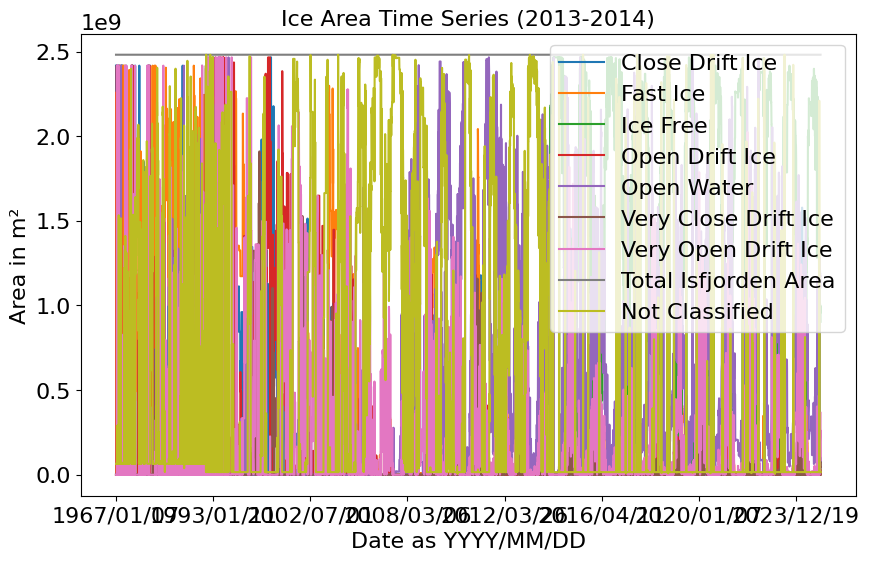

In [29]:
time_series_isfjorden_modified.loc['1967':'2025'].plot(figsize=(10, 6), title='Ice Area Time Series (2013-2014)')
plt.xlabel('Date as YYYY/MM/DD')
plt.ylabel('Area in m²')
plt.legend(loc='upper right')
plt.show()

### Now, checking data availibility. meaning expanding dataset to daily timesteps and fill empty days with nan

In [30]:
print(time_series_isfjorden_modified.columns)
print(time_series_isfjorden_modified)
print(time_series_isfjorden_modified.info())

Index(['Close Drift Ice', 'Fast Ice', 'Ice Free', 'Open Drift Ice',
       'Open Water', 'Very Close Drift Ice', 'Very Open Drift Ice',
       'Total Isfjorden Area', 'Not Classified'],
      dtype='object', name='norway_ice')
norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
datetime                                                              
1967/01/07     2.417074e+09  0.000000e+00       0.0    0.000000e+00   
1967/01/14     2.417074e+09  0.000000e+00       0.0    0.000000e+00   
1967/01/21     2.417074e+09  0.000000e+00       0.0    0.000000e+00   
1967/01/28     1.215979e+09  1.200932e+09       0.0    0.000000e+00   
1967/02/04     1.566655e+08  2.260409e+09       0.0    0.000000e+00   
...                     ...           ...       ...             ...   
2025/02/10     1.339680e+07  3.474404e+08       0.0    1.363973e+08   
2025/02/11     1.339680e+07  3.470118e+08       0.0    1.391046e+08   
2025/02/12     1.339680e+07  3.470118e+08       0.0    1.391046

In [31]:
# Convert index to datetime format
time_series_isfjorden_modified.index = pd.to_datetime(time_series_isfjorden_modified.index, format="%Y/%m/%d")

# Create a complete daily date range
full_date_range = pd.date_range(start=time_series_isfjorden_modified.index.min(), 
                                end=time_series_isfjorden_modified.index.max(), 
                                freq='D')

# Reindex the DataFrame to include all dates, filling missing ones with NaN
time_series_isfjorden_modified = time_series_isfjorden_modified.reindex(full_date_range)

# Create "Data Availability" column: 1 if data existed, 0 if it was newly added
#time_series_isfjorden_modified["Data Availability"] = time_series_isfjorden_modified.notna().any(axis=1).astype(int)


# time_series_isfjorden_modified.drop(columns='Data Availability', inplace=True)
time_series_isfjorden_modified['Data Availability'] = time_series_isfjorden_modified.notna().any(axis=1)
time_series_isfjorden_modified['Data Availability'] = time_series_isfjorden_modified['Data Availability'].astype(int)
print(time_series_isfjorden_modified[0:25])


norway_ice  Close Drift Ice      Fast Ice  Ice Free  Open Drift Ice  \
1967-01-07     2.417074e+09  0.000000e+00       0.0             0.0   
1967-01-08              NaN           NaN       NaN             NaN   
1967-01-09              NaN           NaN       NaN             NaN   
1967-01-10              NaN           NaN       NaN             NaN   
1967-01-11              NaN           NaN       NaN             NaN   
1967-01-12              NaN           NaN       NaN             NaN   
1967-01-13              NaN           NaN       NaN             NaN   
1967-01-14     2.417074e+09  0.000000e+00       0.0             0.0   
1967-01-15              NaN           NaN       NaN             NaN   
1967-01-16              NaN           NaN       NaN             NaN   
1967-01-17              NaN           NaN       NaN             NaN   
1967-01-18              NaN           NaN       NaN             NaN   
1967-01-19              NaN           NaN       NaN             NaN   
1967-0

## Plotting

### visualize data availability

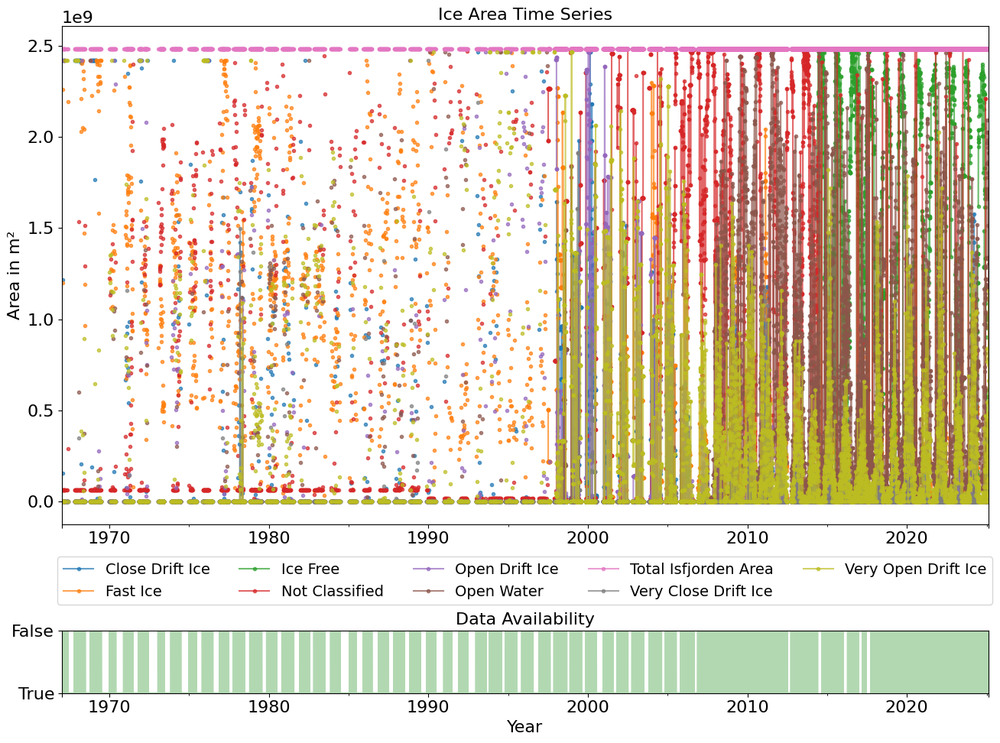

In [32]:
fig, axs = plt.subplots(2, 1, figsize=(14, 10), gridspec_kw={'height_ratios': [8, 1]}, sharex=True)

# --- Set Global Font Sizes ---
plt.rcParams.update({
    'font.size': 16,          # The baseline size for everything
    'axes.titlesize': 16,     # Subplot title size
    'axes.labelsize': 16,     # X and Y axis label size
    'xtick.labelsize': 16,    # X axis tick labels (the numbers)
    'ytick.labelsize': 16,    # Y axis tick labels (the numbers)
    'legend.fontsize': 14,    # Legend text size
    'legend.title_fontsize': 16 # Legend title size
})
# Plot only non-"Data Availability" columns in upper plot
columns_to_plot = time_series_isfjorden_modified.columns.difference(["Data Availability"])
time_series_isfjorden_modified.loc['1967':'2025', columns_to_plot].plot(
    ax=axs[0], marker='o', markersize=3, alpha=0.7
)
axs[0].tick_params(labelbottom=True)
axs[0].set_title("Ice Area Time Series")
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Area in m²')
# Assuming you meant 3 columns to spread it horizontally. 
# Adjust ncol if you strictly need a specific number of rows based on your total variables.
axs[0].legend(loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=5)

# Plot "Data Availability" in lower subplot
axs[1].plot(
    time_series_isfjorden_modified.loc['1967':'2025'].index,
    time_series_isfjorden_modified.loc['1967':'2025']["Data Availability"],
    color='green', alpha=0.3
)
# axs[1].set_ylabel('Data Availability')
# axs[1].set_xlabel('Year')
# axs[1].set_ylim(0, 1)

axs[1].set_yticks([0, 1])
axs[1].set_ylim(0, 1)
axs[1].set_yticklabels(["True", "False"])
axs[1].set_title("Data Availability")
axs[1].set_xlabel('Year')

plt.tight_layout(h_pad=0.5)
plt.show()


### wow.... satellite evolution looks cool :)

### but lets break it down into 10 - year chunks for better readability

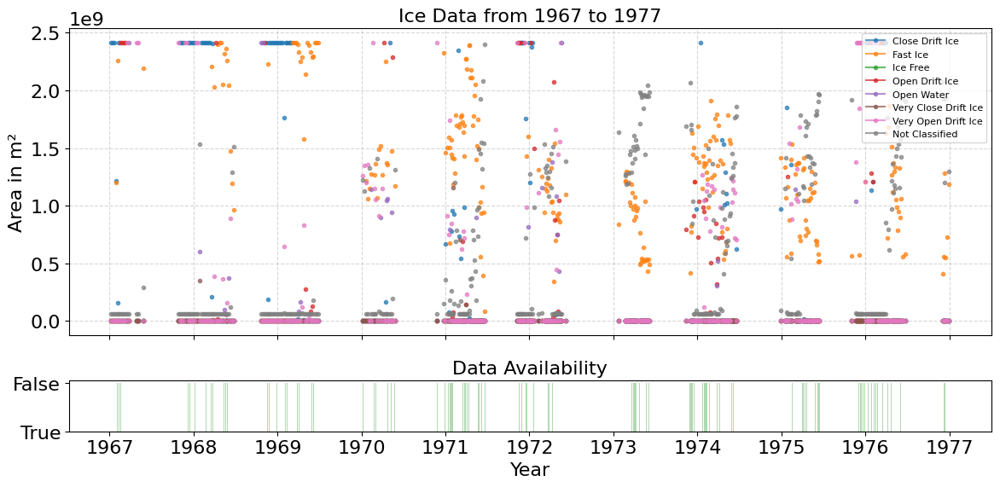

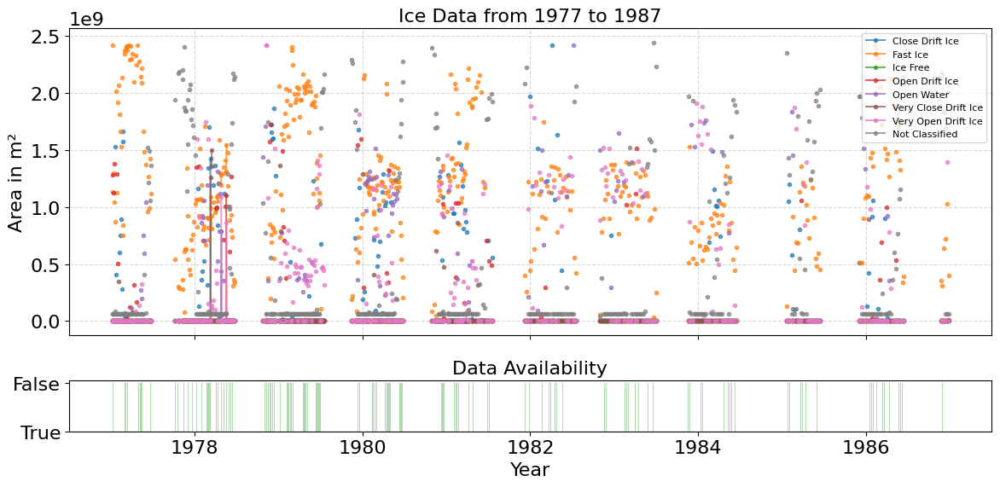

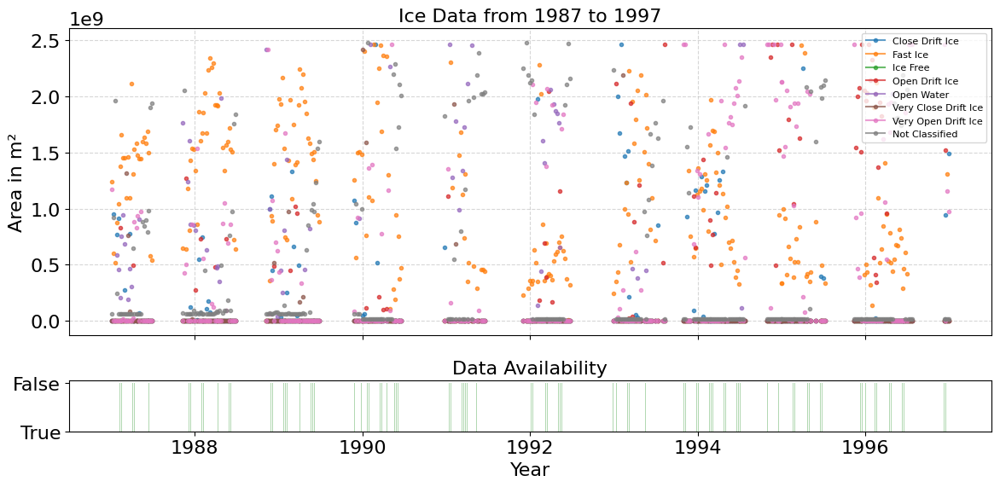

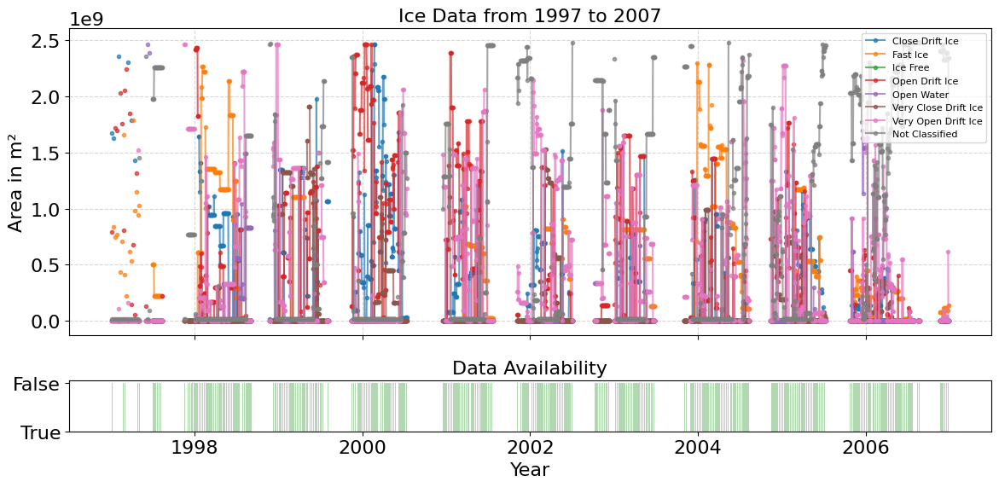

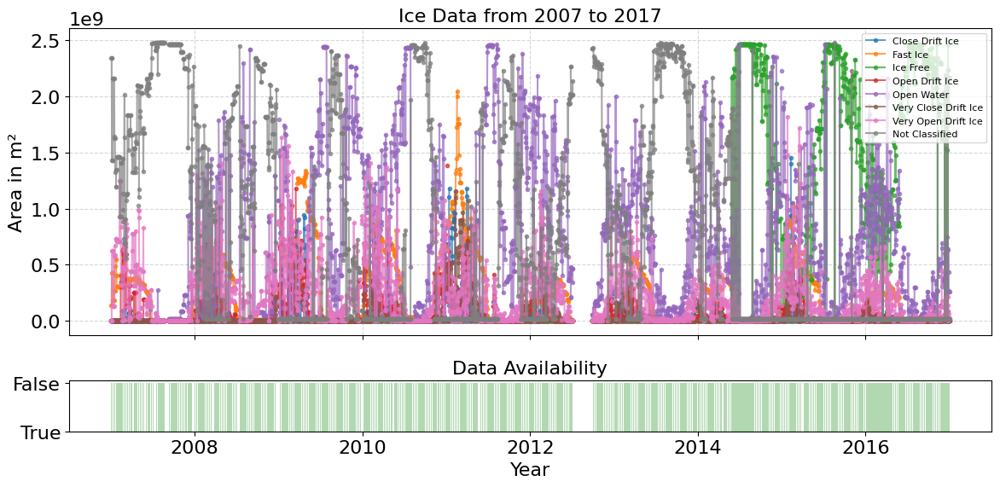

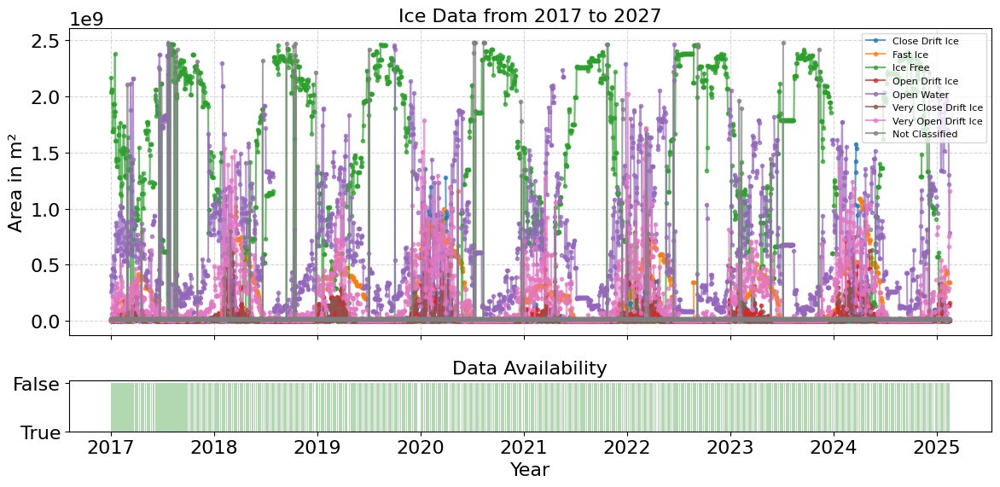

In [33]:
# Ensure datetime index
time_series_isfjorden_modified.index = pd.to_datetime(time_series_isfjorden_modified.index)

# Determine first and last year
start_year = time_series_isfjorden_modified.index.year.min()
end_year = time_series_isfjorden_modified.index.year.max()

# Get ice-related columns (excluding "Total Isfjorden Area" and "Data Availability")
ice_columns = [col for col in time_series_isfjorden_modified.columns if col not in ["Total Isfjorden Area", "Data Availability"]]


bar_width = timedelta(days=1)  # Width of 1 day


# Define 10-year chunks and plot all ice types with a data availability strip
for year in range(start_year, end_year, 10):
    start = f"{year}-01-01"
    end = f"{year+10}-01-01"
    
    # Filter data for this chunk
    chunk_data = time_series_isfjorden_modified.loc[start:end]

    # Create figure with two subplots (4:1 ratio)
    fig, axs = plt.subplots(2, 1, figsize=(12, 6), gridspec_kw={'height_ratios': [6, 1]}, sharex=True)

    # --- Top Subplot: Ice Data ---
    for column in ice_columns:
        axs[0].plot(chunk_data.index, chunk_data[column], label=column, linestyle='-', marker='o', markersize=3, alpha=0.7)

    axs[0].set_title(f"Ice Data from {year} to {year+10}")
    axs[0].set_ylabel("Area in m²")
    axs[0].legend(loc="upper right", fontsize=8)
    axs[0].grid(True, linestyle='--', alpha=0.5)  # Light grid for readability

    # --- Bottom Subplot: Data Availability ---
    axs[1].bar(chunk_data.index, chunk_data["Data Availability"], color='green', alpha=0.3, width=bar_width, align='center')
    
 
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(["True", "False"])

    axs[1].set_title("Data Availability")

    # Formatting
    axs[1].set_xlabel("Year")

    # Show plot
    plt.tight_layout()
    plt.show()


### next to each other...

/tmp/ipykernel_53377/952275106.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 1])


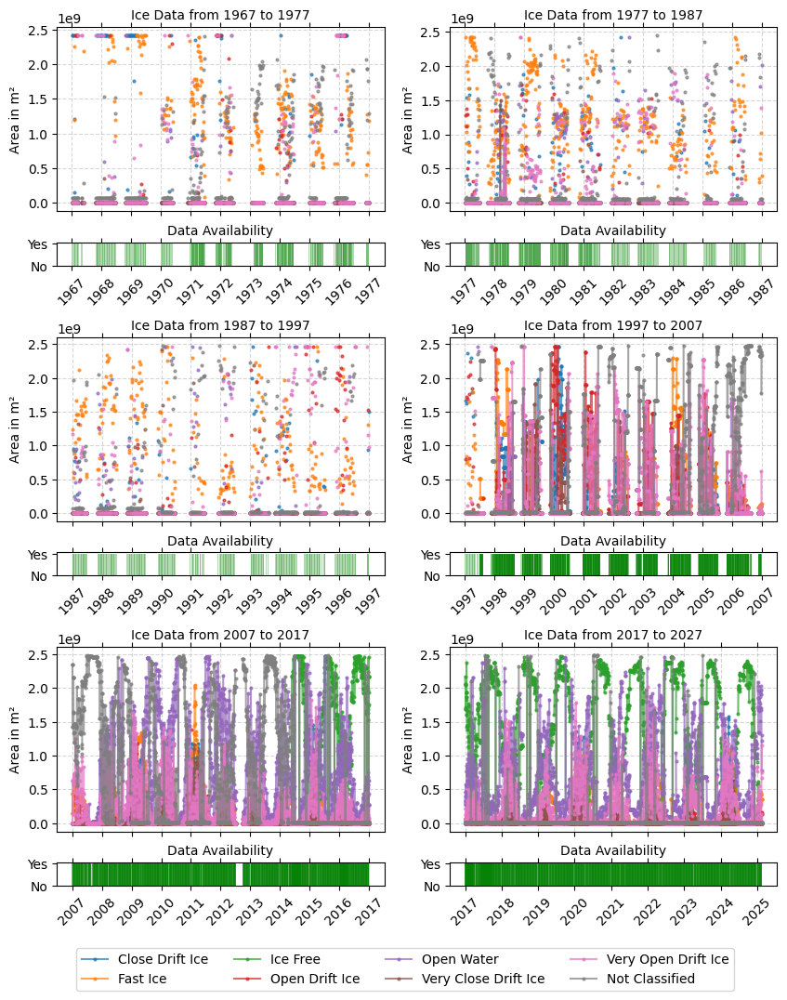

In [34]:


# --- Master variables for easily adjusting formatting ---
X_TICK_SIZE = 10
Y_TICK_SIZE = 10
TITLE_SIZE = 10
LABEL_SIZE = 10
INNER_HSPACE = 0.3  # --- NEW: Adjust this value to change the distance between the two subplots

# Ensure datetime index
time_series_isfjorden_modified.index = pd.to_datetime(time_series_isfjorden_modified.index)

# Year range
start_year = time_series_isfjorden_modified.index.year.min()
end_year = time_series_isfjorden_modified.index.year.max()

# Ice columns
ice_columns = [col for col in time_series_isfjorden_modified.columns if col not in ["Total Isfjorden Area", "Data Availability"]]
bar_width = timedelta(days=10)

# Set figsize to A4 Portrait format (Width: 8.27, Height: 11.69)
fig = plt.figure(figsize=(10, 12))

outer_grid = gridspec.GridSpec(3, 2, wspace=0.2, hspace=0.3)

# Loop through the 10-year chunks
for i, year in enumerate(range(start_year, end_year, 10)):
    start = f"{year}-01-01"
    end = f"{year+10}-01-01"
    chunk_data = time_series_isfjorden_modified.loc[start:end]

    inner_grid = gridspec.GridSpecFromSubplotSpec(
        2, 1, subplot_spec=outer_grid[i],
        height_ratios=[8, 1],
        hspace=INNER_HSPACE  # --- NEW: Uses the master variable to control vertical gap
    )

    # --- Ice Data Plot (top) ---
    ax_top = plt.Subplot(fig, inner_grid[0])
    for column in ice_columns:
        ax_top.plot(chunk_data.index, chunk_data[column], label=column, linestyle='-', marker='o', markersize=2, alpha=0.7)
    
    ax_top.set_title(f"Ice Data from {year} to {year+10}", fontsize=TITLE_SIZE)
    ax_top.set_ylabel("Area in m²", fontsize=LABEL_SIZE)
    ax_top.grid(True, linestyle='--', alpha=0.5)
    # ax_top.legend(loc="upper right", fontsize=6)
    
    ax_top.tick_params(axis='x', labelbottom=False, top=True, bottom=True)
    ax_top.tick_params(axis='y', labelsize=Y_TICK_SIZE)
    ax_top.yaxis.get_offset_text().set_fontsize(Y_TICK_SIZE)
    
    fig.add_subplot(ax_top)

    # --- Data Availability Plot (bottom) ---
    ax_bottom = plt.Subplot(fig, inner_grid[1], sharex=ax_top)
    
    ax_bottom.bar(chunk_data.index, chunk_data["Data Availability"], color='green', alpha=0.3, width=bar_width, align='center')
    ax_bottom.set_yticks([0, 1])
    ax_bottom.set_yticklabels(["No", "Yes"], fontsize=Y_TICK_SIZE)
    ax_bottom.set_title("Data Availability", fontsize=TITLE_SIZE, pad=6) 
    
    ax_bottom.tick_params(axis='x', labelbottom=True, labelsize=X_TICK_SIZE, rotation=45, top=True, bottom=True)
    ax_bottom.tick_params(axis='y', labelsize=Y_TICK_SIZE)
    
    # --- NEW: Force the x-axis to show exactly one tick per year, formatted as 'YYYY'
    ax_bottom.xaxis.set_major_locator(mdates.YearLocator())
    ax_bottom.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    fig.add_subplot(ax_bottom)

# Final layout adjustment
# --- Add a single Figure-level Legend ---
# 1. Get the legend items from the very last 'ax_top' created in the loop
handles, labels = ax_top.get_legend_handles_labels()

# 2. Draw the legend on the Figure itself. 
# We use len(ice_columns) for 'ncol' so every ice type gets its own column (perfectly horizontal)
# Note: If you have a ton of columns, you might want to hardcode ncol=4 or ncol=5 so it wraps neatly.
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.01), ncol=4, fontsize=LABEL_SIZE)

# 3. Final layout adjustment
# The 'rect' parameter tells tight_layout to reserve the bottom 5% of the figure for our new legend
plt.tight_layout(rect=[0, 0.04, 1, 1])
plt.show()

### Now combine types to make it more readable

In [35]:
def combine_ice_types(df):

    time_series_df = df.copy()
    
    # Combine drift ice columns
    time_series_df["Drift Ice"] = time_series_df["Close Drift Ice"] + time_series_df["Open Drift Ice"] + time_series_df["Very Close Drift Ice"] + time_series_df["Very Open Drift Ice"]

    # Combine "Open Water" and "Ice Free" columns
    time_series_df["Water"] = time_series_df["Open Water"] + time_series_df["Ice Free"]

    # Select relevant columns
    combined_df = time_series_df[["Fast Ice", "Drift Ice", "Water", "Total Isfjorden Area", "Not Classified", "Data Availability"]]

    return combined_df

# Create the combined DataFrame
time_series_isfjorden_modified_combined = combine_ice_types(time_series_isfjorden_modified)

# Print the result to verify
print(time_series_isfjorden_modified_combined)


norway_ice      Fast Ice     Drift Ice         Water  Total Isfjorden Area  \
1967-01-07  0.000000e+00  2.417074e+09  0.000000e+00          2.481701e+09   
1967-01-08           NaN           NaN           NaN                   NaN   
1967-01-09           NaN           NaN           NaN                   NaN   
1967-01-10           NaN           NaN           NaN                   NaN   
1967-01-11           NaN           NaN           NaN                   NaN   
...                  ...           ...           ...                   ...   
2025-02-10  3.474404e+08  4.175781e+08  1.701215e+09          2.481701e+09   
2025-02-11  3.470118e+08  4.460002e+08  1.673221e+09          2.481701e+09   
2025-02-12  3.470118e+08  8.163175e+08  1.302904e+09          2.481701e+09   
2025-02-13  3.470118e+08  9.040636e+08  1.215158e+09          2.481701e+09   
2025-02-14  3.470119e+08  1.335132e+09  7.840889e+08          2.481701e+09   

norway_ice  Not Classified  Data Availability  
1967-01-07    6

### and visualize

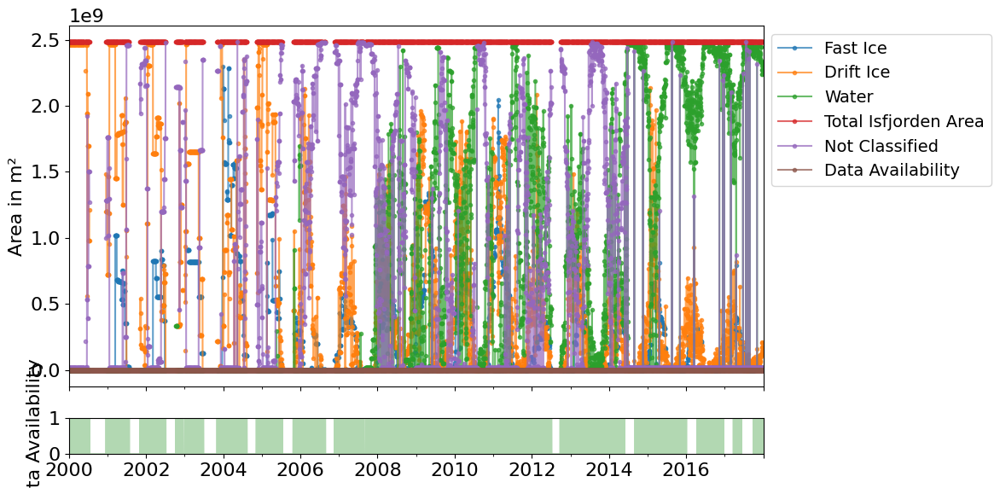

In [36]:
fig, axs = plt.subplots(2, 1, figsize=(12, 6), gridspec_kw={'height_ratios': [10, 1]}, sharex=True)

plot_start_date = '2000'
plot_end_date = '2017'

# Plot the ice area time series on the first y-axis
time_series_isfjorden_modified_combined.loc[plot_start_date:plot_end_date].plot(ax=axs[0], marker='o', markersize=3, alpha=0.7)
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Area in m²')
axs[0].legend(bbox_to_anchor=(1, 1.0))


axs[1].plot(time_series_isfjorden_modified_combined.loc[plot_start_date:plot_end_date].index, 
         time_series_isfjorden_modified_combined.loc[plot_start_date:plot_end_date]["Data Availability"], 
         color='green', alpha=0.3)
axs[1].set_ylabel('Data Availability')
axs[1].set_ylim(0, 1)


plt.tight_layout()
plt.show()

### lets check out more recent data...

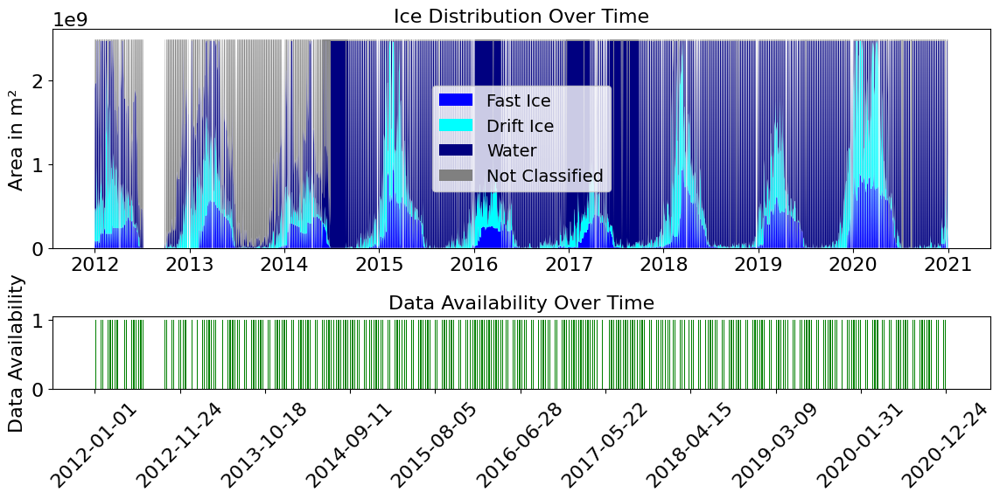

In [37]:


def plot_ice_data(df, start_date, end_date, color_spec):
    # Convert index to datetime if not already
    df.index = pd.to_datetime(df.index)
    
    # Filter data based on the provided date range
    df_filtered = df.loc[start_date:end_date]
    
    # Ensure numerical values and fill NaNs with 0 for plotting
    df_filtered = df_filtered.fillna(0)
    
    # Extract only the necessary columns
    ice_columns = ['Fast Ice', 'Drift Ice', 'Water', 'Not Classified']
    df_filtered = df_filtered[ice_columns + ['Data Availability']]
    
    # Create figure and subplots
    fig, axes = plt.subplots(2, 1, figsize=(12, 6), gridspec_kw={'height_ratios': [3, 1]})
    
    # Create stack plot
    axes[0].stackplot(df_filtered.index, 
                       [df_filtered[col] for col in ice_columns], 
                       labels=ice_columns, 
                       colors=[color_spec[col] for col in ice_columns])
    
    # Format the x-axis
    axes[0].set_ylabel('Area in m²')
    axes[0].set_title('Ice Distribution Over Time')
    axes[0].legend()
    
    # Create bar plot for Data Availability
    data_avail = df_filtered['Data Availability']
    axes[1].bar(df_filtered.index, data_avail, color=['green' if v == 1 else 'red' for v in data_avail], width=0.5)
    
    # Formatting
    axes[1].set_ylabel('Data Availability')
    axes[1].set_yticks([0, 1])
    axes[1].set_xticks(df_filtered.index[::max(1, len(df_filtered) // 10)])
    axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    axes[1].set_title('Data Availability Over Time')
    axes[1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

# Example color specification
default_color_spec = {
    'Fast Ice': 'blue',
    'Drift Ice': 'cyan',
    'Water': 'navy',
    'Not Classified': 'gray'
}





# Plot the ice data for the specified date range
plot_ice_data(time_series_isfjorden_modified_combined, '2012-01-01', '2020-12-31', default_color_spec)

### change to bar plot and new color :)

In [38]:
def plot_ice_data_bar(df, start_date, end_date, color_spec, percentage=False, bar_width_data_availibility=10):
    # Convert index to datetime if not already
    df.index = pd.to_datetime(df.index)
    
    # Filter data based on the provided date range
    df_filtered = df.loc[start_date:end_date]
    
    # Ensure numerical values and fill NaNs with 0 for plotting
    df_filtered = df_filtered.fillna(0)
    
    # Extract only the necessary columns
    ice_columns = ['Fast Ice', 'Drift Ice', 'Water', 'Not Classified']
    df_filtered = df_filtered[ice_columns + ['Total Isfjorden Area', 'Data Availability']]
    
    # Scale ice columns to percentage if requested
    if percentage:
        df_filtered[ice_columns] = df_filtered[ice_columns].div(df_filtered['Total Isfjorden Area'], axis=0) * 100
        y_label = 'Percentage of Total Area in %'
    else:
        y_label = 'Area in m²'
    
    # Create figure and subplots with shared x-axis
    fig, axes = plt.subplots(2, 1, figsize=(12, 6), gridspec_kw={'height_ratios': [10, 1]}, sharex=True)
    
    # Create stacked bar plot
    bottom = np.zeros(len(df_filtered))
    for col in ice_columns:
        axes[0].bar(df_filtered.index, df_filtered[col], label=col, color=color_spec[col], bottom=bottom, width=1)
        bottom += df_filtered[col].values
    
    # Format the first subplot
    axes[0].set_ylabel(y_label)
    axes[0].set_title('Ice Distribution Over Time')
    axes[0].legend(bbox_to_anchor=(1, 1.0))
    
    # Create bar plot for Data Availability
    data_avail = df_filtered['Data Availability']
    axes[1].bar(df_filtered.index, data_avail, color=['green' if v == 1 else 'red' for v in data_avail], width=bar_width_data_availibility, alpha=0.3)
    
    # Formatting
    axes[1].set_ylabel('Data Availability')
    axes[1].set_yticks([0, 1])
    axes[1].set_yticklabels(["No Data", "Data"])
    axes[1].set_xlabel('Year')
    
    # Set x-ticks to every year on January 1st
    years = pd.date_range(start=df_filtered.index.min(), end=df_filtered.index.max(), freq='YS')
    axes[1].set_xticks(years)
    axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].grid(axis='x', linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_53377/2240236170.py:53: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/hugo/uni/master/seaicetimeseries/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


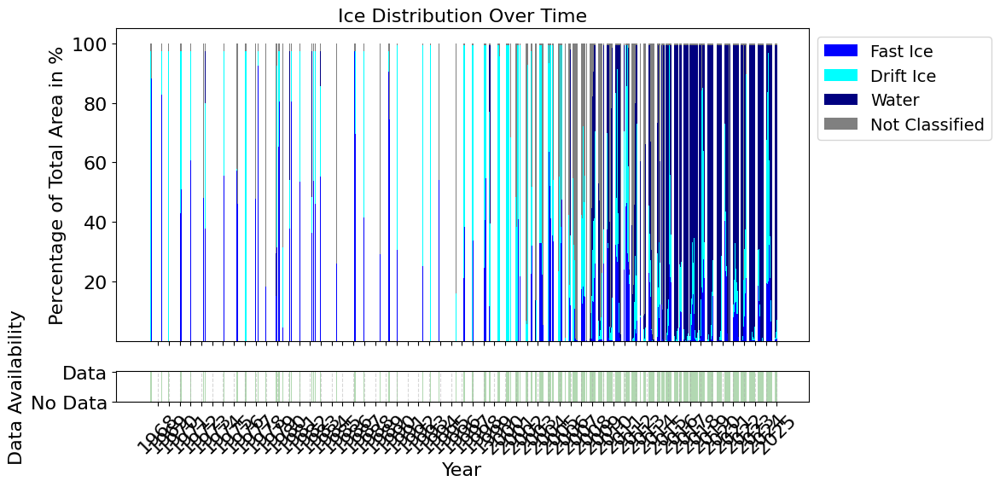

/tmp/ipykernel_53377/2240236170.py:53: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/hugo/uni/master/seaicetimeseries/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


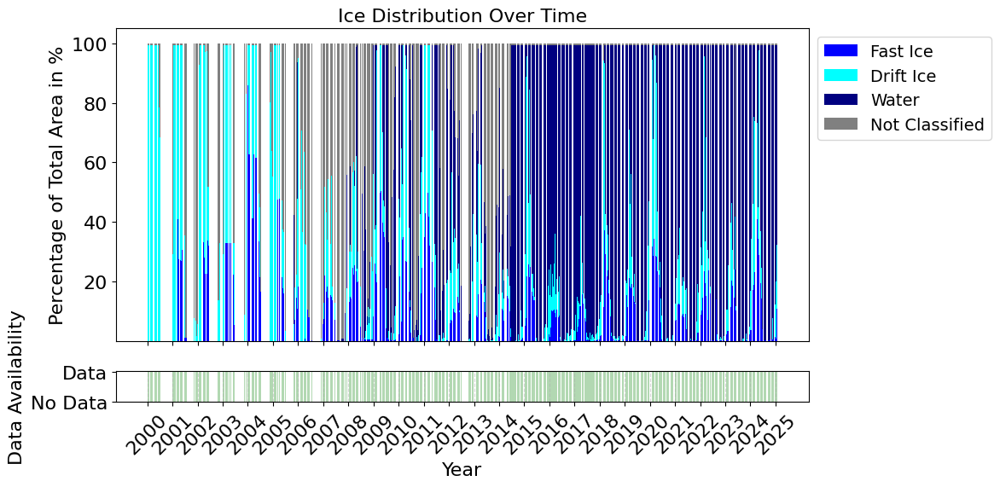

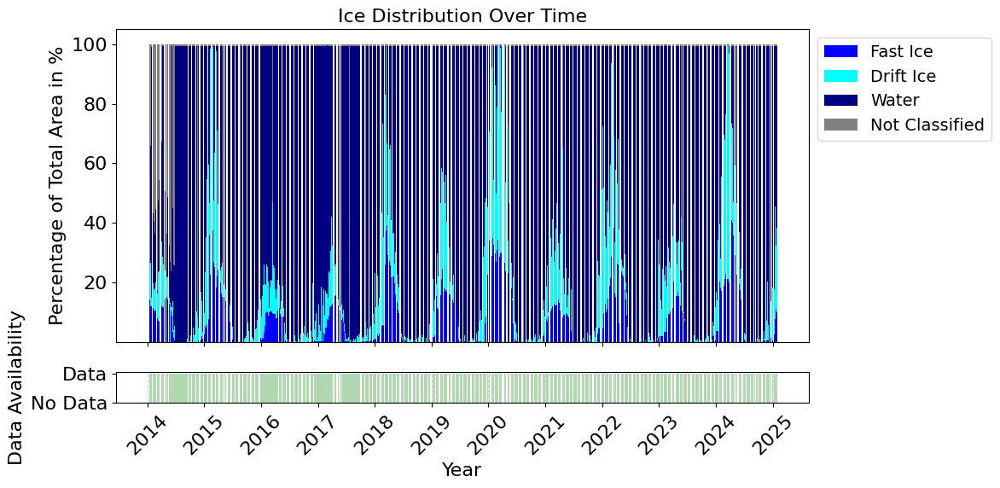

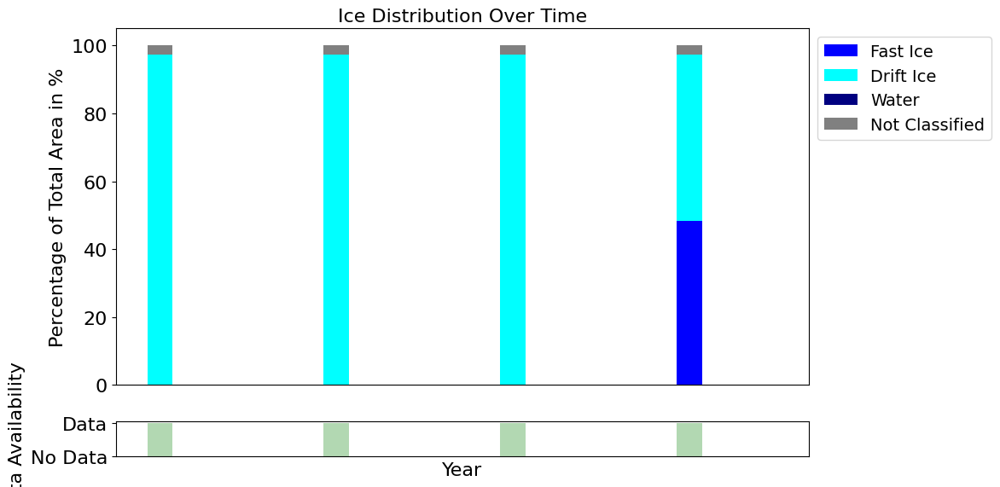

In [39]:
plot_ice_data_bar(time_series_isfjorden_modified_combined, '1967-01-01', '2025-1-31', default_color_spec, percentage=True, bar_width_data_availibility=1)
plot_ice_data_bar(time_series_isfjorden_modified_combined, '2000-01-01', '2025-1-31', default_color_spec, percentage=True, bar_width_data_availibility=1)
plot_ice_data_bar(time_series_isfjorden_modified_combined, '2014-01-01', '2025-1-31', default_color_spec, percentage=True, bar_width_data_availibility=1)
plot_ice_data_bar(time_series_isfjorden_modified_combined, '1967-01-01', '1967-1-31', default_color_spec, percentage=True, bar_width_data_availibility=1)

### all next to each other and drop data availability...

/tmp/ipykernel_53377/2070684164.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


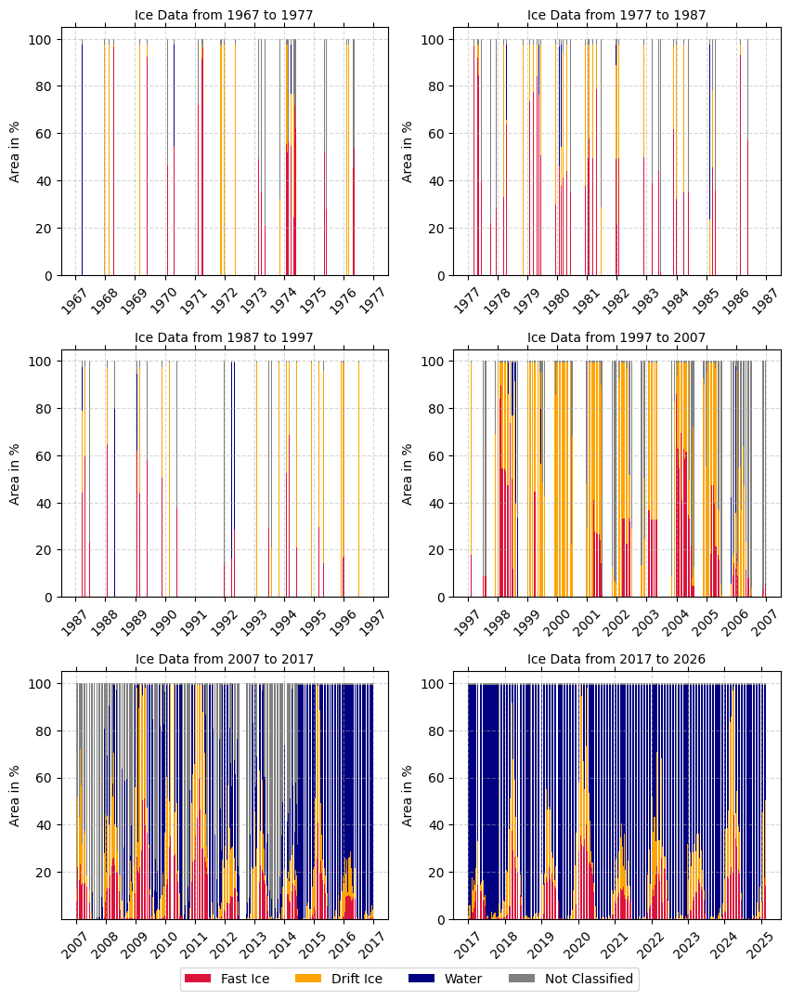

In [40]:

# --- Master variables for easy adjustments ---
TITLE_SIZE = 10
LABEL_SIZE = 10
X_TICK_SIZE = 10
Y_TICK_SIZE = 10
LEGEND_SIZE = 10


# Figure dimensions and spacing
FIG_WIDTH = 10   # Width in inches
FIG_HEIGHT = 12  # Height in inches (10:12 ratio)
HSPACE = 0.3     # Controls vertical distance between rows
WSPACE = 0.2     # Controls horizontal distance between columns


# Example color specification
default_color_spec = {
    'Fast Ice': 'crimson',
    'Drift Ice': 'orange',
    'Water': 'navy',
    'Not Classified': 'gray'
}

def plot_ice_data_bar_chunks(df, color_spec, percentage=True):
    df.index = pd.to_datetime(df.index)
    
    start_year = df.index.year.min()
    end_year = df.index.year.max()

    years = list(range(start_year, end_year, 10))
    if years[-1] < end_year:
        years.append(end_year + 1)  # Ensure coverage of the final interval

    num_chunks = len(years) - 1
    nrows, ncols = 3, 2  

    # Reverted to a simple grid since we dropped the bottom subplots
    fig, axs = plt.subplots(nrows, ncols, figsize=(FIG_WIDTH, FIG_HEIGHT), sharex=False,
                            gridspec_kw={'hspace': HSPACE, 'wspace': WSPACE})

    ice_columns = ['Fast Ice', 'Drift Ice', 'Water', 'Not Classified']

    for i in range(min(num_chunks, nrows * ncols)):
        row = i // ncols
        col = i % ncols
        
        # Select the specific subplot axis
        ax = axs[row, col]

        start_date = f"{years[i]}-01-01"
        end_date = f"{years[i+1]}-01-01"

        df_chunk = df.loc[start_date:end_date].copy().fillna(0)

        # Apply percentage calculation if True
        if percentage:
            df_chunk[ice_columns] = df_chunk[ice_columns].div(df_chunk['Total Isfjorden Area'], axis=0) * 100

        # --- Ice distribution plotting ---
        bottom = np.zeros(len(df_chunk))
        for colname in ice_columns:
            ax.bar(df_chunk.index, df_chunk[colname],
                   label=colname, bottom=bottom,
                   color=color_spec[colname], width=1)
            bottom += df_chunk[colname].values

        # Apply formatting from master variables
        ax.set_title(f"Ice Data from {years[i]} to {years[i+1]}", fontsize=TITLE_SIZE)
        ax.set_ylabel("Area in %", fontsize=LABEL_SIZE)
        # ax.legend(fontsize=LEGEND_SIZE, loc='upper left')
        ax.grid(True, linestyle='--', alpha=0.5)
        
        # Format the x-axis with yearly ticks
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        
        # Markers on top/bottom, text rotated to 45 degrees
        ax.tick_params(axis='x', labelbottom=True, top=True, bottom=True, rotation=45, labelsize=X_TICK_SIZE)
        ax.tick_params(axis='y', labelsize=Y_TICK_SIZE)

    # Hide unused axes (if you have fewer than 6 chunks of data)
    for j in range(num_chunks, nrows * ncols):
        row = j // ncols
        col = j % ncols
        axs[row, col].axis('off')


    # --- Add a single Figure-level Legend ---
    # 1. Get the handles and labels from the very last 'ax' we plotted on
    handles, labels = ax.get_legend_handles_labels()

    # 2. Draw the legend on the Figure itself. 
    # ncol=len(ice_columns) automatically makes it horizontal
    fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.01), 
               ncol=len(ice_columns), fontsize=LABEL_SIZE)

    # 3. Apply layout and spacing
    plt.tight_layout()
    # Note the new 'bottom=0.08' argument here. 
    # This prevents the x-axis labels of the bottom charts from crashing into the new legend.
    plt.subplots_adjust(hspace=HSPACE, wspace=WSPACE, bottom=0.08) 
    plt.show()

# Example execution:
plot_ice_data_bar_chunks(time_series_isfjorden_modified_combined, default_color_spec, percentage=True)

### save the time series to NetCdf

In [41]:
time_series_isfjorden_modified_combined

norway_ice,Fast Ice,Drift Ice,Water,Total Isfjorden Area,Not Classified,Data Availability
1967-01-07,0.000000e+00,2.417074e+09,0.000000e+00,2.481701e+09,6.462694e+07,1
1967-01-08,NaN,NaN,NaN,NaN,NaN,0
1967-01-09,NaN,NaN,NaN,NaN,NaN,0
1967-01-10,NaN,NaN,NaN,NaN,NaN,0
1967-01-11,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...
2025-02-10,3.474404e+08,4.175781e+08,1.701215e+09,2.481701e+09,1.546814e+07,1
2025-02-11,3.470118e+08,4.460002e+08,1.673221e+09,2.481701e+09,1.546814e+07,1
2025-02-12,3.470118e+08,8.163175e+08,1.302904e+09,2.481701e+09,1.546814e+07,1
2025-02-13,3.470118e+08,9.040636e+08,1.215158e+09,2.481701e+09,1.546814e+07,1


In [42]:
# 1. Create a safe copy of your original dataframe
seaIceN = time_series_isfjorden_modified_combined.copy()

# 2. Ensure your index is a datetime type and standardly named
seaIceN.index = pd.to_datetime(seaIceN.index)
seaIceN.index.name = 'time'

In [43]:
seaIceN

norway_ice,Fast Ice,Drift Ice,Water,Total Isfjorden Area,Not Classified,Data Availability
time,,,,,,
1967-01-07,0.000000e+00,2.417074e+09,0.000000e+00,2.481701e+09,6.462694e+07,1
1967-01-08,NaN,NaN,NaN,NaN,NaN,0
1967-01-09,NaN,NaN,NaN,NaN,NaN,0
1967-01-10,NaN,NaN,NaN,NaN,NaN,0
1967-01-11,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...
2025-02-10,3.474404e+08,4.175781e+08,1.701215e+09,2.481701e+09,1.546814e+07,1
2025-02-11,3.470118e+08,4.460002e+08,1.673221e+09,2.481701e+09,1.546814e+07,1
2025-02-12,3.470118e+08,8.163175e+08,1.302904e+09,2.481701e+09,1.546814e+07,1


In [44]:

# 3. Convert to an xarray Dataset with your requested variable name
seaIceNetCDF = xr.Dataset.from_dataframe(seaIceN)

# 4. Add Global Attributes (Metadata)
# General Information
seaIceNetCDF.attrs['title'] = 'Isfjorden Sea Ice Time Series'
seaIceNetCDF.attrs['summary'] = 'Daily time series of ice cover types in Isfjorden, Svalbard.'

# Creator Information
seaIceNetCDF.attrs['creator_name'] = 'Martin Lindlmayer'
seaIceNetCDF.attrs['creator_email'] = 'martin.lindlmayer@outlook.com'
# seaIceNetCDF.attrs['institution'] = 'Your University or Organization' # Optional, but good practice

# Data Provenance (Crucial for traceability)
seaIceNetCDF.attrs['source'] = 'Derived from original sea ice shapefiles provided by MET Norway.'
seaIceNetCDF.attrs['history'] = 'Processed and combined from MET Norway .shp files to a daily time series.'

# Variable-specific metadata
area_variables = ['Fast Ice', 'Drift Ice', 'Water', 'Total Isfjorden Area', 'Not Classified']
for var in area_variables:
    if var in seaIceNetCDF:
        seaIceNetCDF[var].attrs['units'] = 'square_meters'  
        seaIceNetCDF[var].attrs['long_name'] = var

seaIceNetCDF['Data Availability'].attrs['long_name'] = 'Binary indicator of data availability (1=Yes, 0=No)'

# 5. Export to the new, clean output filename in a specific folder
output_folder = "/home/hugo/uni/master/seaicetimeseries/data/dataExport"
filename = "seaIceIsfjorden.nc"

# Highly recommended: Create the folder if it doesn't exist yet
# (exist_ok=True prevents an error if the folder is already there)
os.makedirs(output_folder, exist_ok=True)

# Cleanly join the folder path and the filename
output_path = os.path.join(output_folder, filename)

# Export using the full path
seaIceNetCDF.to_netcdf(output_path)

print(f"Successfully exported to:\n{output_path}\nwith full metadata.")

Successfully exported to:
/home/hugo/uni/master/seaicetimeseries/data/dataExport/seaIceIsfjorden.nc
with full metadata.


### same for the one before combining ice types...

In [45]:
time_series_isfjorden_modified

norway_ice,Close Drift Ice,Fast Ice,Ice Free,Open Drift Ice,Open Water,Very Close Drift Ice,Very Open Drift Ice,Total Isfjorden Area,Not Classified,Data Availability
1967-01-07,2.417074e+09,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.000000e+00,2.481701e+09,6.462694e+07,1
1967-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1967-01-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1967-01-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1967-01-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...
2025-02-10,1.339680e+07,3.474404e+08,0.0,1.363973e+08,1.701215e+09,0.0,2.677840e+08,2.481701e+09,1.546814e+07,1
2025-02-11,1.339680e+07,3.470118e+08,0.0,1.391046e+08,1.673221e+09,0.0,2.934988e+08,2.481701e+09,1.546814e+07,1
2025-02-12,1.339680e+07,3.470118e+08,0.0,1.391046e+08,1.302904e+09,0.0,6.638161e+08,2.481701e+09,1.546814e+07,1
2025-02-13,1.339680e+07,3.470118e+08,0.0,1.391046e+08,1.215158e+09,0.0,7.515622e+08,2.481701e+09,1.546814e+07,1


In [46]:


# 1. Create a safe copy using a distinct name
seaIceDetailedN = time_series_isfjorden_modified.copy()

# 2. Ensure your index is a datetime type and standardly named
seaIceDetailedN.index = pd.to_datetime(seaIceDetailedN.index)
seaIceDetailedN.index.name = 'time'

# 3. Convert to an xarray Dataset
seaIceDetailedNetCDF = xr.Dataset.from_dataframe(seaIceDetailedN)

# 4. Add Global Attributes (Metadata)
# General Information
seaIceDetailedNetCDF.attrs['title'] = 'Detailed Isfjorden Sea Ice Time Series'
seaIceDetailedNetCDF.attrs['summary'] = 'Daily time series of uncombined ice cover types in Isfjorden, Svalbard.'

# Creator Information
seaIceDetailedNetCDF.attrs['creator_name'] = 'Martin Lindlmayer'
seaIceDetailedNetCDF.attrs['creator_email'] = 'martin.lindlmayer@outlook.com'
# seaIceDetailedNetCDF.attrs['institution'] = 'Your University or Organization'

# Data Provenance
seaIceDetailedNetCDF.attrs['source'] = 'Derived from original sea ice shapefiles provided by MET Norway.'
seaIceDetailedNetCDF.attrs['history'] = 'Processed from MET Norway .shp files to a daily time series. Preserves specific drift ice and open water categories.'

# Variable-specific metadata (Updated list for your uncombined columns)
area_variables = [
    'Close Drift Ice', 'Fast Ice', 'Ice Free', 'Open Drift Ice', 
    'Open Water', 'Very Close Drift Ice', 'Very Open Drift Ice', 
    'Total Isfjorden Area', 'Not Classified'
]

for var in area_variables:
    if var in seaIceDetailedNetCDF:
        seaIceDetailedNetCDF[var].attrs['units'] = 'square_meters'  
        seaIceDetailedNetCDF[var].attrs['long_name'] = var

seaIceDetailedNetCDF['Data Availability'].attrs['long_name'] = 'Binary indicator of data availability (1=Yes, 0=No)'


# 5. Export to the new, clean output filename in a specific folder
output_folder = "/home/hugo/uni/master/seaicetimeseries/data/dataExport"
filename = 'seaIceIsfjorden_Detailed.nc'

# Highly recommended: Create the folder if it doesn't exist yet
# (exist_ok=True prevents an error if the folder is already there)
os.makedirs(output_folder, exist_ok=True)

# Cleanly join the folder path and the filename
output_path = os.path.join(output_folder, filename)

# Export using the full path
seaIceNetCDF.to_netcdf(output_path)

print(f"Successfully exported to:\n{output_path}\nwith full metadata.")

Successfully exported to:
/home/hugo/uni/master/seaicetimeseries/data/dataExport/seaIceIsfjorden_Detailed.nc
with full metadata.


## compare with muckenhuber dataset

### get Muckenhuber Data

In [47]:
# Define path to file
file_path = '/home/hugo/uni/master/seaicetimeseries/data/muckenhuber/isfjorden_icecover.txt'

# Read the file
muckenhuber_df = pd.read_csv(
    file_path, 
    sep=r'\t+',  # handles irregular tab spacing
    engine='python',
    skiprows=1       # Skip the first metadata row
)


# Combine year, month, day into a datetime column
muckenhuber_df['date'] = pd.to_datetime(muckenhuber_df[['year', 'month', 'day']])

# Set the datetime as index
muckenhuber_df.set_index('date', inplace=True)

# Optional: Drop separate year/month/day columns if not needed
# muckenhuber_df.drop(columns=['year', 'month', 'day'], inplace=True)

# Preview the first few rows
#print(muckenhuber_df)


# Find duplicated dates (keep=False marks all instances of the duplicate, not just the second)
duplicated_dates = muckenhuber_df.index[muckenhuber_df.index.duplicated(keep=False)]

# Extract and display rows with duplicated dates
duplicates_df = muckenhuber_df.loc[duplicated_dates]

# Optional: sort by date to make inspection easier
duplicates_df = duplicates_df.sort_index()


# Drop the 'satellite_instrument' column
muckenhuber_df_cleaned = muckenhuber_df.drop(columns=['satellite_instrument'])

# Group by date index and compute the mean to resolve duplicates
muckenhuber_df_cleaned = muckenhuber_df_cleaned.groupby(muckenhuber_df_cleaned.index).mean()

# Confirm no more duplicates exist
assert not muckenhuber_df_cleaned.index.duplicated().any(), "Duplicates still present"

# Optional: display result
# print(muckenhuber_df_cleaned)


# Ensure the index is datetime and sorted
muckenhuber_df_cleaned = muckenhuber_df_cleaned.sort_index()

# Create a complete daily index from the first to last date
full_date_range = pd.date_range(start=muckenhuber_df_cleaned.index.min(), end=muckenhuber_df_cleaned.index.max(), freq='D')

# Reindex the dataframe to the full daily range, filling gaps with NaN
muckenhuber_df_daily = muckenhuber_df_cleaned.reindex(full_date_range)
muckenhuber_df_daily.index.name = 'date'        


In [48]:
muckenhuber_df_daily.loc['2012-06-20':'2012-07-20']


,year,month,day,open water [m^2],fast ice [m^2],drift ice [m^2],total area [m^2]
date,,,,,,,
2012-06-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-06-21,2012.0,6.0,21.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-06-22,2012.0,6.0,22.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-06-23,2012.0,6.0,23.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-06-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-06-25,2012.0,6.0,25.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-06-26,2012.0,6.0,26.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-06-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-06-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Interpolation for missing dates

#### Interpolate Muckenhuber by using short and long period

In [49]:
# Start with a copy of the full daily date dataframe
df_muckenhuber_interpolated_shortLong = muckenhuber_df_daily.copy()

# Known total area of the fjord
KNOWN_TOTAL_AREA = 2.487594e+09
df_muckenhuber_interpolated_shortLong['total area [m^2]'] = df_muckenhuber_interpolated_shortLong['total area [m^2]'].fillna(KNOWN_TOTAL_AREA)

# Loop over years from 2000 to 2025
for year in range(2000, 2026):
    # ----------- WINTER SEASON -----------
    if year <= 2005:
        winter_start = pd.Timestamp(f"{year}-03-01")
        winter_end = pd.Timestamp(f"{year}-06-30")
    else:
        winter_start = pd.Timestamp(f"{year - 1}-11-01")
        winter_end = pd.Timestamp(f"{year}-06-30")

    # Skip winter if outside data range
    if winter_start > df_muckenhuber_interpolated_shortLong.index.max():
        continue

    for boundary_date in [winter_start, winter_end]:
        if boundary_date in df_muckenhuber_interpolated_shortLong.index:
            row = df_muckenhuber_interpolated_shortLong.loc[boundary_date]
            is_all_na = row[['open water [m^2]', 'fast ice [m^2]', 'drift ice [m^2]']].isna().all()
        else:
            is_all_na = True

        if is_all_na:
            df_muckenhuber_interpolated_shortLong.loc[boundary_date] = {
                'open water [m^2]': KNOWN_TOTAL_AREA,
                'fast ice [m^2]': 0.0,
                'drift ice [m^2]': 0.0,
                'total area [m^2]': KNOWN_TOTAL_AREA,
                'year': boundary_date.year,
                'month': boundary_date.month,
                'day': boundary_date.day,
            }

    df_muckenhuber_interpolated_shortLong = df_muckenhuber_interpolated_shortLong.sort_index()

    winter_slice = df_muckenhuber_interpolated_shortLong.loc[winter_start:winter_end]
    winter_interpolated = winter_slice[['open water [m^2]', 'fast ice [m^2]', 'drift ice [m^2]']].interpolate(
        method='linear', limit_direction='both'
    )
    df_muckenhuber_interpolated_shortLong.loc[winter_start:winter_end, ['open water [m^2]', 'fast ice [m^2]', 'drift ice [m^2]']] = winter_interpolated

    # ----------- SUMMER SEASON -----------
    summer_start = pd.Timestamp(f"{year}-07-01")
    summer_end = pd.Timestamp(f"{year}-10-31")

    # Skip summer if outside data range
    if summer_start > df_muckenhuber_interpolated_shortLong.index.max():
        continue

    for boundary_date in [summer_start, summer_end]:
        if boundary_date in df_muckenhuber_interpolated_shortLong.index:
            row = df_muckenhuber_interpolated_shortLong.loc[boundary_date]
            is_all_na = row[['open water [m^2]', 'fast ice [m^2]', 'drift ice [m^2]']].isna().all()
        else:
            is_all_na = True

        if is_all_na:
            df_muckenhuber_interpolated_shortLong.loc[boundary_date] = {
                'open water [m^2]': KNOWN_TOTAL_AREA,
                'fast ice [m^2]': 0.0,
                'drift ice [m^2]': 0.0,
                'total area [m^2]': KNOWN_TOTAL_AREA,
                'year': boundary_date.year,
                'month': boundary_date.month,
                'day': boundary_date.day,
            }

    df_muckenhuber_interpolated_shortLong = df_muckenhuber_interpolated_shortLong.sort_index()

    summer_slice = df_muckenhuber_interpolated_shortLong.loc[summer_start:summer_end]
    summer_interpolated = summer_slice[['open water [m^2]', 'fast ice [m^2]', 'drift ice [m^2]']].interpolate(
        method='linear', limit_direction='both'
    )
    df_muckenhuber_interpolated_shortLong.loc[summer_start:summer_end, ['open water [m^2]', 'fast ice [m^2]', 'drift ice [m^2]']] = summer_interpolated

# Final sort to ensure order
df_interpolated_shortLong = df_muckenhuber_interpolated_shortLong.sort_index()


df_muckenhuber_interpolated_shortLong['2012-10-20':'2012-10-30']


,year,month,day,open water [m^2],fast ice [m^2],drift ice [m^2],total area [m^2]
date,,,,,,,
2012-10-20,NaN,NaN,NaN,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-21,NaN,NaN,NaN,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-22,NaN,NaN,NaN,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-23,2012.0,10.0,23.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-24,2012.0,10.0,24.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-25,NaN,NaN,NaN,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-26,2012.0,10.0,26.0,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-27,NaN,NaN,NaN,2.487594e+09,0.0,0.0,2.487594e+09
2012-10-28,NaN,NaN,NaN,2.487594e+09,0.0,0.0,2.487594e+09


### rename columns to match

In [50]:
# Define renaming map
rename_dict = {
    'fast ice [m^2]': 'Fast Ice',
    'drift ice [m^2]': 'Drift Ice',
    'open water [m^2]': 'Water',
    'total area [m^2]': 'Total Isfjorden Area'
}

# Apply renaming
df_muckenhuber_interpolated_shortLong = df_muckenhuber_interpolated_shortLong.rename(columns=rename_dict)
muckenhuber_df_daily = muckenhuber_df_daily.rename(columns=rename_dict)


### Interpolate my data

In [51]:
df_interp = time_series_isfjorden_modified_combined.copy()

# Fill missing Total Isfjorden Area with first valid value
first_total_area = df_interp["Total Isfjorden Area"].dropna().iloc[0]
df_interp["Total Isfjorden Area"] = df_interp["Total Isfjorden Area"].fillna(first_total_area)

# Loop over years from 1967 to 2025
for year in range(1967, 2026):

    # ----------- WINTER SEASON -----------
    if year <= 2005:
        winter_start = pd.Timestamp(f"{year}-03-01")
        winter_end = pd.Timestamp(f"{year}-06-30")
    else:
        winter_start = pd.Timestamp(f"{year - 1}-11-01")
        winter_end = pd.Timestamp(f"{year}-06-30")

    if winter_start > df_interp.index.max():
        continue

    for boundary_date in [winter_start, winter_end]:
        if boundary_date in df_interp.index:
            row = df_interp.loc[boundary_date]
            is_all_na = row[['Water', 'Fast Ice', 'Drift Ice']].isna().all()
        else:
            is_all_na = True

        if is_all_na:
            df_interp.loc[boundary_date] = {
                'Water': first_total_area,
                'Fast Ice': 0.0,
                'Drift Ice': 0.0,
                'Total Isfjorden Area': first_total_area,
            }

    df_interp = df_interp.sort_index()
    winter_slice = df_interp.loc[winter_start:winter_end]
    winter_interp = winter_slice[['Water', 'Fast Ice', 'Drift Ice']].interpolate(method='linear', limit_direction='both')
    df_interp.loc[winter_start:winter_end, ['Water', 'Fast Ice', 'Drift Ice']] = winter_interp

    # ----------- SUMMER SEASON -----------
    summer_start = pd.Timestamp(f"{year}-07-01")
    summer_end = pd.Timestamp(f"{year}-10-31")

    if summer_start > df_interp.index.max():
        continue

    if year <= 2005:
        continue  # don't interpolate summer for pre-2006
    else:
        summer_slice = df_interp.loc[summer_start:summer_end].copy()

        # Detect full NaN rows for the three columns
        ice_cols = ['Water', 'Fast Ice', 'Drift Ice']
        all_nan = summer_slice[ice_cols].isna().all(axis=1)

        if all_nan.sum() == 0:
            # No full NaN block, interpolate as usual
            interp_values = summer_slice[ice_cols].interpolate(method='linear', limit_direction='both')
            df_interp.loc[summer_start:summer_end, ice_cols] = interp_values
        else:
            # Detect consecutive NaN gaps
            summer_slice["gap_id"] = (all_nan != all_nan.shift()).cumsum()
            for gap_id, group in summer_slice.groupby("gap_id"):
                if not all_nan[group.index[0]]:
                    continue  # skip non-NaN block

                gap_len = len(group)
                if gap_len < 30:
                    continue  # not a big enough gap

                gap_start = group.index[0]
                gap_end = group.index[-1]

                # Find real data just before and after gap
                before_date = df_interp.loc[:gap_start].last_valid_index()
                after_date = df_interp.loc[gap_end:].first_valid_index()

                if before_date and (before_date + pd.Timedelta(days=1)) not in df_interp.index:
                    df_interp.loc[before_date + pd.Timedelta(days=1)] = {
                        'Water': first_total_area,
                        'Fast Ice': 0.0,
                        'Drift Ice': 0.0,
                        'Total Isfjorden Area': first_total_area
                    }

                if after_date and (after_date - pd.Timedelta(days=1)) not in df_interp.index:
                    df_interp.loc[after_date - pd.Timedelta(days=1)] = {
                        'Water': first_total_area,
                        'Fast Ice': 0.0,
                        'Drift Ice': 0.0,
                        'Total Isfjorden Area': first_total_area
                    }

            df_interp = df_interp.sort_index()
            # Interpolate whole summer season again
            summer_slice_updated = df_interp.loc[summer_start:summer_end]
            summer_interp = summer_slice_updated[ice_cols].interpolate(method='linear', limit_direction='both')
            df_interp.loc[summer_start:summer_end, ice_cols] = summer_interp

# Final sort to ensure chronological order
df_interp = df_interp.sort_index()

# Recalculate Not Classified
df_interp["Not Classified"] = df_interp["Total Isfjorden Area"] - df_interp[["Water", "Fast Ice", "Drift Ice"]].sum(axis=1, skipna=True)


In [52]:
print(time_series_isfjorden_modified_combined['1968-06-1':'1968-06-30'])
print(df_interp['1968-06-1':'1968-06-30'])

norway_ice      Fast Ice     Drift Ice         Water  Total Isfjorden Area  \
1968-06-01           NaN           NaN           NaN                   NaN   
1968-06-02           NaN           NaN           NaN                   NaN   
1968-06-03  2.043424e+09  0.000000e+00  3.736500e+08          2.481701e+09   
1968-06-04           NaN           NaN           NaN                   NaN   
1968-06-05           NaN           NaN           NaN                   NaN   
1968-06-06           NaN           NaN           NaN                   NaN   
1968-06-07           NaN           NaN           NaN                   NaN   
1968-06-08           NaN           NaN           NaN                   NaN   
1968-06-09           NaN           NaN           NaN                   NaN   
1968-06-10  1.471163e+09  8.913558e+08  0.000000e+00          2.481701e+09   
1968-06-11           NaN           NaN           NaN                   NaN   
1968-06-12           NaN           NaN           NaN            

### export the interpolated data to NetCDF

In [53]:
# 1. Create a safe copy of the interpolated dataframe
seaIceInterpN = df_interp.copy()

# 2. Ensure your index is a datetime type and standardly named
seaIceInterpN.index = pd.to_datetime(seaIceInterpN.index)
seaIceInterpN.index.name = 'time'

# 3. Convert to an xarray Dataset
seaIceInterpNetCDF = xr.Dataset.from_dataframe(seaIceInterpN)

# 4. Add Global Attributes (Metadata)
# General Information
seaIceInterpNetCDF.attrs['title'] = 'Interpolated Isfjorden Sea Ice Time Series'
seaIceInterpNetCDF.attrs['summary'] = 'Daily time series of combined ice cover types in Isfjorden, Svalbard, with missing observation days temporally interpolated.'

# Creator Information
seaIceInterpNetCDF.attrs['creator_name'] = 'Martin Lindlmayer'
seaIceInterpNetCDF.attrs['creator_email'] = 'martin.lindlmayer@outlook.com'
# seaIceInterpNetCDF.attrs['institution'] = 'University of Bergen'

# Data Provenance
seaIceInterpNetCDF.attrs['source'] = 'Derived from original sea ice shapefiles provided by MET Norway.'
seaIceInterpNetCDF.attrs['history'] = 'Processed from MET Norway .shp files, grouped into broad categories, and temporally interpolated to fill missing data gaps.'

# Variable-specific metadata
area_variables = ['Fast Ice', 'Drift Ice', 'Water', 'Total Isfjorden Area', 'Not Classified']
for var in area_variables:
    if var in seaIceInterpNetCDF:
        seaIceInterpNetCDF[var].attrs['units'] = 'square_meters'  
        seaIceInterpNetCDF[var].attrs['long_name'] = var

# Update the Data Availability description to clarify its meaning in the interpolated context
if 'Data Availability' in seaIceInterpNetCDF:
    seaIceInterpNetCDF['Data Availability'].attrs['long_name'] = 'Binary indicator of original data availability prior to interpolation (1=Real Observation, 0=Interpolated Day)'


# 5. Export to the new, clean output filename in a specific folder
output_folder = "/home/hugo/uni/master/seaicetimeseries/data/dataExport"
filename = 'seaIceIsfjorden_Interpolated.nc'

# Highly recommended: Create the folder if it doesn't exist yet
# (exist_ok=True prevents an error if the folder is already there)
os.makedirs(output_folder, exist_ok=True)

# Cleanly join the folder path and the filename
output_path = os.path.join(output_folder, filename)

# Export using the full path
seaIceNetCDF.to_netcdf(output_path)

print(f"Successfully exported to:\n{output_path}\nwith full metadata.")

Successfully exported to:
/home/hugo/uni/master/seaicetimeseries/data/dataExport/seaIceIsfjorden_Interpolated.nc
with full metadata.


## Plotting

### compare interpolated and non-interpolated dataset

In [54]:
# --- Master Variables for Easy Adjustment ---
TITLE_FONT_SIZE = 10
LABEL_FONT_SIZE = 10
TICK_FONT_SIZE = 10
LEGEND_FONT_SIZE = 10

# Figure dimensions (10 to 12 ratio)
FIG_WIDTH = 10
FIG_HEIGHT = 12

# Subplot spacing
HSPACE = 0.2  # Vertical distance between rows

# Line thickness
THRESHOLD_LINE_WIDTH = 1.5

# Adjustable Colors for the Stacked Bars
ICE_COLORS = {
    'Fast Ice': 'crimson',
    'Drift Ice': 'orange',
    'Water': 'navy',
    'Not Classified': 'gray'
}

def plot_interpolation_comparison(
    original_df,
    interpolated_df,
    start_date,
    end_date,
    percentage=False,
    threshold_percent=15
):
    # Determine which ice columns are present in the dataframe
    possible_ice_columns = ['Fast Ice', 'Drift Ice', 'Water', 'Not Classified']
    ice_columns = [col for col in possible_ice_columns if col in original_df.columns and col in interpolated_df.columns]

    # --- Prepare Data ---
    original_df = original_df.copy()
    original_df.index = pd.to_datetime(original_df.index)
    original_df = original_df.loc[start_date:end_date].fillna(0)

    interpolated_df = interpolated_df.copy()
    interpolated_df.index = pd.to_datetime(interpolated_df.index)
    interpolated_df = interpolated_df.loc[start_date:end_date].fillna(0)

    if percentage:
        for df in [original_df, interpolated_df]:
            df[ice_columns] = df[ice_columns].div(df['Total Isfjorden Area'], axis=0) * 100
        y_label = 'Area in %'
    else:
        for df in [original_df, interpolated_df]:
            df[ice_columns] = df[ice_columns] / 1e6  # convert m² to km²
        y_label = 'Ice Classification Area (km²)'

    # --- Create Subplots ---
    fig, axes = plt.subplots(2, 1, figsize=(FIG_WIDTH, FIG_HEIGHT), sharex=True)

    # --- Plot Bars ---
    titles = ["Raw Sea Ice Classification", "Interpolated Sea Ice Classification"]
    
    for ax, df, title in zip(axes, [original_df, interpolated_df], titles):
        bottom = np.zeros(len(df))
        for col in ice_columns:
            # Use the ICE_COLORS dictionary from the master variables
            ax.bar(df.index, df[col], label=col,
                   color=ICE_COLORS[col], bottom=bottom, width=1)
            bottom += df[col].values

        if percentage:
            # Horizontal line at threshold_percent using THRESHOLD_LINE_WIDTH
            ax.axhline(y=threshold_percent, color='black', linestyle='--', 
                       linewidth=THRESHOLD_LINE_WIDTH, alpha=0.7,
                       label=f'Threshold: {threshold_percent}%')
            ax.set_ylim(0, 100)  # Set y-axis limit to 100 for percentage plots
            
        ax.set_title(title, fontsize=TITLE_FONT_SIZE)
        ax.set_ylabel(y_label, fontsize=LABEL_FONT_SIZE)
        ax.set_xlabel("Year", fontsize=LABEL_FONT_SIZE)
        ax.grid(True, axis='x', linestyle='--', alpha=0.5)
        # ax.legend(loc='upper left', fontsize=LEGEND_FONT_SIZE)

        # Apply yearly formatting and font sizes to BOTH subplots
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        # labelbottom=True forces the upper subplot to show its x-axis text even with sharex=True
        ax.tick_params(axis='x', rotation=45, labelsize=TICK_FONT_SIZE, labelbottom=True)
        ax.tick_params(axis='y', labelsize=TICK_FONT_SIZE)


# --- Add a single Figure-level Legend ---
    # 1. Get the handles and labels from the last 'ax' we plotted on
    handles, labels = ax.get_legend_handles_labels()

    # 2. Draw the legend on the Figure itself. 
    # Using len(handles) ensures it stays 1 row whether the threshold line is present or not
    fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.01), 
               ncol=len(handles), fontsize=LEGEND_FONT_SIZE)

    # 3. Apply layout and spacing
    # We add bottom=0.1 to leave 10% of the figure height completely empty for the legend
    plt.subplots_adjust(hspace=HSPACE, bottom=0.1)
    plt.show()
    


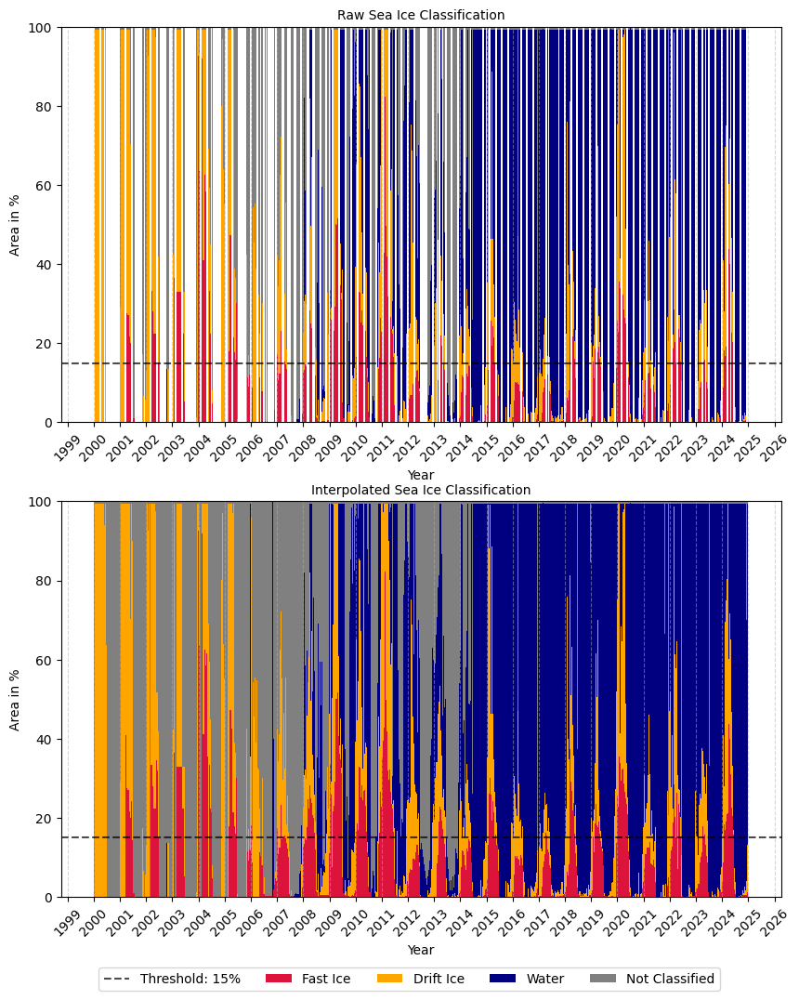

In [55]:
plot_interpolation_comparison(
    original_df=time_series_isfjorden_modified_combined,
    interpolated_df=df_interp,
    start_date="2000-01-01",
    end_date="2025-01-01",
    percentage=True,
    threshold_percent=15
)

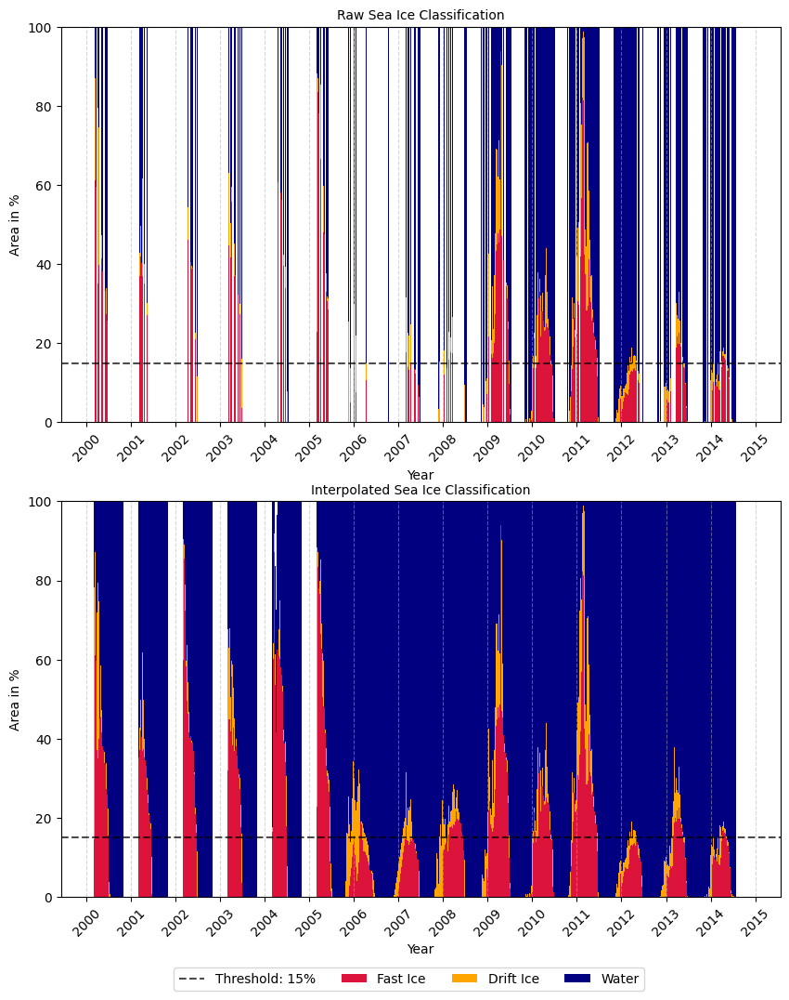

In [56]:
plot_interpolation_comparison(
    original_df=muckenhuber_df_daily,
    interpolated_df=df_muckenhuber_interpolated_shortLong,
    start_date="2000-01-01",
    end_date="2025-01-01",
    percentage=True,
    threshold_percent=15
)

### compare muckenhuber and my data (remove combined legend)

In [57]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

# --- Master Variables for Easy Adjustment ---
TITLE_FONT_SIZE = 10
LABEL_FONT_SIZE = 10
TICK_FONT_SIZE = 9
LEGEND_FONT_SIZE = 8

# Figure dimensions (10 to 12 ratio)
FIG_WIDTH = 10
FIG_HEIGHT = 12

# Subplot spacing
HSPACE = 0.2  # Vertical distance between rows

# Line thickness
THRESHOLD_LINE_WIDTH = 1.5

# Adjustable Colors for the Stacked Bars
ICE_COLORS = {
    'Fast Ice': 'crimson',
    'Drift Ice': 'orange',
    'Water': 'navy',
    'Not Classified': 'gray'
}

def plot_interpolation_comparison2(
    original_df,
    interpolated_df,
    start_date,
    end_date,
    percentage=False,
    threshold_percent=15
):
    # Determine which ice columns are present in AT LEAST ONE dataframe
    possible_ice_columns = ['Fast Ice', 'Drift Ice', 'Water', 'Not Classified']
    ice_columns = [col for col in possible_ice_columns if col in original_df.columns or col in interpolated_df.columns]

    # --- NEW: Track which columns actually belong to which dataset before we add 0s ---
    orig_actual_cols = [col for col in ice_columns if col in original_df.columns]
    interp_actual_cols = [col for col in ice_columns if col in interpolated_df.columns]

    # --- Prepare Data ---
    original_df = original_df.copy()
    original_df.index = pd.to_datetime(original_df.index)
    original_df = original_df.loc[start_date:end_date].fillna(0)

    interpolated_df = interpolated_df.copy()
    interpolated_df.index = pd.to_datetime(interpolated_df.index)
    interpolated_df = interpolated_df.loc[start_date:end_date].fillna(0)

    # Ensure both dataframes have all the active ice columns (fill missing with 0s)
    for col in ice_columns:
        if col not in original_df.columns:
            original_df[col] = 0
        if col not in interpolated_df.columns:
            interpolated_df[col] = 0

    if percentage:
        for df in [original_df, interpolated_df]:
            df[ice_columns] = df[ice_columns].div(df['Total Isfjorden Area'], axis=0) * 100
        y_label = 'Area in %'
    else:
        for df in [original_df, interpolated_df]:
            df[ice_columns] = df[ice_columns] / 1e6  # convert m² to km²
        y_label = 'Ice Classification Area (km²)'

    # --- Create Subplots ---
    fig, axes = plt.subplots(2, 1, figsize=(FIG_WIDTH, FIG_HEIGHT), sharex=True)

    # --- Plot Bars ---
    titles = ["Sea Ice Cover - NIS Classification", "Sea Ice Cover - Muckenhuber Classification"]
    
    # We zip the actual_cols lists in so each subplot knows what it's allowed to label
    for ax, df, title, actual_cols in zip(axes, [original_df, interpolated_df], titles, [orig_actual_cols, interp_actual_cols]):
        bottom = np.zeros(len(df))
        for col in ice_columns:
            
            # --- NEW: If the column wasn't originally in the data, hide it from the legend ---
            bar_label = col if col in actual_cols else "_nolegend_"
            
            ax.bar(df.index, df[col], label=bar_label,
                   color=ICE_COLORS[col], bottom=bottom, width=1)
            bottom += df[col].values

        if percentage:
            # Horizontal line at threshold_percent using THRESHOLD_LINE_WIDTH
            ax.axhline(y=threshold_percent, color='black', linestyle='--', 
                       linewidth=THRESHOLD_LINE_WIDTH, alpha=0.7,
                       label=f'Threshold: {threshold_percent}%')
            ax.set_ylim(0, 100)  # Set y-axis limit to 100 for percentage plots
            
        ax.set_title(title, fontsize=TITLE_FONT_SIZE)
        ax.set_ylabel(y_label, fontsize=LABEL_FONT_SIZE)
        ax.set_xlabel("Year", fontsize=LABEL_FONT_SIZE)
        ax.grid(True, axis='x', linestyle='--', alpha=0.5)
        ax.legend(loc='upper left', fontsize=LEGEND_FONT_SIZE)

        # Apply yearly formatting and font sizes to BOTH subplots
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        # labelbottom=True forces the upper subplot to show its x-axis text even with sharex=True
        ax.tick_params(axis='x', rotation=45, labelsize=TICK_FONT_SIZE, labelbottom=True)
        ax.tick_params(axis='y', labelsize=TICK_FONT_SIZE)

    # Apply the adjustable vertical spacing
    plt.subplots_adjust(hspace=HSPACE)
    plt.show()

# plot_interpolation_comparison(
#     original_df=df_interp,
#     interpolated_df=df_muckenhuber_interpolated_shortLong,
#     start_date="2000-01-01",
#     end_date="2025-01-01",
#     percentage=True,
#     threshold_percent=15
# )

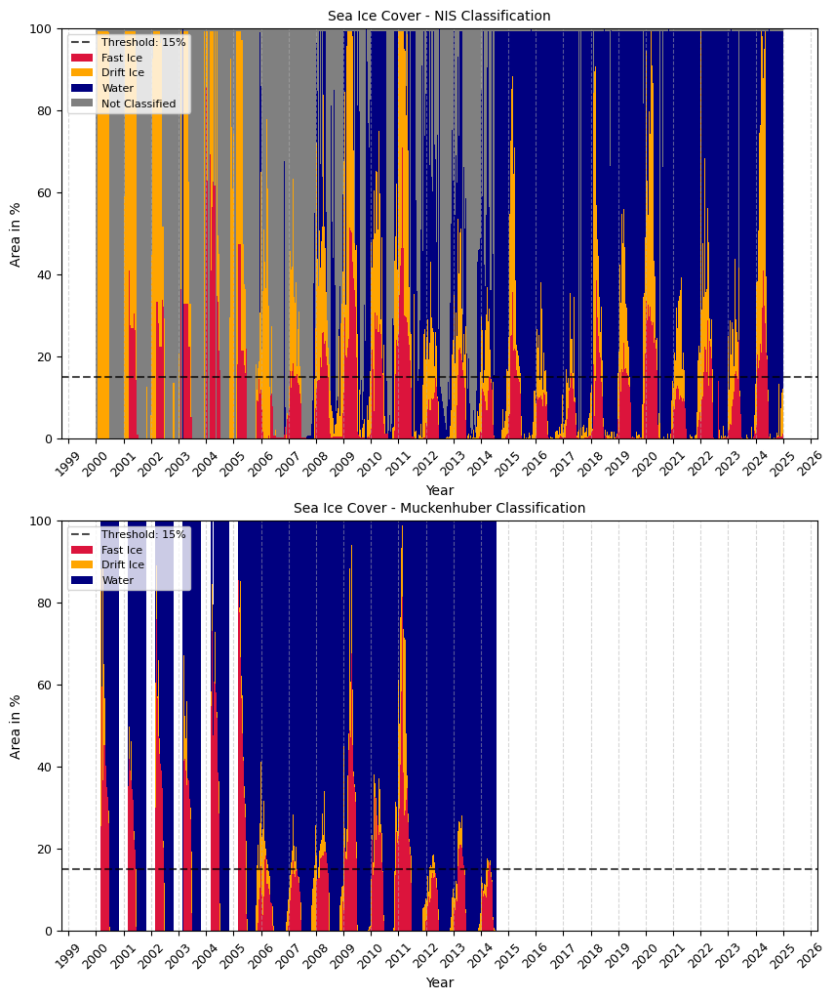

In [58]:
plot_interpolation_comparison2(
    original_df=df_interp,
    interpolated_df=df_muckenhuber_interpolated_shortLong,
    start_date="2000-01-01",
    end_date="2025-01-01",
    percentage=True,
    threshold_percent=15
)


## Analysis

### Calculating Days of Fast Ice

In [59]:
df_muckenhuber_interpolated_shortLong = df_muckenhuber_interpolated_shortLong.copy()
df_muckenhuber_interpolated_shortLong.index = pd.to_datetime(df_muckenhuber_interpolated_shortLong.index)


df_foo = df_interp.copy()
df_foo.index = pd.to_datetime(df_foo.index)


# Constants
MUCKENHUBER_AREA = 2487.6 * 1e6  # km² to m²

# Storage
results = []

for year in range(1967, 2025):
    # Date anchors
    long_start = pd.Timestamp(f"{year - 1}-11-01")
    long_end = pd.Timestamp(f"{year}-06-30")
    short_start = pd.Timestamp(f"{year}-03-01")
    short_end = long_end
    anchor_date = pd.Timestamp(f"{year}-01-01")

#     # --- My data ---
    long_season = df_foo.loc[long_start:long_end]
    short_season = df_foo.loc[short_start:short_end]

    if long_season.empty or short_season.empty:
        continue

    long_actual = (long_season["Fast Ice"] / long_season["Total Isfjorden Area"]).sum()
    short_actual = (short_season["Fast Ice"] / short_season["Total Isfjorden Area"]).sum()

    delta_actual = long_actual - short_actual

    # --- Interpolated Muckenhuber: df_interpolated_shortLong ---
    long_muckenhuber_interp_shortLong = df_muckenhuber_interpolated_shortLong.loc[long_start:long_end]
    short_muckenhuber_interp_shortLong = df_muckenhuber_interpolated_shortLong.loc[short_start:short_end]

    if long_muckenhuber_interp_shortLong.empty or short_muckenhuber_interp_shortLong.empty:
        long_interp_shortLong_dfi = np.nan
        short_interp_shortLong_dfi = np.nan
    else:
        long_interp_shortLong_dfi = (long_muckenhuber_interp_shortLong["Fast Ice"] / MUCKENHUBER_AREA).sum()
        short_interp_shortLong_dfi = (short_muckenhuber_interp_shortLong["Fast Ice"] / MUCKENHUBER_AREA).sum()

    delta_interp_shortLong = long_interp_shortLong_dfi - short_interp_shortLong_dfi

    # --- Append results ---
    results.append({
        "Date": anchor_date,
        "Year": year,
        "DFI_long": long_actual,
        "DFI_short": short_actual,
        "Delta_actual": delta_actual,
        "DFI_long_muckenhuber_interpolated_shortLong": long_interp_shortLong_dfi,
        "DFI_short_muckenhuber_interpolated_shortLong": short_interp_shortLong_dfi,
        "Delta_interp_shortLong": delta_interp_shortLong,
    })

# Create final DataFrame
dfi_df = pd.DataFrame(results).set_index("Date")


muckenhuber_dfi_full = {
    2000: {"DFI_short_muckenhuber": 46.0},
    2001: {"DFI_short_muckenhuber": 33.8},
    2002: {"DFI_short_muckenhuber": 52.2},
    2003: {"DFI_short_muckenhuber": 43.1},
    2004: {"DFI_short_muckenhuber": 70.7},
    2005: {"DFI_short_muckenhuber": 55.4},
    2006: {"DFI_long_muckenhuber": 19.4, "DFI_short_muckenhuber": 9.5},
    2007: {"DFI_long_muckenhuber": 19.3, "DFI_short_muckenhuber": 14.1},
    2008: {"DFI_long_muckenhuber": 28.5, "DFI_short_muckenhuber": 20.5},
    2009: {"DFI_long_muckenhuber": 61.6, "DFI_short_muckenhuber": 49.8},
    2010: {"DFI_long_muckenhuber": 34.9, "DFI_short_muckenhuber": 24.8},
    2011: {"DFI_long_muckenhuber": 68.7, "DFI_short_muckenhuber": 32.2},
    2012: {"DFI_long_muckenhuber": 16.9, "DFI_short_muckenhuber": 12.8},
    2013: {"DFI_long_muckenhuber": 22.7, "DFI_short_muckenhuber": 19.0},
    2014: {"DFI_long_muckenhuber": 18.0, "DFI_short_muckenhuber": 13.2},
}


# Add values to dfi_df
for year, values in muckenhuber_dfi_full.items():
    date_key = pd.Timestamp(f"{year}-01-01")
    for col, val in values.items():
        dfi_df.loc[date_key, col] = val

In [60]:
dfi_df['2000-01-01':'2025-01-01']

,Year,DFI_long,DFI_short,Delta_actual,DFI_long_muckenhuber_interpolated_shortLong,DFI_short_muckenhuber_interpolated_shortLong,Delta_interp_shortLong,DFI_short_muckenhuber,DFI_long_muckenhuber
Date,,,,,,,,,
2000-01-01,2000,0.000000,0.000000,0.000000,46.038139,46.038139,0.000000,46.0,NaN
2001-01-01,2001,27.709145,27.709145,0.000000,33.440957,33.153371,0.287586,33.8,NaN
2002-01-01,2002,30.976753,30.976753,0.000000,52.057130,51.662944,0.394187,52.2,NaN
2003-01-01,2003,40.031805,30.669677,9.362128,43.140987,42.659425,0.481561,43.1,NaN
2004-01-01,2004,79.968340,51.298509,28.669830,60.336111,60.336111,0.000000,70.7,NaN
2005-01-01,2005,33.892220,32.135322,1.756898,55.162161,54.931380,0.230781,55.4,NaN
2006-01-01,2006,13.886951,4.342014,9.544937,19.358702,9.534537,9.824165,9.5,19.4
2007-01-01,2007,25.562797,15.421525,10.141272,19.264531,14.136323,5.128209,14.1,19.3
2008-01-01,2008,33.581126,24.597957,8.983169,28.532982,20.458198,8.074784,20.5,28.5


### calc mean and std

In [61]:


# Calculate mean and std for the full period 2001-2025
dfi_full = dfi_df['2001-01-01':'2025-01-01']

mean_long_full = dfi_full['DFI_long'].mean()
std_long_full = dfi_full['DFI_long'].std()
mean_short_full = dfi_full['DFI_short'].mean()
std_short_full = dfi_full['DFI_short'].std()
mean_delta_full = dfi_full['Delta_actual'].mean()
std_delta_full = dfi_full['Delta_actual'].std()

# Calculate mean and std for 2001-2006
dfi_01_06 = dfi_df['2001-01-01':'2006-01-01']
mean_long_01_06 = dfi_01_06['DFI_long'].mean()
std_long_01_06 = dfi_01_06['DFI_long'].std()
mean_short_01_06 = dfi_01_06['DFI_short'].mean()
std_short_01_06 = dfi_01_06['DFI_short'].std()

# Calculate mean and std for 2006-2014
dfi_06_14 = dfi_df['2006-01-01':'2014-01-01']
mean_long_06_14 = dfi_06_14['DFI_long'].mean()
std_long_06_14 = dfi_06_14['DFI_long'].std()
mean_short_06_14 = dfi_06_14['DFI_short'].mean()
std_short_06_14 = dfi_06_14['DFI_short'].std()

# Calculate mean and std for 2014-2025
dfi_14_25 = dfi_df['2014-01-01':'2025-01-01']
mean_long_14_25 = dfi_14_25['DFI_long'].mean()
std_long_14_25 = dfi_14_25['DFI_long'].std()
mean_short_14_25 = dfi_14_25['DFI_short'].mean()
std_short_14_25 = dfi_14_25['DFI_short'].std()

print("2001-2025 Delta: mean =", mean_delta_full, ", std =", std_delta_full)
print("2001-2025 DFI_long: mean =", mean_long_full, ", std =", std_long_full)
print("2001-2025 DFI_short: mean =", mean_short_full, ", std =", std_short_full)
print("2001-2006 DFI_long: mean =", mean_long_01_06, ", std =", std_long_01_06)
print("2001-2006 DFI_short: mean =", mean_short_01_06, ", std =", std_short_01_06)
print("2006-2014 DFI_long: mean =", mean_long_06_14, ", std =", std_long_06_14)
print("2006-2014 DFI_short: mean =", mean_short_06_14, ", std =", std_short_06_14)
print("2014-2025 DFI_long: mean =", mean_long_14_25, ", std =", std_long_14_25)
print("2014-2025 DFI_short: mean =", mean_short_14_25, ", std =", std_short_14_25)

2001-2025 Delta: mean = 9.005531105232947 , std = 8.92249810703225
2001-2025 DFI_long: mean = 31.71016771270349 , std = 17.64079762334484
2001-2025 DFI_short: mean = 22.704636607470544 , std = 11.395590188019781
2001-2006 DFI_long: mean = 37.7442022267945 , std = 22.44378693325443
2001-2006 DFI_short: mean = 29.521903387231585 , std = 14.978634335173648
2006-2014 DFI_long: mean = 32.77246136542751 , std = 20.13840483209593
2006-2014 DFI_short: mean = 21.324536228581977 , std = 12.736107320012191
2014-2025 DFI_long: mean = 24.627190933139776 , std = 10.662471721626634
2014-2025 DFI_short: mean = 17.44605698062363 , std = 6.521473062884812


### compare muckenhuber's and my DFI values and prepare for correlation test

In [62]:
dfi_correlation = dfi_df.copy()
dfi_correlation = dfi_correlation[['DFI_long', 'DFI_short', 'DFI_short_muckenhuber', 'DFI_long_muckenhuber']]
dfi_correlation = dfi_correlation['2000-01-01':'2025-01-01']
dfi_correlation.loc[dfi_correlation.index[0], ['DFI_long', 'DFI_short']] = np.nan

dfi_correlation

,DFI_long,DFI_short,DFI_short_muckenhuber,DFI_long_muckenhuber
Date,,,,
2000-01-01,NaN,NaN,46.0,NaN
2001-01-01,27.709145,27.709145,33.8,NaN
2002-01-01,30.976753,30.976753,52.2,NaN
2003-01-01,40.031805,30.669677,43.1,NaN
2004-01-01,79.968340,51.298509,70.7,NaN
2005-01-01,33.892220,32.135322,55.4,NaN
2006-01-01,13.886951,4.342014,9.5,19.4
2007-01-01,25.562797,15.421525,14.1,19.3
2008-01-01,33.581126,24.597957,20.5,28.5


In [63]:


def corr_with_p(df, col1, col2):
    tmp = df[[col1, col2]].dropna()  # pairwise drop
    r, p = pearsonr(tmp[col1], tmp[col2])
    return r, p, len(tmp)

pairs = [
    ('DFI_long', 'DFI_short'),
    ('DFI_short', 'DFI_short_muckenhuber'),
    ('DFI_long', 'DFI_long_muckenhuber')
]

for c1, c2 in pairs:
    r, p, n = corr_with_p(dfi_correlation, c1, c2)
    print(f"{c1} vs {c2}: r={r:.3f}, p={p:.5f}, n={n}")

DFI_long vs DFI_short: r=0.899, p=0.00000, n=24
DFI_short vs DFI_short_muckenhuber: r=0.907, p=0.00001, n=14
DFI_long vs DFI_long_muckenhuber: r=0.983, p=0.00000, n=9


### Plot DFI comparison

In [64]:
dfi_df_plot = dfi_df.copy()
dfi_df_plot = dfi_df_plot['2000-01-01':'2025-01-01']
dfi_df_plot.loc[dfi_df_plot.index[0], ['DFI_long', 'DFI_short', 'Delta_actual']] = np.nan
dfi_df_plot


,Year,DFI_long,DFI_short,Delta_actual,DFI_long_muckenhuber_interpolated_shortLong,DFI_short_muckenhuber_interpolated_shortLong,Delta_interp_shortLong,DFI_short_muckenhuber,DFI_long_muckenhuber
Date,,,,,,,,,
2000-01-01,2000,NaN,NaN,NaN,46.038139,46.038139,0.000000,46.0,NaN
2001-01-01,2001,27.709145,27.709145,0.000000,33.440957,33.153371,0.287586,33.8,NaN
2002-01-01,2002,30.976753,30.976753,0.000000,52.057130,51.662944,0.394187,52.2,NaN
2003-01-01,2003,40.031805,30.669677,9.362128,43.140987,42.659425,0.481561,43.1,NaN
2004-01-01,2004,79.968340,51.298509,28.669830,60.336111,60.336111,0.000000,70.7,NaN
2005-01-01,2005,33.892220,32.135322,1.756898,55.162161,54.931380,0.230781,55.4,NaN
2006-01-01,2006,13.886951,4.342014,9.544937,19.358702,9.534537,9.824165,9.5,19.4
2007-01-01,2007,25.562797,15.421525,10.141272,19.264531,14.136323,5.128209,14.1,19.3
2008-01-01,2008,33.581126,24.597957,8.983169,28.532982,20.458198,8.074784,20.5,28.5


### 2000 - 2015

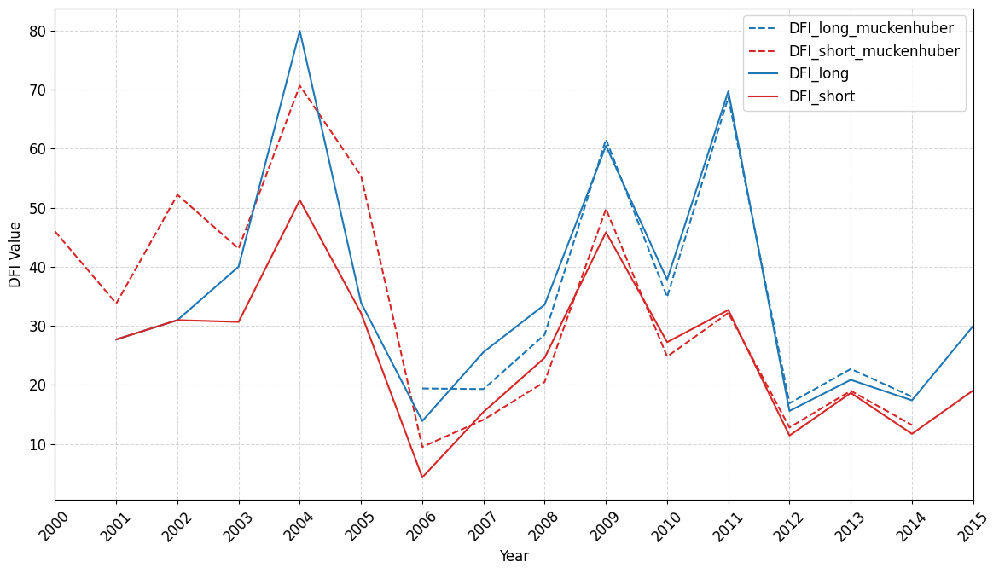

In [65]:
fig, ax = plt.subplots(figsize=(12, 7))

ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_long_muckenhuber"],
        label="DFI_long_muckenhuber", linestyle="--", color="tab:blue")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_short_muckenhuber"],
        label="DFI_short_muckenhuber", linestyle="--", color="tab:red")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_long"],
        label="DFI_long", linestyle="-", color="tab:blue")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_short"],
        label="DFI_short", linestyle="-", color="tab:red")

ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("DFI Value", fontsize=12)

# --- NEW: Set yearly ticks and format as 'YYYY' ---
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# --- UPDATED: Split tick_params to rotate the x-axis specifically ---
ax.tick_params(axis='x', labelsize=12, rotation=45) 
ax.tick_params(axis='y', labelsize=12) 

ax.legend(fontsize=12)
ax.grid(True, linestyle="--", alpha=0.5)
ax.set_xlim(pd.to_datetime('2000-01-01'),
            pd.to_datetime('2015-01-01'))

plt.tight_layout()
plt.show()

### 2000 - 2024:

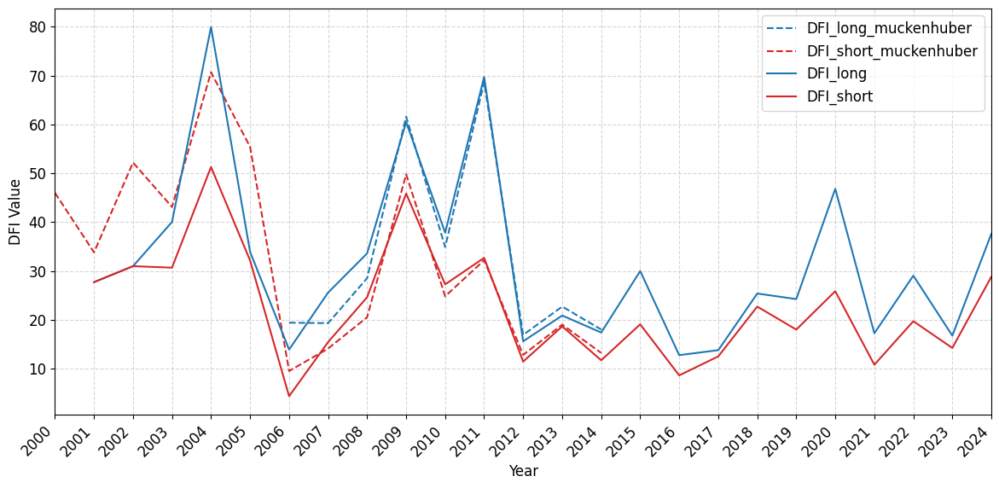

In [66]:
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_long_muckenhuber"],
        label="DFI_long_muckenhuber", linestyle="--", color="tab:blue")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_short_muckenhuber"],
        label="DFI_short_muckenhuber", linestyle="--", color="tab:red")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_long"],
        label="DFI_long", linestyle="-", color="tab:blue")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_short"],
        label="DFI_short", linestyle="-", color="tab:red")

ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("DFI Value", fontsize=12)

ax.tick_params(axis='both', labelsize=12)

# ---- Add yearly ticks ----
ax.xaxis.set_major_locator(mdates.YearLocator(1))      # every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # show only year

plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

ax.legend(fontsize=12)
ax.grid(True, linestyle="--", alpha=0.5)
ax.set_xlim(pd.to_datetime('2000-01-01'),
            pd.to_datetime('2024-01-01'))

plt.tight_layout()
plt.show()

### check delta - short

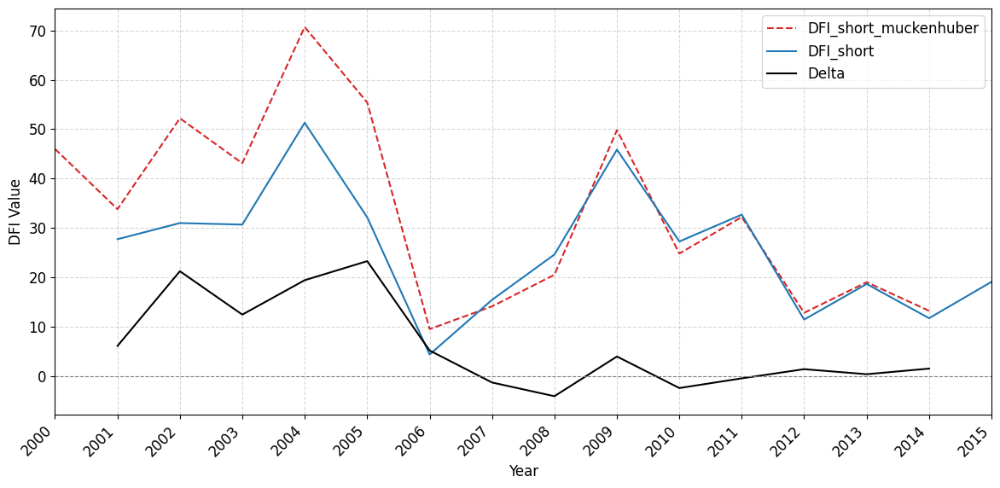

In [67]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_short_muckenhuber"],
        label="DFI_short_muckenhuber", linestyle="--", color="tab:red")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_short"],
        label="DFI_short", linestyle="-", color="tab:blue")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_short_muckenhuber"] - dfi_df_plot["DFI_short"],
        label="Delta", linestyle="-", color="black")
ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)

ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("DFI Value", fontsize=12)

ax.tick_params(axis='both', labelsize=12)

# ---- Add yearly ticks ----
ax.xaxis.set_major_locator(mdates.YearLocator(1))      # every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # show only year

plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

ax.legend(fontsize=12)
ax.grid(True, linestyle="--", alpha=0.5)
ax.set_xlim(pd.to_datetime('2000-01-01'),
            pd.to_datetime('2015-01-01'))

plt.tight_layout()
plt.show()

### check delta - long

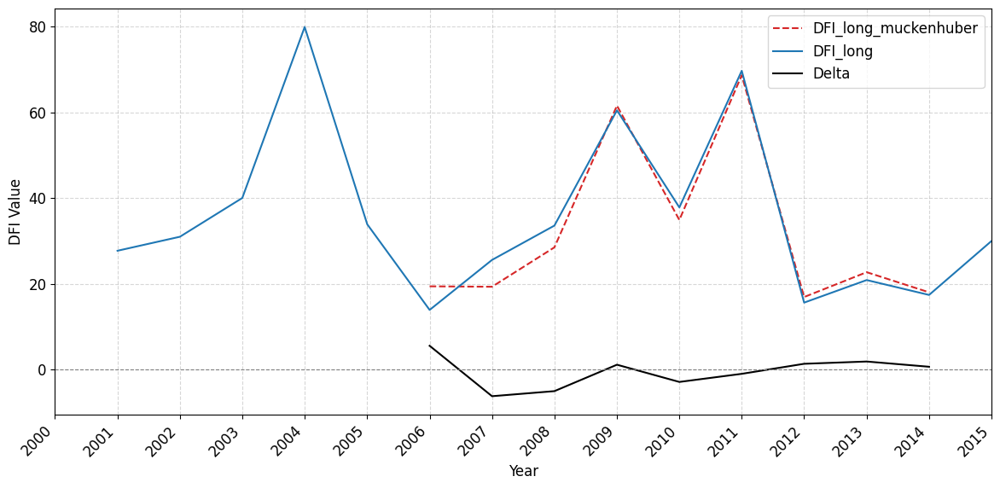

In [68]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_long_muckenhuber"],
        label="DFI_long_muckenhuber", linestyle="--", color="tab:red")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_long"],
        label="DFI_long", linestyle="-", color="tab:blue")
ax.plot(dfi_df_plot.index, dfi_df_plot["DFI_long_muckenhuber"] - dfi_df_plot["DFI_long"],
        label="Delta", linestyle="-", color="black")
ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)

ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("DFI Value", fontsize=12)

ax.tick_params(axis='both', labelsize=12)

# ---- Add yearly ticks ----
ax.xaxis.set_major_locator(mdates.YearLocator(1))      # every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # show only year

plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

ax.legend(fontsize=12)
ax.grid(True, linestyle="--", alpha=0.5)
ax.set_xlim(pd.to_datetime('2000-01-01'),
            pd.to_datetime('2015-01-01'))

plt.tight_layout()
plt.show()

### check delta - both

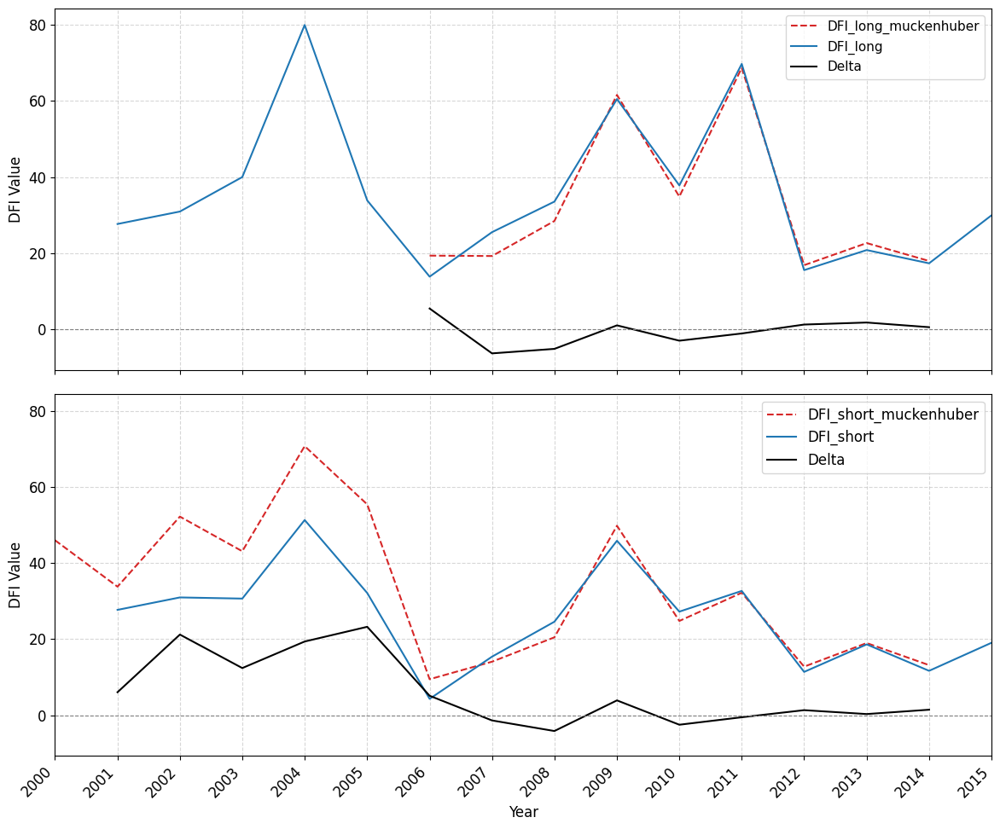

In [69]:


fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True, sharey=True)

# =======================
# Top: LONG
# =======================
ax1.plot(dfi_df_plot.index, dfi_df_plot["DFI_long_muckenhuber"],
         label="DFI_long_muckenhuber", linestyle="--", color="tab:red")
ax1.plot(dfi_df_plot.index, dfi_df_plot["DFI_long"],
         label="DFI_long", linestyle="-", color="tab:blue")
ax1.plot(dfi_df_plot.index,
         dfi_df_plot["DFI_long_muckenhuber"] - dfi_df_plot["DFI_long"],
         label="Delta", linestyle="-", color="black")

ax1.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax1.set_ylabel("DFI Value", fontsize=12)
ax1.tick_params(axis='both', labelsize=12)
ax1.legend(fontsize=11)
ax1.grid(True, linestyle="--", alpha=0.5)

# =======================
# Bottom: SHORT
# =======================
ax2.plot(dfi_df_plot.index, dfi_df_plot["DFI_short_muckenhuber"],
         label="DFI_short_muckenhuber", linestyle="--", color="tab:red")
ax2.plot(dfi_df_plot.index, dfi_df_plot["DFI_short"],
         label="DFI_short", linestyle="-", color="tab:blue")
ax2.plot(dfi_df_plot.index,
         dfi_df_plot["DFI_short_muckenhuber"] - dfi_df_plot["DFI_short"],
         label="Delta", linestyle="-", color="black")

ax2.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax2.set_xlabel("Year", fontsize=12)
ax2.set_ylabel("DFI Value", fontsize=12)
ax2.tick_params(axis='both', labelsize=12)
ax2.legend(fontsize=12)
ax2.grid(True, linestyle="--", alpha=0.5)

# =======================
# Shared X-axis formatting
# =======================
ax2.xaxis.set_major_locator(mdates.YearLocator(1))
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

ax1.set_xlim(pd.to_datetime('2000-01-01'),
             pd.to_datetime('2015-01-01'))

plt.tight_layout()
plt.show()

### more delta

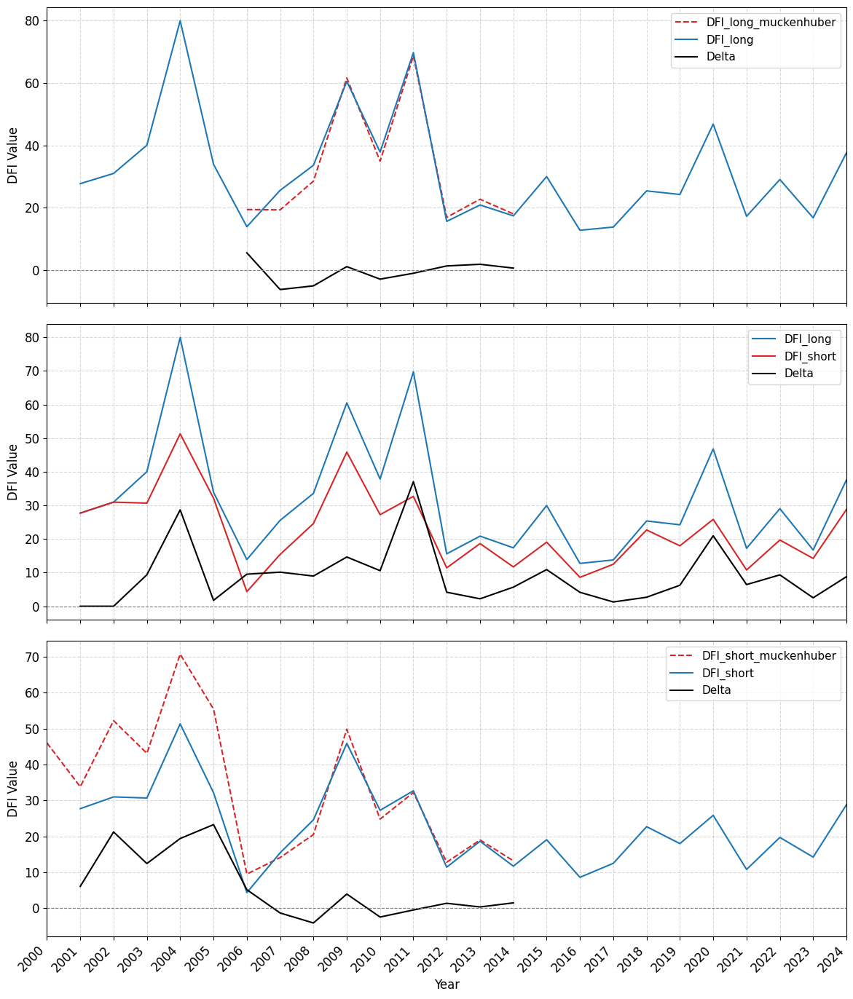

In [70]:
fig, (ax1, ax2, ax3) = plt.subplots(
    3, 1, figsize=(12, 14), sharex=True
)

# =======================
# TOP: LONG + DELTA
# =======================
ax1.plot(dfi_df_plot.index, dfi_df_plot["DFI_long_muckenhuber"],
         label="DFI_long_muckenhuber", linestyle="--", color="tab:red")
ax1.plot(dfi_df_plot.index, dfi_df_plot["DFI_long"],
         label="DFI_long", linestyle="-", color="tab:blue")
ax1.plot(dfi_df_plot.index,
         dfi_df_plot["DFI_long_muckenhuber"] - dfi_df_plot["DFI_long"],
         label="Delta", color="black")

ax1.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax1.set_ylabel("DFI Value", fontsize=12)
ax1.legend(fontsize=11)
ax1.grid(True, linestyle="--", alpha=0.5)
ax1.tick_params(axis='both', labelsize=12)

# =======================
# MIDDLE: LONG & SHORT
# =======================
ax2.plot(dfi_df_plot.index, dfi_df_plot["DFI_long"],
         label="DFI_long", color="tab:blue")
ax2.plot(dfi_df_plot.index, dfi_df_plot["DFI_short"],
         label="DFI_short", color="tab:red")
ax2.plot(dfi_df_plot.index,
         dfi_df_plot["DFI_long"] - dfi_df_plot["DFI_short"],
         label="Delta", color="black")
ax2.axhline(0, color='gray', linestyle='--', linewidth=0.8)

ax2.set_ylabel("DFI Value", fontsize=12)
ax2.legend(fontsize=11)
ax2.grid(True, linestyle="--", alpha=0.5)
ax2.tick_params(axis='both', labelsize=12)

# =======================
# BOTTOM: SHORT + DELTA
# =======================
ax3.plot(dfi_df_plot.index, dfi_df_plot["DFI_short_muckenhuber"],
         label="DFI_short_muckenhuber", linestyle="--", color="tab:red")
ax3.plot(dfi_df_plot.index, dfi_df_plot["DFI_short"],
         label="DFI_short", linestyle="-", color="tab:blue")
ax3.plot(dfi_df_plot.index,
         dfi_df_plot["DFI_short_muckenhuber"] - dfi_df_plot["DFI_short"],
         label="Delta", color="black")

ax3.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax3.set_xlabel("Year", fontsize=12)
ax3.set_ylabel("DFI Value", fontsize=12)
ax3.legend(fontsize=11)
ax3.grid(True, linestyle="--", alpha=0.5)
ax3.tick_params(axis='both', labelsize=12)

# =======================
# Shared X formatting
# =======================
ax3.xaxis.set_major_locator(mdates.YearLocator(1))
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.setp(ax3.get_xticklabels(), rotation=45, ha='right')

ax1.set_xlim(pd.to_datetime('2000-01-01'),
             pd.to_datetime('2024-01-01'))

plt.tight_layout()
plt.show()

### monthly fast ice analysis

### prepare data

In [71]:

# Ensure datetime index
df_mine = df_interp.copy()
# df_mine = df_mine.fillna(0)                              ### DOES IT MAKE SENSE TO FILL WITH 0?
df_mine.index = pd.to_datetime(df_mine.index)

df_muck = df_muckenhuber_interpolated_shortLong.copy()
df_muck.index = pd.to_datetime(df_muck.index)


# Add percent fast ice cover
df_mine['Fast Ice %'] = (df_mine['Fast Ice'] / df_mine['Total Isfjorden Area']) * 100
df_muck['Fast Ice %'] = (df_muck['Fast Ice'] / df_muck['Total Isfjorden Area']) * 100

# Add year/month for grouping
df_mine['year'] = df_mine.index.year
df_mine['month'] = df_mine.index.month
df_muck['year'] = df_muck.index.year
df_muck['month'] = df_muck.index.month

# Helper for monthly means
def monthly_mean(df, year_start, year_end):
    return df[(df['year'] >= year_start) & (df['year'] <= year_end)] \
            .groupby('month')['Fast Ice %'].mean()



# Updated helper to compute both mean and std
def monthly_stats(df, year_start, year_end):
    data = df[(df['year'] >= year_start) & (df['year'] <= year_end)]
    grouped = data.groupby('month')['Fast Ice %']
    return grouped.mean(), grouped.std()

# Compute means and stds for each period
your_mean_00_24, your_std_00_24 = monthly_stats(df_mine, 2000, 2024)
your_mean_00_14, your_std_00_14 = monthly_stats(df_mine, 2000, 2014)
your_mean_00_05, your_std_00_05 = monthly_stats(df_mine, 2000, 2005)
your_mean_06_14, your_std_06_14 = monthly_stats(df_mine, 2006, 2014)
your_mean_15_24, your_std_15_24 = monthly_stats(df_mine, 2015, 2024)

muck_mean_00_14, muck_std_00_14 = monthly_stats(df_muck, 2000, 2014)
muck_mean_00_05, muck_std_00_05 = monthly_stats(df_muck, 2000, 2005)
muck_mean_06_14, muck_std_06_14 = monthly_stats(df_muck, 2006, 2014)




In [72]:
your_mean_00_05

month
1     13.707860
2     17.414856
3     28.753668
4     29.443252
5     21.084722
6     15.051193
7      3.621321
8      4.390792
9           NaN
10     0.000000
11     3.223699
12     5.573224
Name: Fast Ice %, dtype: float64

### its totally fair to have nan in september when there was only nan - so leave it

In [73]:
df_mine["2000-09-01":"2001-09-30"]

norway_ice,Fast Ice,Drift Ice,Water,Total Isfjorden Area,Not Classified,Data Availability,Fast Ice %,year,month
2000-09-01,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2000,9
2000-09-02,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2000,9
2000-09-03,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2000,9
2000-09-04,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2000,9
2000-09-05,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2000,9
...,...,...,...,...,...,...,...,...,...
2001-09-26,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2001,9
2001-09-27,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2001,9
2001-09-28,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2001,9
2001-09-29,NaN,NaN,NaN,2.481701e+09,2.481701e+09,0.0,NaN,2001,9


### plot muckenhuber

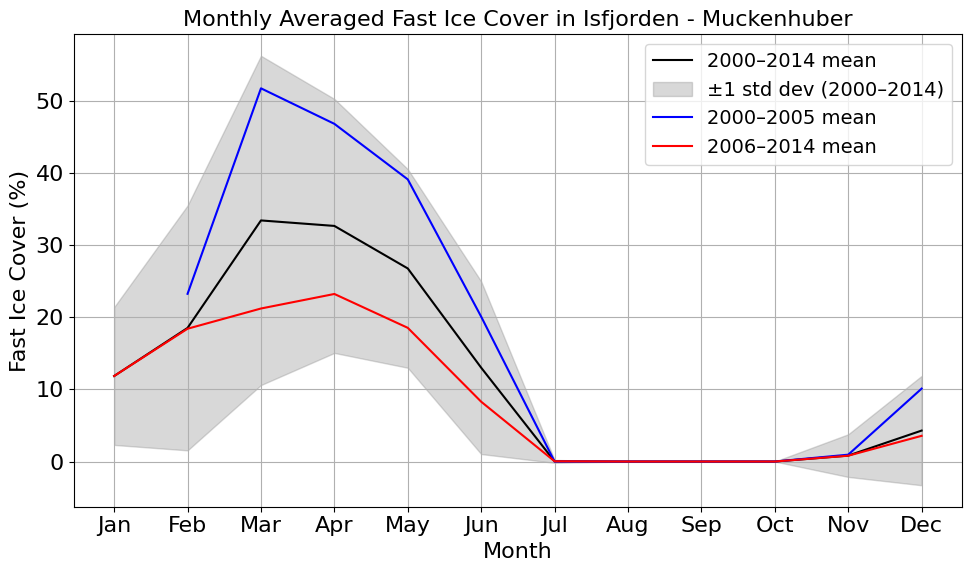

In [74]:
plt.figure(figsize=(10, 6))

# Black line for 2000–2014 mean
plt.plot(muck_mean_00_14.index, muck_mean_00_14, color='black', label='2000–2014 mean')

# Grey shaded area for ±1 std
plt.fill_between(muck_mean_00_14.index,
                 muck_mean_00_14 - muck_std_00_14,
                 muck_mean_00_14 + muck_std_00_14,
                 color='grey', alpha=0.3, label='±1 std dev (2000–2014)')

# Blue line for 2000–2005
plt.plot(muck_mean_00_05.index, muck_mean_00_05, color='blue', label='2000–2005 mean')

# Red line for 2006–2014
plt.plot(muck_mean_06_14.index, muck_mean_06_14, color='red', label='2006–2014 mean')

# Formatting
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month')
plt.ylabel('Fast Ice Cover (%)')
plt.title('Monthly Averaged Fast Ice Cover in Isfjorden - Muckenhuber')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### plot mine

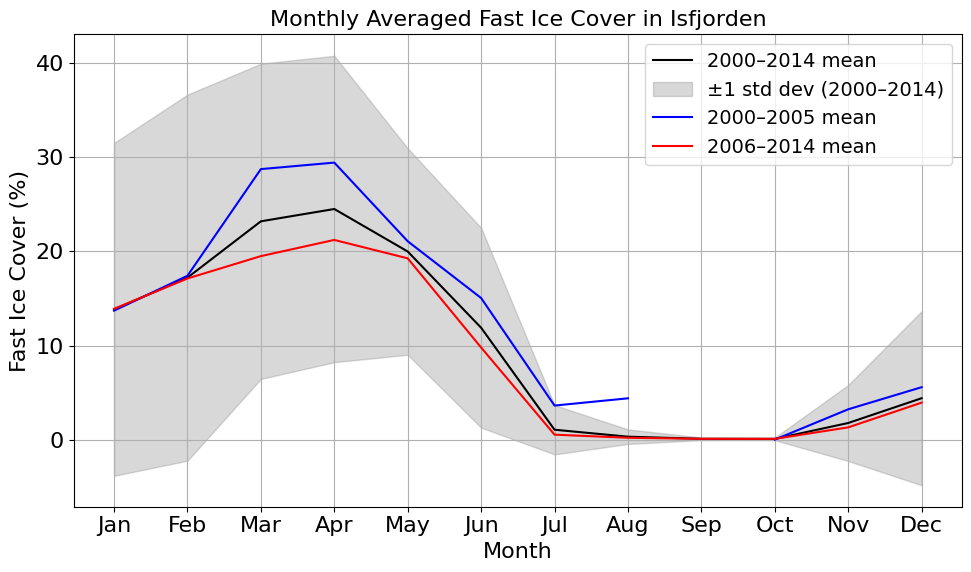

In [75]:
plt.figure(figsize=(10, 6))

# Black line for 2000–2014 mean
plt.plot(your_mean_00_14.index, your_mean_00_14, color='black', label='2000–2014 mean')

# Grey shaded area for ±1 std
plt.fill_between(your_mean_00_14.index,
                 your_mean_00_14 - your_std_00_14,
                 your_mean_00_14 + your_std_00_14,
                 color='grey', alpha=0.3, label='±1 std dev (2000–2014)')

# Blue line for 2000–2005
plt.plot(your_mean_00_05.index, your_mean_00_05, color='blue', label='2000–2005 mean')

# Red line for 2006–2014
plt.plot(your_mean_06_14.index, your_mean_06_14, color='red', label='2006–2014 mean')

# Formatting
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month')
plt.ylabel('Fast Ice Cover (%)')
plt.title('Monthly Averaged Fast Ice Cover in Isfjorden')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### plot both

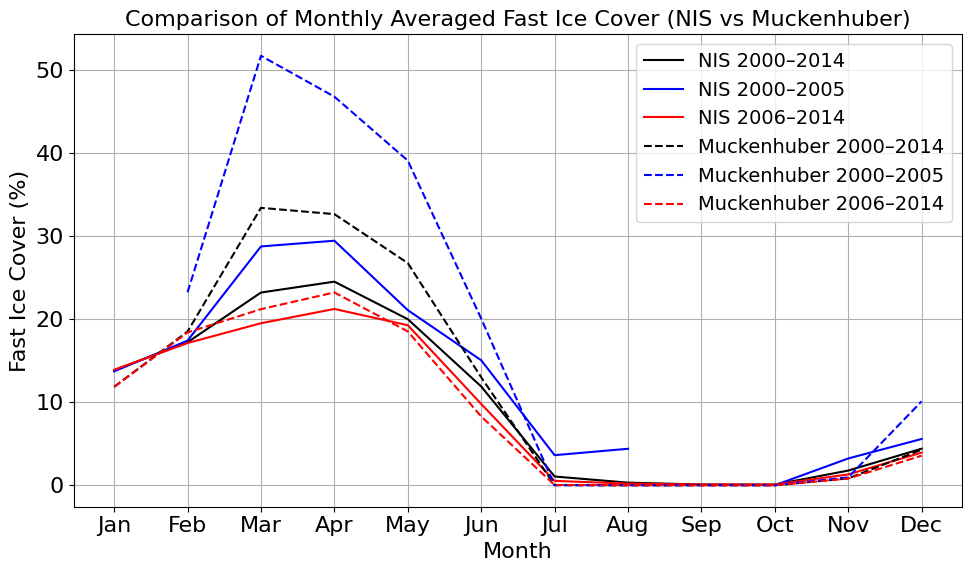

In [76]:


# Plot
plt.figure(figsize=(10, 6))

# Your data (solid)
plt.plot(your_mean_00_14.index, your_mean_00_14, 'k-', label='NIS 2000–2014')
plt.plot(your_mean_00_05.index, your_mean_00_05, 'b-', label='NIS 2000–2005')
plt.plot(your_mean_06_14.index, your_mean_06_14, 'r-', label='NIS 2006–2014')

# Muckenhuber data (dashed)
plt.plot(muck_mean_00_14.index, muck_mean_00_14, 'k--', label='Muckenhuber 2000–2014')
plt.plot(muck_mean_00_05.index, muck_mean_00_05, 'b--', label='Muckenhuber 2000–2005')
plt.plot(muck_mean_06_14.index, muck_mean_06_14, 'r--', label='Muckenhuber 2006–2014')

# Format
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month')
plt.ylabel('Fast Ice Cover (%)')
plt.title('Comparison of Monthly Averaged Fast Ice Cover (NIS vs Muckenhuber)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




### plot mine with equal intervals

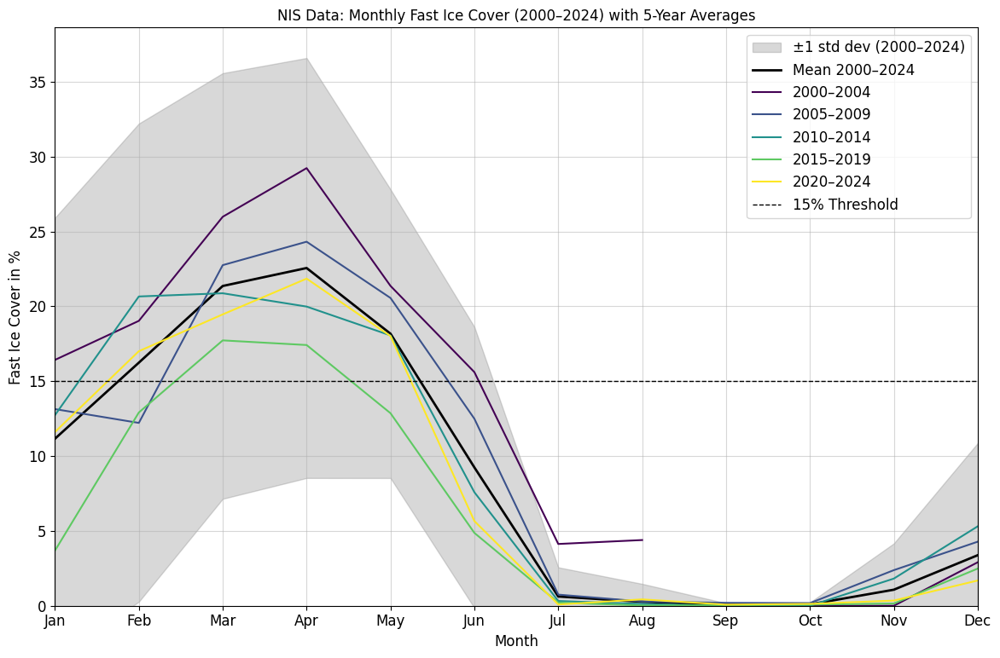

In [77]:


# --- Master Variables for Easy Font Adjustment ---
TITLE_FONT_SIZE = 12
LABEL_FONT_SIZE = 12
TICK_FONT_SIZE = 12
LEGEND_FONT_SIZE = 12

# --- Reuse your df_mine processing from before ---
# Assumed: df_mine has datetime index, year/month columns, and 'Fast Ice %'

# Define full period stats (2000–2024)
full_period = df_mine[(df_mine['year'] >= 2000) & (df_mine['year'] <= 2024)]
monthly_mean_all = full_period.groupby('month')['Fast Ice %'].mean()
monthly_std_all = full_period.groupby('month')['Fast Ice %'].std()

# Define 5-year intervals
intervals = [(y, y+4) for y in range(2000, 2025, 5)]

# Generate color map
cmap = plt.get_cmap("viridis", len(intervals))
colors = [cmap(i) for i in range(len(intervals))]

# Plot
plt.figure(figsize=(12, 8))

# Grey shaded std area
plt.fill_between(monthly_mean_all.index,
                 monthly_mean_all - monthly_std_all,
                 monthly_mean_all + monthly_std_all,
                 color='grey', alpha=0.3, label='±1 std dev (2000–2024)')

# Black mean line for full period
plt.plot(monthly_mean_all.index, monthly_mean_all, color='black', linewidth=2, label='Mean 2000–2024')

# Plot each 5-year interval with gradient color
for (start, end), color in zip(intervals, colors):
    df_period = df_mine[(df_mine['year'] >= start) & (df_mine['year'] <= end)]
    monthly_avg = df_period.groupby('month')['Fast Ice %'].mean()
    plt.plot(monthly_avg.index, monthly_avg, label=f'{start}–{end}', color=color)
    
plt.axhline(15, color='black', linestyle='--', label='15% Threshold', linewidth=1)

# Format X and Y ticks with adjustable font sizes
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], 
           fontsize=TICK_FONT_SIZE)
plt.yticks(fontsize=TICK_FONT_SIZE)

plt.xlim(1, 12)

# --- NEW: Restrict Y-axis to only show positive values (0 and above) ---
plt.ylim(bottom=0)

# Updated Labels and Titles
plt.xlabel('Month', fontsize=LABEL_FONT_SIZE)
plt.ylabel('Fast Ice Cover in %', fontsize=LABEL_FONT_SIZE)
plt.title('NIS Data: Monthly Fast Ice Cover (2000–2024) with 5-Year Averages', fontsize=TITLE_FONT_SIZE)

# Removed the title from the legend
plt.legend(fontsize=LEGEND_FONT_SIZE)

plt.grid(True, alpha=0.5)
plt.tight_layout()
plt.show()

### Hov-Möller Plot my data

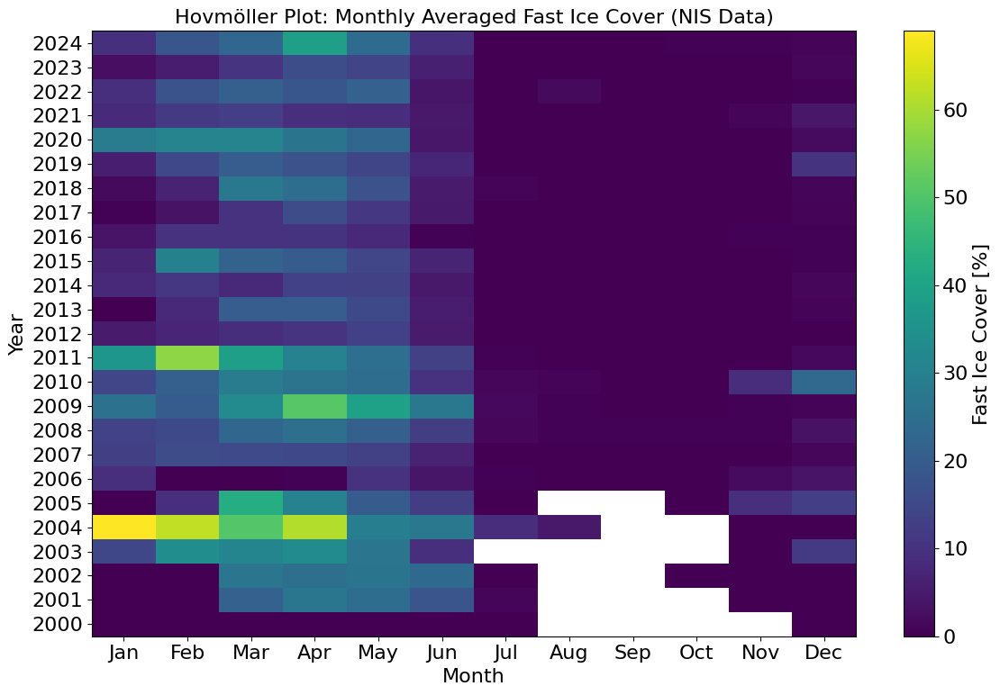

In [78]:
# Ensure year/month/percentage columns exist
df_mine['year'] = df_mine.index.year
df_mine['month'] = df_mine.index.month
df_mine['Fast Ice %'] = (df_mine['Fast Ice'] / df_mine['Total Isfjorden Area']) * 100

# Filter to 2000–2024
df_filtered = df_mine[(df_mine['year'] >= 2000) & (df_mine['year'] <= 2024)]

# Pivot to create Hovmöller matrix: years (rows) × months (columns)
hovmoller_data = df_filtered.groupby(['year', 'month'])['Fast Ice %'].mean().unstack()

# Plot
plt.figure(figsize=(12, 8))
c = plt.pcolormesh(hovmoller_data.columns,
                   hovmoller_data.index,
                   hovmoller_data.values,
                   shading='auto',
                   cmap='viridis',)

# # 🔽 Add this for contour lines 🔽
# # Define contour levels you want (adjust based on your data range)
# contour_levels = [10, 20, 30, 40, 50, 60, 70, 80, 90]

# # Plot contour lines
# contours = plt.contour(hovmoller_data.columns,
#                        hovmoller_data.index,
#                        hovmoller_data.values,
#                        levels=contour_levels,
#                        colors='k', linewidths=0.6)

# # Label contour lines
# plt.clabel(contours, fmt='%d%%', inline=True, fontsize=8)

# Axis labels and title
plt.xlabel('Month')
plt.ylabel('Year')
plt.title('Hovmöller Plot: Monthly Averaged Fast Ice Cover (NIS Data)')

# Set month labels
plt.xticks(ticks=np.arange(1,13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Set yearly ticks explicitly
plt.yticks(ticks=np.arange(2000, 2025), labels=[str(y) for y in range(2000, 2025)])

# Colorbar
plt.colorbar(c, label='Fast Ice Cover [%]')

plt.tight_layout()
plt.show()



In [79]:

# 1. Convert the 2D pivoted DataFrame directly into an xarray DataArray
# We explicitly define the dimensions (year, month) and feed it the index/columns
da_hovmoller = xr.DataArray(
    data=hovmoller_data.values,
    dims=['year', 'month'],
    coords={
        'year': hovmoller_data.index,
        'month': hovmoller_data.columns
    },
    name='fast_ice_percentage' # This becomes the variable name in the NetCDF
)

# 2. Convert the DataArray to a Dataset (allows for better global metadata)
hovmollerNetCDF = da_hovmoller.to_dataset()

# 3. Add Metadata for the specific variable
hovmollerNetCDF['fast_ice_percentage'].attrs['units'] = 'percent'
hovmollerNetCDF['fast_ice_percentage'].attrs['long_name'] = 'Monthly Averaged Fast Ice Cover Percentage'

# Add Metadata for the coordinates (dimensions)
hovmollerNetCDF['year'].attrs['long_name'] = 'Year'
hovmollerNetCDF['month'].attrs['long_name'] = 'Month of the Year (1-12)'

# 4. Add Global Attributes (Provenance & Info)
hovmollerNetCDF.attrs['title'] = 'Isfjorden Fast Ice Hovmöller Matrix (2000-2024)'
hovmollerNetCDF.attrs['summary'] = 'Monthly mean percentage of Fast Ice area relative to the total Isfjorden area, formatted as a Year x Month grid.'

# Creator Information
hovmollerNetCDF.attrs['creator_name'] = 'Martin Lindlmayer'
hovmollerNetCDF.attrs['creator_email'] = 'martin.lindlmayer@outlook.com'

# Data Provenance
hovmollerNetCDF.attrs['source'] = 'Derived from MET Norway sea ice shapefiles.'
hovmollerNetCDF.attrs['history'] = 'Filtered to 2000-2024, calculated as a percentage of total area, and averaged monthly.'


# 5. Export to the new, clean output filename in a specific folder
output_folder = "/home/hugo/uni/master/seaicetimeseries/data/dataExport"
filename = 'seaIceIsfjorden_Hovmoller_Monthly.nc'

# Highly recommended: Create the folder if it doesn't exist yet
# (exist_ok=True prevents an error if the folder is already there)
os.makedirs(output_folder, exist_ok=True)

# Cleanly join the folder path and the filename
output_path = os.path.join(output_folder, filename)

# Export using the full path
seaIceNetCDF.to_netcdf(output_path)

print(f"Successfully exported to:\n{output_path}\nwith full metadata.")

Successfully exported to:
/home/hugo/uni/master/seaicetimeseries/data/dataExport/seaIceIsfjorden_Hovmoller_Monthly.nc
with full metadata.


### include monthly climatology

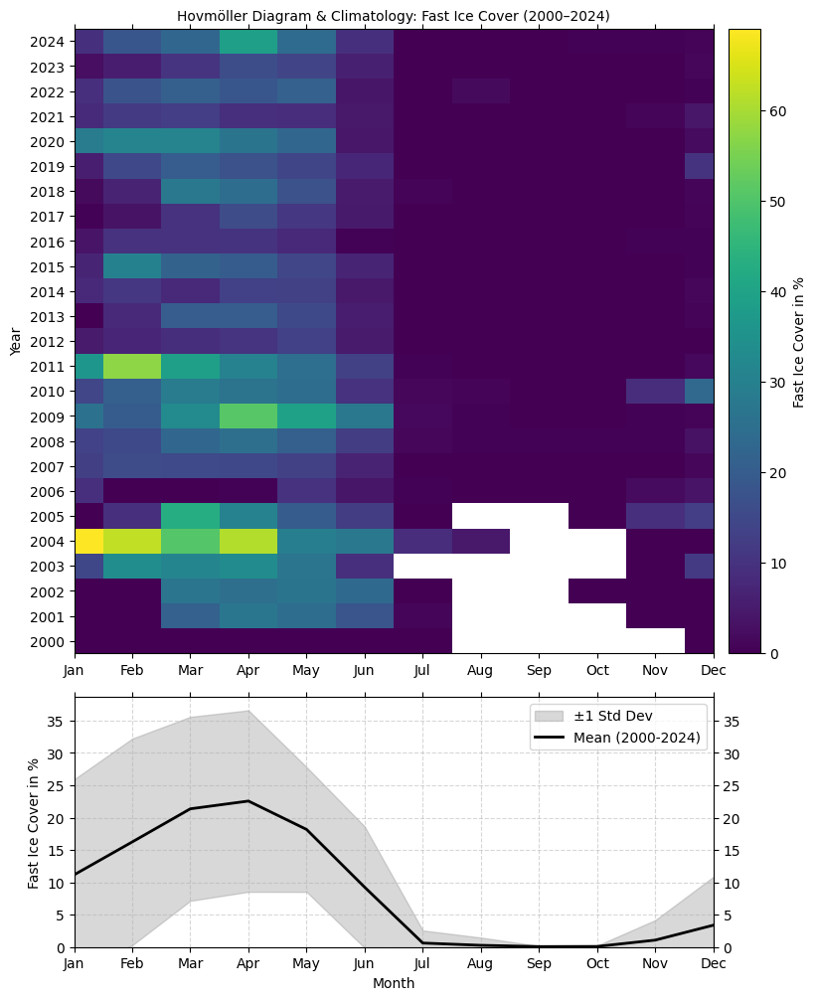

In [80]:
import numpy as np
import matplotlib.pyplot as plt

# --- Master Variables for Easy Font Adjustment ---
TITLE_FONT_SIZE = 10
LABEL_FONT_SIZE = 10
TICK_FONT_SIZE = 10
CBAR_FONT_SIZE = 10

# Figure dimensions and spacing
FIG_WIDTH = 10
FIG_HEIGHT = 12
HSPACE = 0.1  # Increased slightly to give the middle text labels room to breathe!

# Ensure year/month/percentage columns exist
df_mine['year'] = df_mine.index.year
df_mine['month'] = df_mine.index.month
df_mine['Fast Ice %'] = (df_mine['Fast Ice'] / df_mine['Total Isfjorden Area']) * 100

# Filter to 2000–2024
df_filtered = df_mine[(df_mine['year'] >= 2000) & (df_mine['year'] <= 2024)]

# --- Prepare Data ---
# 1. Hovmöller matrix: years (rows) × months (columns)
hovmoller_data = df_filtered.groupby(['year', 'month'])['Fast Ice %'].mean().unstack()

# 2. Climatology: Mean and Std Dev across all years for each month
climatology_mean = df_filtered.groupby('month')['Fast Ice %'].mean()
climatology_std = df_filtered.groupby('month')['Fast Ice %'].std()

# --- Create Figure & Subplots ---
# sharex=False is used here so Matplotlib doesn't automatically hide our labels!
fig, (ax_top, ax_bot) = plt.subplots(
    2, 1, 
    figsize=(FIG_WIDTH, FIG_HEIGHT), 
    gridspec_kw={'height_ratios': [2.5, 1]}, 
    sharex=False 
)

# ==========================================
# TOP PANEL: Hovmöller Plot
# ==========================================
c = ax_top.pcolormesh(
    hovmoller_data.columns,
    hovmoller_data.index,
    hovmoller_data.values,
    shading='auto',
    cmap='viridis'
)

ax_top.set_ylabel('Year', fontsize=LABEL_FONT_SIZE)
ax_top.set_title('Hovmöller Diagram & Climatology: Fast Ice Cover (2000–2024)', fontsize=TITLE_FONT_SIZE)

# Set yearly Y-ticks explicitly
ax_top.set_yticks(ticks=np.arange(2000, 2025))
ax_top.set_yticklabels(labels=[str(y) for y in range(2000, 2025)], fontsize=TICK_FONT_SIZE)

# FIX: Explicitly set monthly X-ticks for the top plot
ax_top.set_xticks(ticks=np.arange(1, 13))
ax_top.set_xticklabels(labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], 
                       fontsize=TICK_FONT_SIZE)
ax_top.set_xlim(1, 12)

# Ensure tick markers show up on top and bottom edges, and text is explicitly turned ON
ax_top.tick_params(axis='x', top=True, bottom=True, labelbottom=True)

# Top Colorbar
cbar = plt.colorbar(c, ax=ax_top, pad=0.02)
cbar.set_label('Fast Ice Cover in %', size=CBAR_FONT_SIZE)
cbar.ax.tick_params(labelsize=TICK_FONT_SIZE)


# ==========================================
# BOTTOM PANEL: Monthly Climatology
# ==========================================
# Grey shaded std area
ax_bot.fill_between(
    climatology_mean.index,
    climatology_mean - climatology_std,
    climatology_mean + climatology_std,
    color='grey', alpha=0.3, label='±1 Std Dev'
)

# Black mean line
ax_bot.plot(climatology_mean.index, climatology_mean, color='black', linewidth=2, label='Mean (2000-2024)')

ax_bot.set_xlabel('Month', fontsize=LABEL_FONT_SIZE)
ax_bot.set_ylabel('Fast Ice Cover in %', fontsize=LABEL_FONT_SIZE)

# Set monthly X-ticks for the bottom plot
ax_bot.set_xticks(ticks=np.arange(1, 13))
ax_bot.set_xticklabels(labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], 
                       fontsize=TICK_FONT_SIZE)
ax_bot.set_xlim(1, 12)
ax_bot.set_ylim(bottom=0)

# Format Y ticks to appear on BOTH left and right sides
ax_bot.tick_params(
    axis='y', 
    left=True, right=True,          
    labelleft=True, labelright=True, 
    labelsize=TICK_FONT_SIZE
)

# Ensure x-tick markers are drawn on both top and bottom edges
ax_bot.tick_params(axis='x', top=True, bottom=True)

ax_bot.grid(True, linestyle='--', alpha=0.5)
ax_bot.legend(fontsize=TICK_FONT_SIZE, loc='upper right')

# Invisible dummy colorbar trick to perfectly align the bottom plot's width with the top plot!
cbar_dummy = plt.colorbar(c, ax=ax_bot, pad=0.02)
cbar_dummy.ax.set_visible(False)

# Final Layout Adjustments
plt.subplots_adjust(hspace=HSPACE)
plt.show()

### Temporal distribution with a noice reduction level and show star end end date of sea ice season based on threshold

In [81]:


def plot_split_sea_ice_violin_noice_reduction(

    df,

    top_range=range(2000, 2013),

    bottom_range=range(2013, 2026),

    concentration_threshold=15,  # --- NEW PARAMETER ---

    noice_reduction=2.5  # --- NEW PARAMETER ---

):

    """

    Plots split violin plots for sea ice data, comparing two date ranges.

   

    Parameters:

    - df: DataFrame containing the sea ice data.

    - top_range: Years for the top subplot (e.g., range(2000, 2013)).

    - bottom_range: Years for the bottom subplot (e.g., range(2013, 2026)).

    - concentration_threshold: The percentage threshold to define the

                               'start' and 'end' of the ice season (default: 5).

    """

   

    # --- UPDATED prepare_data to accept the threshold ---

    def prepare_data(df, seasons, threshold,noice_reduction, skip_last=False):

        """skip_last=True removes the final season from actual plotting (for incomplete data)."""

        violin_data, stats_data, first_last_data = [], [], []

        plot_seasons = list(seasons[:-1] if skip_last else seasons)



        for i, season in enumerate(seasons):

            df_season = df[df['season'] == season].copy()

            if df_season.empty or (skip_last and season == seasons[-1]):

                continue  # skip final season (e.g. 2025)



            df_season['Fast Ice %'] = df_season['Fast Ice'] / df_season['Total Isfjorden Area'] * 100

            df_season['Drift Ice %'] = df_season['Drift Ice'] / df_season['Total Isfjorden Area'] * 100

            df_season['season_day'] = (df_season.index - pd.Timestamp(f"{season - 1}-10-01")).days



            df_melted = df_season[['season_day', 'Fast Ice %', 'Drift Ice %']].melt(

                id_vars='season_day', var_name='Ice Type', value_name='Concentration (%)'

            )

            df_melted = df_melted[df_melted['Concentration (%)'] > noice_reduction]  # Filter out very low concentrations to reduce noise

            df_melted['pos'] = i

            df_melted['Season'] = str(season)

            violin_data.append(df_melted)



            if not df_melted.empty:

                stats = df_melted.groupby('Ice Type')['season_day'].mean().reset_index()

                stats['pos'] = i

                stats['Season'] = str(season)

                stats_data.append(stats)



                for ice_type, group in df_melted.groupby('Ice Type'):

                    # --- UPDATED: Use dynamic threshold variable ---

                    over_threshold = group[group['Concentration (%)'] > threshold]

                    if not over_threshold.empty:

                        first_last_data.append({

                            'Ice Type': ice_type,

                            'start_day': over_threshold['season_day'].min(),

                            'end_day': over_threshold['season_day'].max(),

                            'pos': i,

                            'Season': str(season)

                        })



        return (

            pd.concat(violin_data, ignore_index=True) if violin_data else pd.DataFrame(),

            pd.concat(stats_data, ignore_index=True) if stats_data else pd.DataFrame(),

            pd.DataFrame(first_last_data)

        )



    # --- Setup ---

    df = df.copy()

    df.index = pd.to_datetime(df.index)

    df['season'] = df.index.map(lambda d: d.year + 1 if d.month >= 10 else d.year)



    # --- FIX 1: Set sharex=False ---

    fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=False)

    plt.subplots_adjust(hspace=0.2) # Increased hspace slightly so labels don't overlap title



    n_positions = len(top_range)

    x_positions = list(range(n_positions))



    # --- Helper for Month Axis ---

    def set_month_labels(ax, seasons):

        ref_start = pd.Timestamp(f"{min(seasons) - 1}-10-01")

        month_ticks = [ref_start + pd.DateOffset(months=i) for i in range(12)]

        month_labels = [d.strftime("%b") for d in month_ticks]

        day_positions = [(d - ref_start).days for d in month_ticks]

        ax.set_yticks(day_positions)

        ax.set_yticklabels(month_labels)



    # --- Top subplot (2000–2012) ---

    # --- UPDATED: Pass threshold to prepare_data ---

    df_violin, df_stats, df_first_last = prepare_data(df, top_range, concentration_threshold, noice_reduction, skip_last=False)

    ax = axes[0]



    sns.violinplot(

        data=df_violin,

        x='pos',

        y='season_day',

        hue='Ice Type',

        hue_order=['Drift Ice %', 'Fast Ice %'],

        split=True,

        inner=None,

        ax=ax,

        palette={'Fast Ice %': 'crimson', 'Drift Ice %': 'orange'},

    )



    for _, row in df_stats.iterrows():

        color = 'orange' if 'Drift' in row['Ice Type'] else 'crimson'

        ax.plot(row['pos'], row['season_day'], 'o', color=color, markersize=8, mec='k', mew=1)



    for _, row in df_first_last.iterrows():

        color = 'orange' if 'Drift' in row['Ice Type'] else 'crimson'

        ax.plot(row['pos'], row['start_day'], 'v', color=color, markersize=10, mec='k', mew=1)

        ax.plot(row['pos'], row['end_day'], '^', color=color, markersize=10, mec='k', mew=1)



    ax.set_xticks(x_positions)

    ax.set_xticklabels([str(y) for y in top_range]) # This will now work

    set_month_labels(ax, top_range)

    ax.set_ylabel("Date in Season")

    ax.set_title(f"Sea Ice Seasons {min(top_range)}–{max(top_range)}")

    ax.grid(True, alpha=0.3)

    ax.set_xlabel("") # Remove x-label from top plot



    # --- Bottom subplot (2013–2025, skip 2025 violins) ---

    # --- UPDATED: Pass threshold to prepare_data ---

    df_violin, df_stats, df_first_last = prepare_data(df, bottom_range, concentration_threshold, noice_reduction, skip_last=True)

    ax = axes[1]



    sns.violinplot(

        data=df_violin,

        x='pos',

        y='season_day',

        hue='Ice Type',

        hue_order=['Drift Ice %', 'Fast Ice %'],

        split=True,

        inner=None,

        ax=ax,

        palette={'Fast Ice %': 'crimson', 'Drift Ice %': 'orange'},

    )



    for _, row in df_stats.iterrows():

        color = 'orange' if 'Drift' in row['Ice Type'] else 'crimson'

        ax.plot(row['pos'], row['season_day'], 'o', color=color, markersize=8, mec='k', mew=1)



    for _, row in df_first_last.iterrows():

        color = 'orange' if 'Drift' in row['Ice Type'] else 'crimson'

        ax.plot(row['pos'], row['start_day'], 'v', color=color, markersize=10, mec='k', mew=1)

        ax.plot(row['pos'], row['end_day'], '^', color=color, markersize=10, mec='k', mew=1)



    # keep placeholder tick for 2025

    ax.set_xticks(x_positions)

    ax.set_xticklabels([str(y) for y in bottom_range]) # This will also work

    set_month_labels(ax, bottom_range)

    ax.set_ylabel("Date in Season")

    ax.set_xlabel("Sea Ice Season")

    ax.set_title(f"Sea Ice Seasons {min(bottom_range)}–{max(bottom_range)}")

    ax.grid(True, alpha=0.3)



    # --- FIX 2: Manually align the x-axes limits ---

    plot_limit = (-0.5, n_positions - 0.5)

    axes[0].set_xlim(plot_limit)

    axes[1].set_xlim(plot_limit)



    # --- Legend ---

    # --- UPDATED: Use f-strings for dynamic labels ---

    legend_elements = [

        Line2D([0], [0], marker='v', color='w', label=f'Start >{concentration_threshold}%', markerfacecolor='gray', markersize=10),

        Line2D([0], [0], marker='^', color='w', label=f'Last Day >{concentration_threshold}%', markerfacecolor='gray', markersize=10),

        Line2D([0], [0], marker='o', color='w', label='Mean', markerfacecolor='gray', markersize=8),

        Line2D([0], [0], color='crimson', lw=10, label='Fast Ice'),

        Line2D([0], [0], color='orange', lw=10, label='Drift Ice'),

    ]

    fig.legend(handles=legend_elements, loc='lower center', ncol=5, title="Legend", frameon=False)



    plt.tight_layout(rect=[0, 0.05, 1, 1])

    plt.show()





# --- EXAMPLE FUNCTION CALL ---

# (Assuming 'df_interp' is your DataFrame)



# 1. Call with the original default (5%)

# plot_split_sea_ice_violin(df_interp,

#                           top_range=range(2000, 2013),

#                           bottom_range=range(2013, 2026))



# 2. Call with a new threshold (e.g., 10%)

# plot_split_sea_ice_violin(df_interp,

#                           top_range=range(2000, 2013),

#                           bottom_range=range(2013, 2026),

#                           concentration_threshold=10)

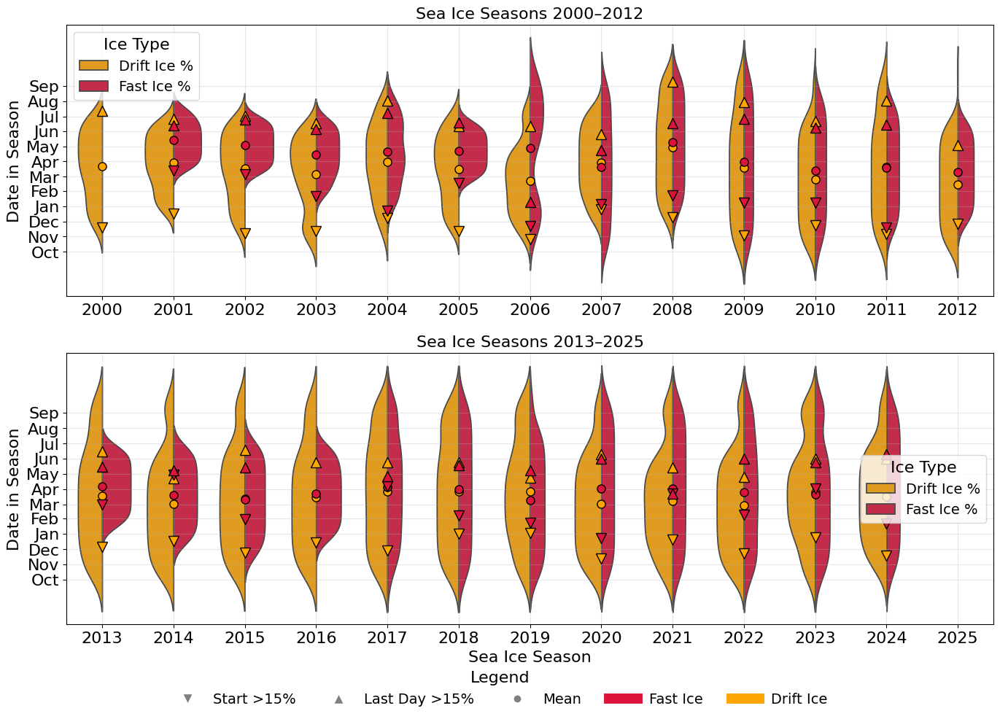

In [82]:
plot_split_sea_ice_violin_noice_reduction(df_interp,
                        top_range=range(2000, 2013),
                        bottom_range=range(2013, 2026),
                        concentration_threshold=15,
                        noice_reduction=0)

### make concentration weighted violines

In [83]:
def plot_split_sea_ice_violin_noice_reduction_weighted_mean(
    df,
    top_range=range(2000, 2013),
    bottom_range=range(2013, 2026),
    concentration_threshold=15,
    noice_reduction=2.5,
    scale_factor=1,
    # --- Dimensions and Spacing ---
    fig_width=14,
    fig_height=14,
    hspace=0.25,
    # --- Font Size Parameters ---
    title_fontsize=14,
    label_fontsize=14,
    tick_fontsize=14,
    legend_fontsize=14,
    legend_title_fontsize=14
):
    """
    Plots split violin plots with synchronized Y-axes for direct comparison.
    All fonts and dimensions are adjustable via parameters.
    """

    from matplotlib.lines import Line2D
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd

    def prepare_weighted_data(df, seasons, threshold, noice_reduction, scale_factor, skip_last=False):
        violin_data, stats_data, first_last_data = [], [], []

        for i, season in enumerate(seasons):
            df_season = df[df['season'] == season].copy()
            if df_season.empty or (skip_last and season == seasons[-1]):
                continue

            df_season['Fast Ice %'] = df_season['Fast Ice'] / df_season['Total Isfjorden Area'] * 100
            df_season['Drift Ice %'] = df_season['Drift Ice'] / df_season['Total Isfjorden Area'] * 100
            df_season['season_day'] = (df_season.index - pd.Timestamp(f"{season - 1}-10-01")).days

            df_melted = df_season[['season_day', 'Fast Ice %', 'Drift Ice %']].melt(
                id_vars='season_day', var_name='Ice Type', value_name='Concentration (%)'
            )

            df_melted = df_melted[df_melted['Concentration (%)'] > noice_reduction]
            if df_melted.empty:
                continue

            # Weighted replication (Density Hack)
            df_melted['weight_n'] = ((df_melted['Concentration (%)'] / 100) * (100 * scale_factor)).round().astype(int)
            df_melted.loc[df_melted['weight_n'] < 1, 'weight_n'] = 1
            df_replicated = df_melted.loc[df_melted.index.repeat(df_melted['weight_n'])].copy()
            df_replicated.drop(columns='weight_n', inplace=True)

            df_replicated['pos'] = i
            df_replicated['Season'] = str(season)
            violin_data.append(df_replicated)

            # Center of Mass mean
            stats = df_replicated.groupby('Ice Type')['season_day'].mean().reset_index()
            stats['pos'] = i
            stats['Season'] = str(season)
            stats_data.append(stats)

            # Envelope markers
            for ice_type, group in df_melted.groupby('Ice Type'):
                over_threshold = group[group['Concentration (%)'] > threshold]
                if not over_threshold.empty:
                    first_last_data.append({
                        'Ice Type': ice_type,
                        'start_day': over_threshold['season_day'].min(),
                        'end_day': over_threshold['season_day'].max(),
                        'pos': i,
                        'Season': str(season)
                    })

        return (
            pd.concat(violin_data, ignore_index=True) if violin_data else pd.DataFrame(),
            pd.concat(stats_data, ignore_index=True) if stats_data else pd.DataFrame(),
            pd.DataFrame(first_last_data)
        )

    # --- Setup ---
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df['season'] = df.index.map(lambda d: d.year + 1 if d.month >= 10 else d.year)

    fig, axes = plt.subplots(2, 1, figsize=(fig_width, fig_height), sharex=False)
    plt.subplots_adjust(hspace=hspace) 
    
    n_positions = len(top_range)
    x_positions = list(range(n_positions))

    def set_month_labels(ax, seasons, tick_size):
        ref_start = pd.Timestamp(f"{min(seasons) - 1}-10-01")
        month_ticks = [ref_start + pd.DateOffset(months=i) for i in range(12)]
        month_labels = [d.strftime("%b") for d in month_ticks]
        day_positions = [(d - ref_start).days for d in month_ticks]
        ax.set_yticks(day_positions)
        ax.set_yticklabels(month_labels, fontsize=tick_size)

    # --- Plotting ---
    ranges = [top_range, bottom_range]
    titles = [f"Sea Ice Seasons {min(top_range)}–{max(top_range)}", 
              f"Sea Ice Seasons {min(bottom_range)}–{max(bottom_range)}"]

    for idx, ax in enumerate(axes):
        is_bottom = (idx == 1)
        df_violin, df_stats, df_first_last = prepare_weighted_data(
            df, ranges[idx], concentration_threshold, noice_reduction, scale_factor, skip_last=is_bottom
        )

        if not df_violin.empty:
            sns.violinplot(
                data=df_violin, x='pos', y='season_day', hue='Ice Type',
                hue_order=['Drift Ice %', 'Fast Ice %'], split=True, inner=None,
                ax=ax, palette={'Fast Ice %': 'crimson', 'Drift Ice %': 'orange'}, cut=0
            )
            if ax.legend_ is not None: ax.legend_.remove()

        for _, row in df_stats.iterrows():
            color = 'orange' if 'Drift' in row['Ice Type'] else 'crimson'
            ax.plot(row['pos'], row['season_day'], 'o', color=color, markersize=8, mec='k', mew=1)

        for _, row in df_first_last.iterrows():
            color = 'orange' if 'Drift' in row['Ice Type'] else 'crimson'
            ax.plot(row['pos'], row['start_day'], 'v', color=color, markersize=10, mec='k', mew=1)
            ax.plot(row['pos'], row['end_day'], '^', color=color, markersize=10, mec='k', mew=1)

        ax.set_xticks(x_positions)
        ax.set_xticklabels([str(y) for y in ranges[idx]], fontsize=tick_fontsize)
        set_month_labels(ax, ranges[idx], tick_fontsize)
        ax.set_title(titles[idx], fontsize=title_fontsize)
        ax.set_ylabel("Date in Season", fontsize=label_fontsize)
        ax.set_xlabel("Year" if is_bottom else "", fontsize=label_fontsize)
        ax.grid(True, alpha=0.3)
        ax.set_xlim(-0.5, n_positions - 0.5)

    # --- Synchronize Y-Axis Limits ---
    ylim0 = axes[0].get_ylim()
    ylim1 = axes[1].get_ylim()
    # Find global min/max across both plots
    global_ylim = (min(ylim0[0], ylim1[0]), max(ylim0[1], ylim1[1]))
    axes[0].set_ylim(global_ylim)
    axes[1].set_ylim(global_ylim)

    # --- Legend ---
    legend_elements = [
        Line2D([0], [0], marker='v', color='w', label=f'First Day >{concentration_threshold}%', markerfacecolor='gray', markersize=10),
        Line2D([0], [0], marker='^', color='w', label=f'Last Day >{concentration_threshold}%', markerfacecolor='gray', markersize=10),
        Line2D([0], [0], marker='o', color='w', label='Weighted Mean', markerfacecolor='gray', markersize=8),
        Line2D([0], [0], color='crimson', lw=10, label='Fast Ice'),
        Line2D([0], [0], color='orange', lw=10, label='Drift Ice'),
    ]

    leg = fig.legend(handles=legend_elements, loc='lower center', ncol=5, title="Legend", 
                     frameon=False, fontsize=legend_fontsize)
    leg.get_title().set_fontsize(legend_title_fontsize)

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()

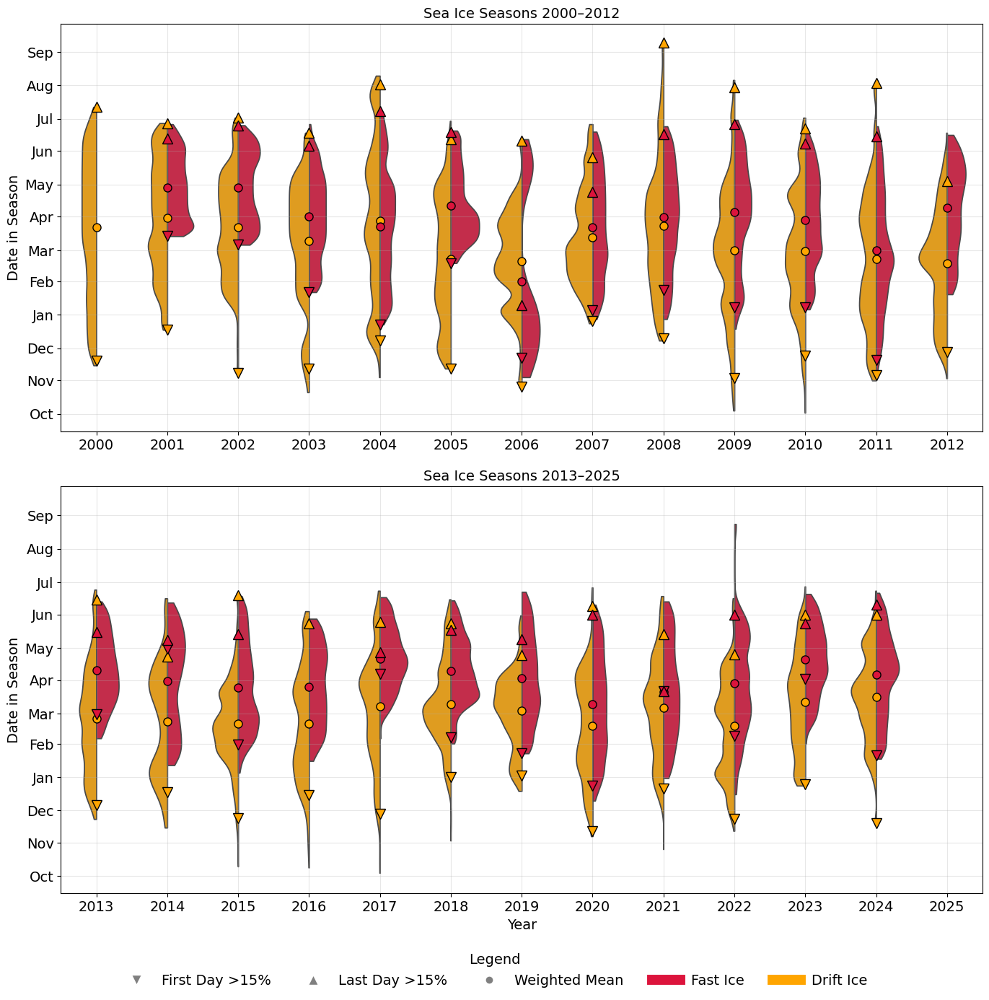

In [84]:
plot_split_sea_ice_violin_noice_reduction_weighted_mean(
    df_interp,
    top_range=range(2000, 2013),
    bottom_range=range(2013, 2026),
    concentration_threshold=15,
    noice_reduction=5,
    scale_factor=1,
    fig_width=14,
    fig_height=14,
    hspace=0.25,
    title_fontsize=14,
    label_fontsize=14,
    tick_fontsize=14,
    legend_fontsize=14,
    legend_title_fontsize=14
)

### calc the duration and total ice based on 15% threshold

In [85]:
def build_combined_ice_season_stats(df, threshold=15):
    """
    Compute clean Combined-Ice season statistics using a 15% threshold.
    
    Returns one row per season with:
        - Duration (days) based on threshold
        - Start day, End day
        - Mean & Max % concentration
        - Total ice for entire season (km²·days)
        - Total ice above threshold only (km²·days)
    """

    df = df.copy()
    df.index = pd.to_datetime(df.index)

    # --- Define ice seasons: Oct 1 (prev year) → Sep 30 (year) ---
    df["Season"] = df.index.map(lambda d: d.year + 1 if d.month >= 10 else d.year)

    # --- Build Combined Ice ---
    if "Combined Ice" not in df.columns:
        df["Combined Ice"] = df["Fast Ice"] + df["Drift Ice"]

    # --- Compute percentage cover ---
    df["Combined Ice %"] = df["Combined Ice"] / df["Total Isfjorden Area"] * 100

    records = []

    # --- Loop seasons ---
    for season, df_season in df.groupby("Season"):
        df_season = df_season.copy()

        start_of_season = pd.Timestamp(f"{season-1}-10-01")
        df_season["season_day"] = (df_season.index - start_of_season).days

        # Days above threshold
        over = df_season[df_season["Combined Ice %"] > threshold]

        # Total ice (no threshold)
        total_ice_full = df_season["Combined Ice"].sum()
        mean_conc_full = df_season["Combined Ice %"].mean()
        max_conc_full = df_season["Combined Ice %"].max()

        if over.empty:
            records.append({
                "Season": season,
                "Start Day": np.nan,
                "End Day": np.nan,
                "Duration (days)": np.nan,
                "Mean Concentration (%)": mean_conc_full,
                "Mean Concentration >15 (%)": np.nan,
                "Max Concentration (%)": max_conc_full,
                "Max Concentration >15 (%)": np.nan,
                "Total Ice Full (km²·days)": total_ice_full,
                "Total Ice >15% (km²·days)": np.nan,
                "Total Ice <15% (km²·days)": np.nan,
            })
            continue

        # Extract metrics
        start_day = over["season_day"].min()
        end_day   = over["season_day"].max()
        duration  = end_day - start_day

        mean_conc = over["Combined Ice %"].mean()
        max_conc  = over["Combined Ice %"].max()

        total_ice_over15 = over["Combined Ice"].sum()

        records.append({
            "Season": season,
            "Start Day": start_day,
            "End Day": end_day,
            "Duration (days)": duration,
            "Mean Concentration (%)": mean_conc_full,
            "Mean Concentration >15 (%)": mean_conc,
            "Max Concentration (%)": max_conc_full,
            "Max Concentration >15 (%)": max_conc,
            "Total Ice Full (km²·days)": total_ice_full,        
            "Total Ice >15% (km²·days)": total_ice_over15,
            "Total Ice <15% (km²·days)": total_ice_full - total_ice_over15,
        })

    return pd.DataFrame(records).sort_values("Season").reset_index(drop=True)


In [86]:
df_combined_ice_stats = build_combined_ice_season_stats(df_interp, threshold=15)
df_combined_ice_stats_2000_2024 = df_combined_ice_stats[
    (df_combined_ice_stats["Season"] >= 2000) &
    (df_combined_ice_stats["Season"] <= 2024)
]

print(df_combined_ice_stats_2000_2024.to_string(index=False))


 Season  Start Day  End Day  Duration (days)  Mean Concentration (%)  Mean Concentration >15 (%)  Max Concentration (%)  Max Concentration >15 (%)  Total Ice Full (km²·days)  Total Ice >15% (km²·days)  Total Ice <15% (km²·days)
   2000         49      285              236               92.903696                   94.665905              99.450980                  99.450980               4.680352e+11               4.675156e+11               5.195489e+08
   2001         78      270              192               80.899956                   89.267850              99.376712                  99.376712               3.814621e+11               3.810421e+11               4.199366e+08
   2002         38      275              237               68.052405                   83.181062              99.376712                  99.376712               3.394603e+11               3.323532e+11               7.107159e+09
   2003         42      261              219               64.181894                   7

### plot

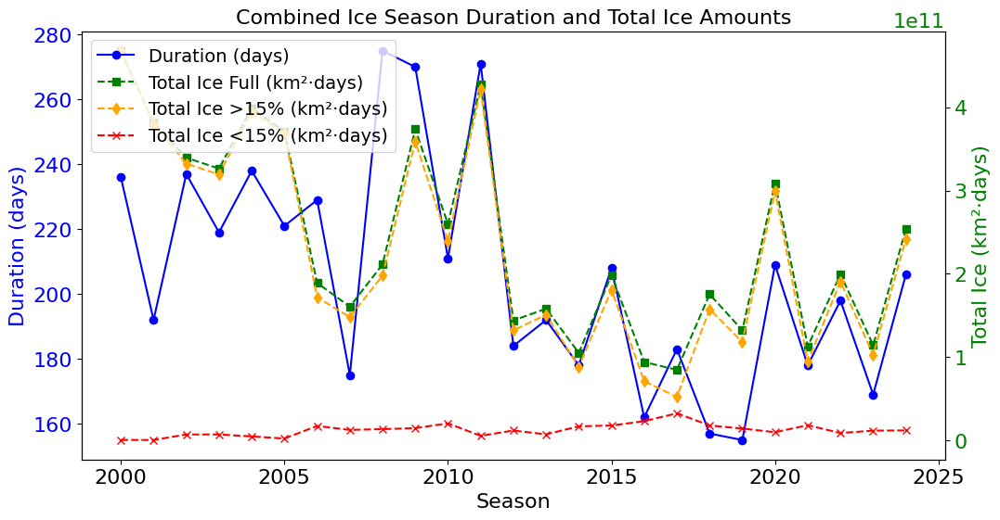

In [87]:
# Plot duration and total ice full, total ice >15%  and <15% over seasons with two different y axes
plt.figure(figsize=(12, 6))
ax1 = plt.gca()
ax2 = ax1.twinx()
seasons = df_combined_ice_stats_2000_2024["Season"]
duration = df_combined_ice_stats_2000_2024["Duration (days)"]
total_ice_full = df_combined_ice_stats_2000_2024["Total Ice Full (km²·days)"]
total_ice_over15 = df_combined_ice_stats_2000_2024["Total Ice >15% (km²·days)"]
total_ice_under15 = df_combined_ice_stats_2000_2024["Total Ice <15% (km²·days)"]
ax1.plot(seasons, duration, 'o-', color='blue', label='Duration (days)')
ax2.plot(seasons, total_ice_full, 's--', color='green', label='Total Ice Full (km²·days)')
ax2.plot(seasons, total_ice_over15, 'd--', color='orange', label='Total Ice >15% (km²·days)')
ax2.plot(seasons, total_ice_under15, 'x--', color='red', label='Total Ice <15% (km²·days)')
ax1.set_xlabel('Season')
ax1.set_ylabel('Duration (days)', color='blue')
ax2.set_ylabel('Total Ice (km²·days)', color='green')
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='green')
plt.title('Combined Ice Season Duration and Total Ice Amounts')
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')
plt.show()




## now include air temperatures (FDD and CFD)

### load in data


In [88]:
# Define the file path
folder_path = Path("/home/hugo/uni/master/seaicetimeseries/data/temp")
file_path = folder_path / "svalbard_lufthavn.csv"


df_air_temp = pd.read_csv(
    file_path,
    sep=";",
    usecols=[
        "Time(norwegian mean time)",
        "Mean air temperature (24 h)",
        "Maximum air temperature (24 h)",
        "Minimum air temperature (24 h)",
    ],
)
df_air_temp.columns = ["Date", "T_mean", "T_max", "T_min"]
df_air_temp["Date"] = pd.to_datetime(df_air_temp["Date"], format="%d.%m.%Y")

# 🔧 convert temperature columns to numeric (force errors to NaN)
for col in ["T_mean", "T_max", "T_min"]:
    df_air_temp[col] = pd.to_numeric(df_air_temp[col], errors="coerce")

df_air_temp = df_air_temp.set_index("Date").sort_index()


### calc it for different periods (but we will use later the same period as for DFI_long)

In [89]:

def calc_FDD_CFD(df_air_temp, T_col="T_mean", T_threshold=-1.8,
                 year_start=2000, year_end=2024):
    """
    Calculate Freezing Degree Days (FDD) and Count of Freezing Days (CFD)
    for each year based on three periods:
      1. Long DFI: Nov 1 (previous year) – Jun 30 (current year)
      2. Short DFI: Mar 1 – Jun 30 (current year)
      3. Duration period: Oct 1 (previous year) – Sep 30 (current year)

    Parameters
    ----------
    df_air_temp : DataFrame
        Must have datetime index and columns 'T_mean', 'T_max', 'T_min'
    T_col : str
        Column to use for temperature (default = 'T_mean')
    T_threshold : float
        Freezing threshold in °C (default = -1.8)
    year_start : int
        First season year (default = 2000)
    year_end : int
        Last season year (default = 2024)
    """

    df = df_air_temp.copy()
    df.index = pd.to_datetime(df.index)
    df = df.sort_index()

    results = []

    for year in range(year_start, year_end + 1):
        # --- Period definitions ---
        long_start = pd.Timestamp(f"{year - 1}-11-01")
        long_end = pd.Timestamp(f"{year}-06-30")

        short_start = pd.Timestamp(f"{year}-03-01")
        short_end = long_end

        dur_start = pd.Timestamp(f"{year - 1}-10-01")
        dur_end = pd.Timestamp(f"{year}-09-30")

        # --- Subsets ---
        long_season = df.loc[long_start:long_end, T_col]
        short_season = df.loc[short_start:short_end, T_col]
        dur_season = df.loc[dur_start:dur_end, T_col]

        # --- Calculations ---
        def compute_metrics(series):
            if series.empty:
                return None, None
            fdd = ((T_threshold - series[series < T_threshold])).sum()
            cfd = (series < T_threshold).sum()
            return fdd, cfd

        long_fdd, long_cfd = compute_metrics(long_season)
        short_fdd, short_cfd = compute_metrics(short_season)
        dur_fdd, dur_cfd = compute_metrics(dur_season)

        results.append({
            "year": year,
            "T_col": T_col,
            "T_threshold": T_threshold,
            "FDD_long": long_fdd,
            "CFD_long": long_cfd,
            "FDD_short": short_fdd,
            "CFD_short": short_cfd,
            "FDD_duration": dur_fdd,
            "CFD_duration": dur_cfd,
        })

    return pd.DataFrame(results).set_index("year")

df_FDD_CFD = calc_FDD_CFD(df_air_temp, T_col="T_mean", T_threshold=-1.8)
print(df_FDD_CFD)



       T_col  T_threshold  FDD_long  CFD_long  FDD_short  CFD_short  \
year                                                                  
2000  T_mean         -1.8    1661.3       181      828.9         81   
2001  T_mean         -1.8    1567.5       182      825.9         80   
2002  T_mean         -1.8    1929.4       177      727.7         74   
2003  T_mean         -1.8    1917.2       176      773.1         70   
2004  T_mean         -1.8    1946.6       173      326.6         58   
2005  T_mean         -1.8    1513.3       164      707.1         67   
2006  T_mean         -1.8     850.0       113      371.6         37   
2007  T_mean         -1.8    1119.2       166      434.5         67   
2008  T_mean         -1.8    1411.8       185      689.2         75   
2009  T_mean         -1.8    1778.2       175      751.6         71   
2010  T_mean         -1.8    1224.6       152      620.3         67   
2011  T_mean         -1.8    1821.8       181      512.2         66   
2012  

### plot different periods

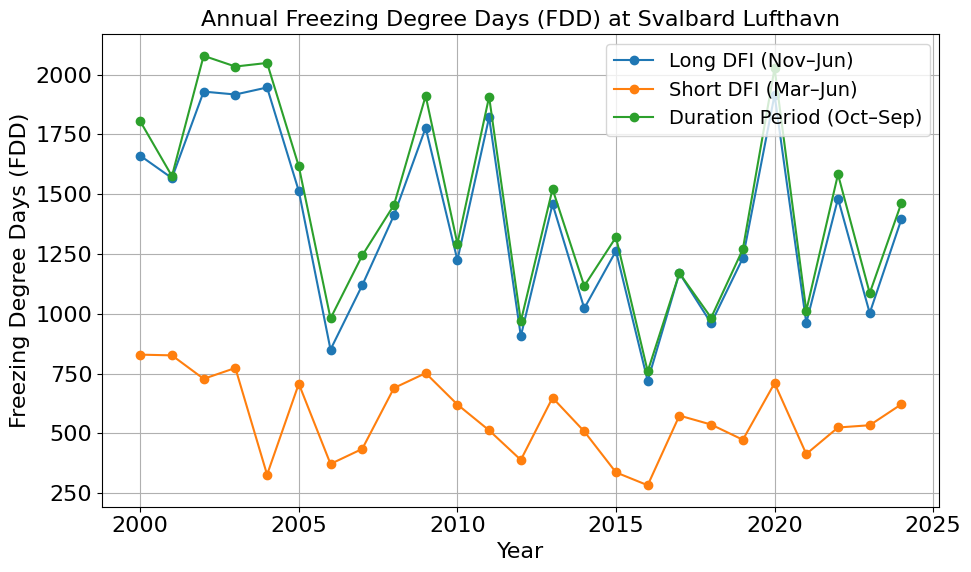

In [90]:
# Plot FDD for different periods
plt.figure(figsize=(10, 6))
plt.plot(df_FDD_CFD.index, df_FDD_CFD["FDD_long"], label="Long DFI (Nov–Jun)", marker='o')
plt.plot(df_FDD_CFD.index, df_FDD_CFD["FDD_short"], label="Short DFI (Mar–Jun)", marker='o')
plt.plot(df_FDD_CFD.index, df_FDD_CFD["FDD_duration"], label="Duration Period (Oct–Sep)", marker='o')
plt.xlabel("Year")
plt.ylabel("Freezing Degree Days (FDD)")
plt.title("Annual Freezing Degree Days (FDD) at Svalbard Lufthavn")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

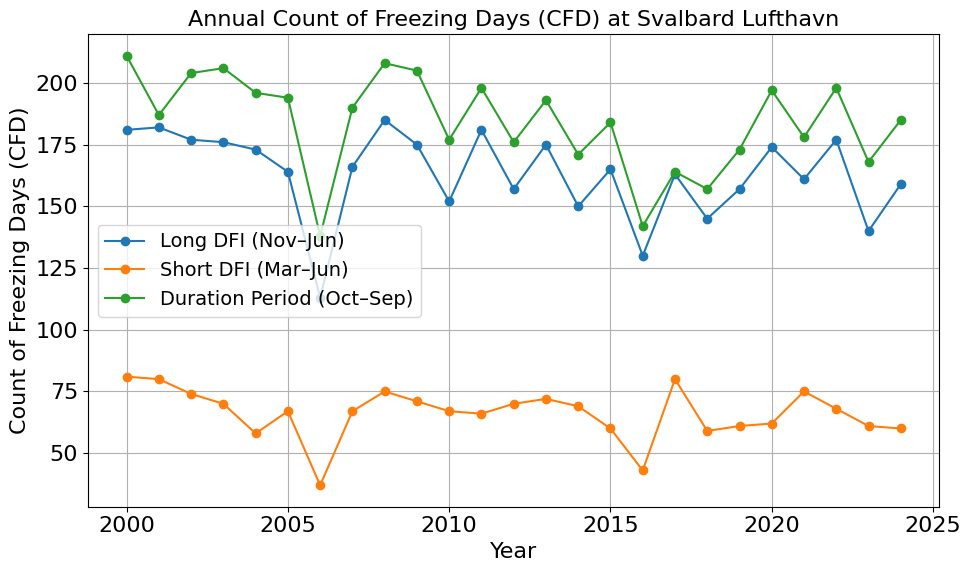

In [91]:
# Plot CFD for different periods
plt.figure(figsize=(10, 6))
plt.plot(df_FDD_CFD.index, df_FDD_CFD["CFD_long"], label="Long DFI (Nov–Jun)", marker='o')
plt.plot(df_FDD_CFD.index, df_FDD_CFD["CFD_short"], label="Short DFI (Mar–Jun)", marker='o')
plt.plot(df_FDD_CFD.index, df_FDD_CFD["CFD_duration"], label="Duration Period (Oct–Sep)", marker='o')
plt.xlabel("Year")
plt.ylabel("Count of Freezing Days (CFD)")
plt.title("Annual Count of Freezing Days (CFD) at Svalbard Lufthavn")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## now include ocean heat (VT)

### load files

In [92]:
# ---- paths ----
path = "/home/hugo/uni/master/seaicetimeseries/data/vt"
file_summer = f"{path}/volume_weightedTandS_summer1987_2019.mat"
file_winter = f"{path}/volume_weightedTandS_winter1987_2019.mat"

# ---- load .mat files ----
mat_s = scipy.io.loadmat(file_summer)
mat_w = scipy.io.loadmat(file_winter)

print(mat_s.keys())
print(mat_w.keys())

dict_keys(['__header__', '__version__', '__globals__', 'S_V_s', 'T_V_s'])
dict_keys(['__header__', '__version__', '__globals__', 'S_V_w', 'T_V_w'])


In [93]:
# The .mat structure includes extra keys, so we extract only the arrays we want
T_V_s = np.squeeze(mat_s["T_V_s"])   # Summer temperature
S_V_s = np.squeeze(mat_s["S_V_s"])   # Summer salinity

T_V_w = np.squeeze(mat_w["T_V_w"])   # Winter temperature
S_V_w = np.squeeze(mat_w["S_V_w"])   # Winter salinity

# ---- build year index ----
years_vt = np.arange(1987, 2020)  # 33 values

print(years_vt)
print(len(T_V_s), len(S_V_s), len(T_V_w), len(S_V_w), len(years_vt))  # Should all be 33

[1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000
 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014
 2015 2016 2017 2018 2019]
33 33 33 33 33


In [94]:

# ---- build DataFrame ----
df_ocean = pd.DataFrame({
    "year": years_vt,
    "VTs": T_V_s,
    "VTw": T_V_w,
    "VSs": S_V_s,
    "VSw": S_V_w
})

df_ocean


,year,VTs,VTw,VSs,VSw
0,1987,1.272159,NaN,34.340021,NaN
1,1988,1.585134,NaN,34.301167,NaN
2,1989,NaN,NaN,NaN,NaN
3,1990,2.503168,NaN,34.078292,NaN
4,1991,3.553246,NaN,34.451161,NaN
5,1992,1.672836,NaN,34.303175,NaN
6,1993,0.807433,NaN,33.700757,NaN
7,1994,1.431857,NaN,34.233342,NaN
8,1995,1.051127,NaN,34.004231,NaN
9,1996,1.122096,NaN,33.935600,NaN


### plot

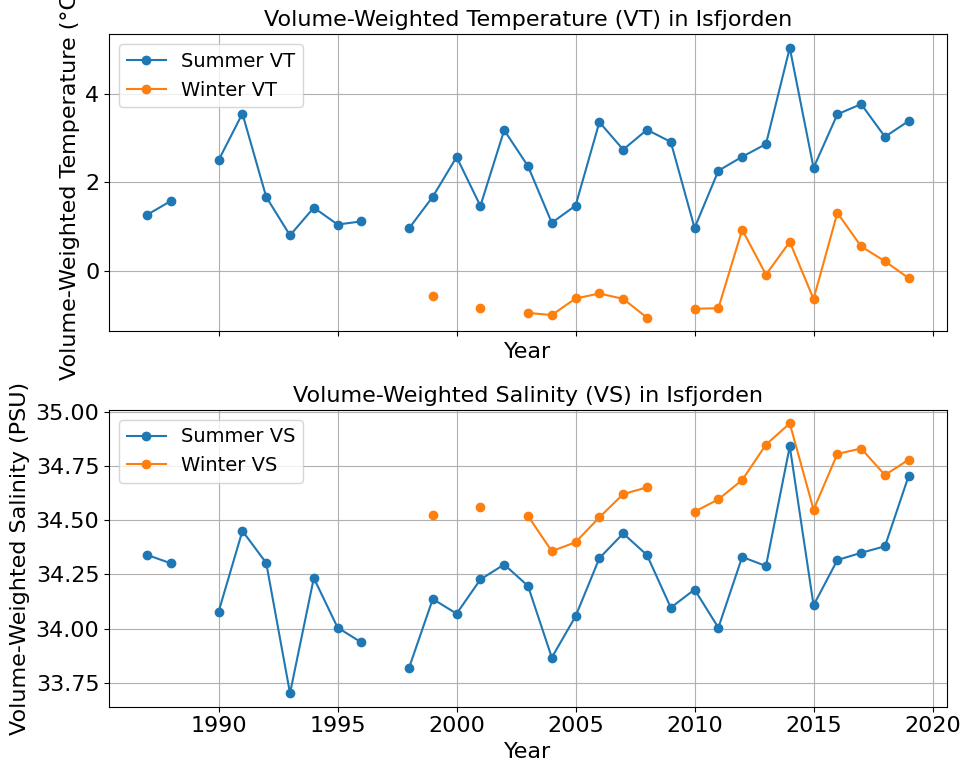

In [95]:
# plot winter and summer VT in upper subplot and winter and summer VS in a lower subplot figure
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
# Upper subplot: VT
axes[0].plot(df_ocean["year"], df_ocean["VTs"], label="Summer VT", marker='o')
axes[0].plot(df_ocean["year"], df_ocean["VTw"], label="Winter VT", marker='o')
axes[0].set_xlabel("Year")
axes[0].set_ylabel("Volume-Weighted Temperature (°C)")
axes[0].set_title("Volume-Weighted Temperature (VT) in Isfjorden")
axes[0].legend()
axes[0].grid(True)
# Lower subplot: VS
axes[1].plot(df_ocean["year"], df_ocean["VSs"], label="Summer VS", marker='o')
axes[1].plot(df_ocean["year"], df_ocean["VSw"], label="Winter VS", marker='o')
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Volume-Weighted Salinity (PSU)")
axes[1].set_title("Volume-Weighted Salinity (VS) in Isfjorden")
axes[1].legend()
axes[1].grid(True)
plt.tight_layout()
plt.show()



## reminder: different periods in thesis


For long winter: season 2005 = Nov 1 2004 → Jun 30 2005. (Matches Muckenhuber long period.)

For short winter: season 2005 = Mar 1 2005 → Jun 30 2005. (Matches Muckenhuber short.)

For Oct1–Sep30: season 2005 = Oct 1 2004 → Sep 30 2005 (useful for your duration/threshold)

## build an air-sea-ice dataframe

### duration amd total ice

In [96]:
df_ice_amount_and_duration = df_combined_ice_stats_2000_2024.copy().set_index("Season")
df_ice_amount_and_duration = (
    df_ice_amount_and_duration
    .rename_axis("year")                       # rename index
    .rename(columns={"Duration (days)": "Duration",
                     "Total Ice >15% (km²·days)": "Total_Ice_gt15"})
    [["Duration", "Total_Ice_gt15"]]           # keep only two columns
)



In [97]:
df_ice_amount_and_duration

,Duration,Total_Ice_gt15
year,,
2000,236,4.675156e+11
2001,192,3.810421e+11
2002,237,3.323532e+11
2003,219,3.194445e+11
2004,238,3.944857e+11
2005,221,3.685711e+11
2006,229,1.718922e+11
2007,175,1.480074e+11
2008,275,1.978962e+11


### DFI_long

In [98]:
df_dfi = dfi_df.copy()
df_dfi["Year"] = df_dfi.index.year
df_dfi = df_dfi[(df_dfi["Year"] >= 2000) & (df_dfi["Year"] <= 2024)]

df_dfi = df_dfi[["Year", "DFI_long"]].set_index("Year").rename_axis("year")
df_dfi.loc[df_dfi.index[0], "DFI_long"] = np.nan  # Set first value to NaN to avoid spurious correlation
df_dfi

,DFI_long
year,
2000,NaN
2001,27.709145
2002,30.976753
2003,40.031805
2004,79.968340
2005,33.892220
2006,13.886951
2007,25.562797
2008,33.581126


### FDD, CFD

In [99]:
df_fddcfd = df_FDD_CFD.loc[2000:2024, ["FDD_long", "CFD_long"]]
df_fddcfd

,FDD_long,CFD_long
year,,
2000,1661.3,181
2001,1567.5,182
2002,1929.4,177
2003,1917.2,176
2004,1946.6,173
2005,1513.3,164
2006,850.0,113
2007,1119.2,166
2008,1411.8,185


### VT/VS

In [100]:
df_ocean

,year,VTs,VTw,VSs,VSw
0,1987,1.272159,NaN,34.340021,NaN
1,1988,1.585134,NaN,34.301167,NaN
2,1989,NaN,NaN,NaN,NaN
3,1990,2.503168,NaN,34.078292,NaN
4,1991,3.553246,NaN,34.451161,NaN
5,1992,1.672836,NaN,34.303175,NaN
6,1993,0.807433,NaN,33.700757,NaN
7,1994,1.431857,NaN,34.233342,NaN
8,1995,1.051127,NaN,34.004231,NaN
9,1996,1.122096,NaN,33.935600,NaN


### shift ocean heat to make summer VT fit with ice season (see thesis)

In [101]:
df_ocean["year"] = df_ocean["year"] + 1 # Shift to match season year convention
df_ocean

,year,VTs,VTw,VSs,VSw
0,1988,1.272159,NaN,34.340021,NaN
1,1989,1.585134,NaN,34.301167,NaN
2,1990,NaN,NaN,NaN,NaN
3,1991,2.503168,NaN,34.078292,NaN
4,1992,3.553246,NaN,34.451161,NaN
5,1993,1.672836,NaN,34.303175,NaN
6,1994,0.807433,NaN,33.700757,NaN
7,1995,1.431857,NaN,34.233342,NaN
8,1996,1.051127,NaN,34.004231,NaN
9,1997,1.122096,NaN,33.935600,NaN


In [102]:
df_vtsvss = df_ocean.copy().set_index("year")
df_vtsvss = df_vtsvss.loc[2000:2024, ["VTs", "VSs"]]
df_vtsvss

,VTs,VSs
year,,
2000,1.679184,34.136498
2001,2.573713,34.068536
2002,1.470228,34.226795
2003,3.179452,34.295904
2004,2.367941,34.196799
2005,1.090121,33.865741
2006,1.478499,34.056595
2007,3.360953,34.325254
2008,2.740786,34.439492


### Combine all

In [103]:
# Start with amount and duration
df_results = df_ice_amount_and_duration.copy()

# Add DFI
df_results = df_results.merge(df_dfi, left_index=True, right_index=True, how="left")


# Add FDD + CFD
df_results = df_results.merge(df_fddcfd, left_index=True, right_index=True, how="left")


# Add ocean variables
df_results = df_results.merge(df_vtsvss, left_index=True, right_index=True, how="left")


# --- NEW LINE: Export the merged dataframe to a CSV file ---
df_results.to_csv("final_combined_sea_ice_results.csv")

df_results




,Duration,Total_Ice_gt15,DFI_long,FDD_long,CFD_long,VTs,VSs
year,,,,,,,
2000,236,4.675156e+11,NaN,1661.3,181,1.679184,34.136498
2001,192,3.810421e+11,27.709145,1567.5,182,2.573713,34.068536
2002,237,3.323532e+11,30.976753,1929.4,177,1.470228,34.226795
2003,219,3.194445e+11,40.031805,1917.2,176,3.179452,34.295904
2004,238,3.944857e+11,79.968340,1946.6,173,2.367941,34.196799
2005,221,3.685711e+11,33.892220,1513.3,164,1.090121,33.865741
2006,229,1.718922e+11,13.886951,850.0,113,1.478499,34.056595
2007,175,1.480074e+11,25.562797,1119.2,166,3.360953,34.325254
2008,275,1.978962e+11,33.581126,1411.8,185,2.740786,34.439492


# Plot all

/tmp/ipykernel_53377/1624920245.py:83: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_top.set_xticklabels(years, rotation=35)


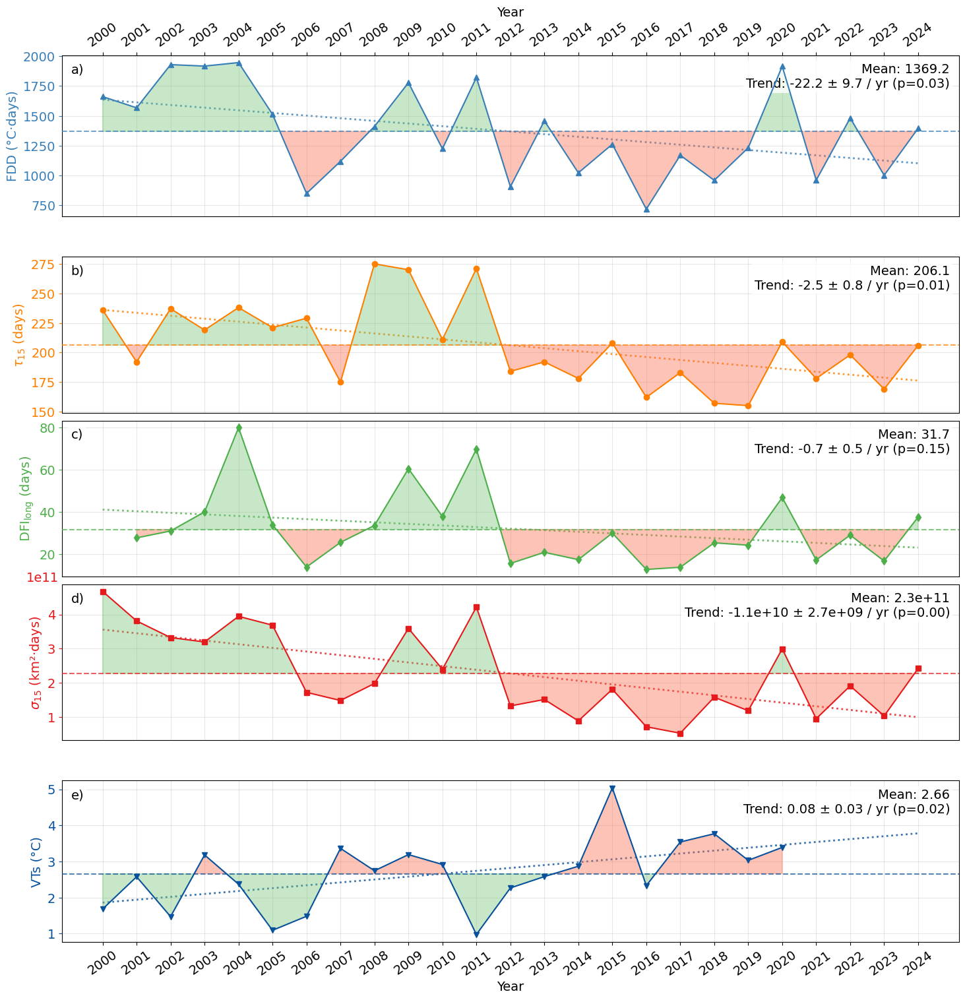

In [105]:

# ============================================================
# Toggles & Font sizes (SINGLE CONTROL POINT)
# ============================================================
PLOT_REGRESSION = True  
FS_BASE   = 14          
FS_LABEL  = FS_BASE
FS_TICK   = FS_BASE
FS_OFFSET = FS_BASE

# ============================================================
# Spacing Controls
# ============================================================
SPACE_OUTER = 0.15  # Gap between Air <-> Ice <-> Ocean
SPACE_INNER = 0.05  # Gap between the three Ice metrics

# ============================================================
# Colors (Muted Scientific Palette)
# ============================================================
c_fdd = "#377EB8"  
c_dur = "#FF7F00"  
c_ice = "#E41A1C"  
c_dfi = "#4DAF4A"  
c_vts = "#08519C"  

c_above = "#74C476" 
c_below = "#FB6A4A" 
alpha_shade = 0.4 

years = df_results.index
x_years = np.array(years, dtype=float) 

# ============================================================
# Figure + Nested GridSpecs
# ============================================================
fig = plt.figure(figsize=(16, 16)) 

# Outer GridSpec: 3 rows -> Atmosphere (1 part), Ice Group (3 parts), Ocean (1 part)
gs_outer = gridspec.GridSpec(nrows=3, ncols=1, figure=fig, height_ratios=[1, 3, 1])
gs_outer.update(hspace=SPACE_OUTER)

# Inner GridSpec for the Ice Group: 3 rows inside the middle outer row
gs_ice = gridspec.GridSpecFromSubplotSpec(nrows=3, ncols=1, subplot_spec=gs_outer[1, 0], hspace=SPACE_INNER)

# ============================================================
# 1) TOP SUBPLOT — FDD (Outer GridSpec Row 0)
# ============================================================
ax_top = fig.add_subplot(gs_outer[0, 0])
y_col = "FDD_long"

ax_top.plot(years, df_results[y_col], color=c_fdd, marker="^", zorder=4)

mean_val = df_results[y_col].mean()
ax_top.axhline(mean_val, color=c_fdd, linestyle="--", linewidth=1.5, alpha=0.7, zorder=3)

ax_top.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] > mean_val), 
                    interpolate=True, color=c_above, alpha=alpha_shade, zorder=2)
ax_top.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] <= mean_val), 
                    interpolate=True, color=c_below, alpha=alpha_shade, zorder=2)

if PLOT_REGRESSION:
    mask = df_results[y_col].notna()
    x_clean, y_clean = x_years[mask], df_results[y_col][mask]
    slope, intercept, r_val, p_val, std_err = stats.linregress(x_clean, y_clean)
    
    ax_top.plot(years, slope * x_years + intercept, color=c_fdd, linewidth=2, linestyle=":", zorder=1, alpha=0.8)
    
    box_text = f"Mean: {mean_val:.1f}\nTrend: {slope:.1f} ± {std_err:.1f} / yr (p={p_val:.2f})"
    ax_top.text(0.99, 0.95, box_text, transform=ax_top.transAxes, fontsize=FS_OFFSET, 
                horizontalalignment='right', verticalalignment='top', 
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3))

# ADDED PANEL LABEL (1)
ax_top.text(0.01, 0.95, "a)", transform=ax_top.transAxes, fontsize=FS_LABEL, fontweight='normal',
            horizontalalignment='left', verticalalignment='top', 
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3), zorder=6)

ax_top.set_ylabel("FDD (°C·days)", color=c_fdd, fontsize=FS_LABEL)
ax_top.tick_params(axis="y", colors=c_fdd, labelsize=FS_TICK)
ax_top.tick_params(axis="x", which="both", top=True, labeltop=True, bottom=False, labelbottom=False, labelsize=FS_TICK)
ax_top.set_xlabel("Year", fontsize=FS_LABEL)
ax_top.xaxis.set_label_position("top")
ax_top.grid(True, alpha=0.3)
ax_top.set_xticklabels(years, rotation=35) 

# ============================================================
# 2) SUBPLOT 2 — Duration (Inner GridSpec Row 0)
# ============================================================
ax_dur = fig.add_subplot(gs_ice[0, 0], sharex=ax_top)
ax_dur.tick_params(axis="x", which="both", bottom=False, labelbottom=False)
y_col = "Duration"

ax_dur.plot(years, df_results[y_col], color=c_dur, marker="o", zorder=4)

mean_val = df_results[y_col].mean()
ax_dur.axhline(mean_val, color=c_dur, linestyle="--", linewidth=1.5, alpha=0.7, zorder=3)

ax_dur.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] > mean_val), 
                    interpolate=True, color=c_above, alpha=alpha_shade, zorder=2)
ax_dur.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] <= mean_val), 
                    interpolate=True, color=c_below, alpha=alpha_shade, zorder=2)

if PLOT_REGRESSION:
    mask = df_results[y_col].notna()
    x_clean, y_clean = x_years[mask], df_results[y_col][mask]
    slope, intercept, r_val, p_val, std_err = stats.linregress(x_clean, y_clean)
    
    ax_dur.plot(years, slope * x_years + intercept, color=c_dur, linewidth=2, linestyle=":", zorder=1, alpha=0.8)
    
    box_text = f"Mean: {mean_val:.1f}\nTrend: {slope:.1f} ± {std_err:.1f} / yr (p={p_val:.2f})"
    ax_dur.text(0.99, 0.95, box_text, transform=ax_dur.transAxes, fontsize=FS_OFFSET, 
                horizontalalignment='right', verticalalignment='top', 
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3))

# ADDED PANEL LABEL (2)
ax_dur.text(0.01, 0.95, "b)", transform=ax_dur.transAxes, fontsize=FS_LABEL, fontweight='normal',
            horizontalalignment='left', verticalalignment='top', 
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3), zorder=6)

ax_dur.set_ylabel(r"$\tau_{15}$ (days)", color=c_dur, fontsize=FS_LABEL)
ax_dur.tick_params(axis="y", colors=c_dur, labelsize=FS_TICK)
ax_dur.grid(True, alpha=0.3)

# ============================================================
# 3) SUBPLOT 3 — DFI (Inner GridSpec Row 1)
# ============================================================
ax_dfi = fig.add_subplot(gs_ice[1, 0], sharex=ax_top)
ax_dfi.tick_params(axis="x", which="both", bottom=False, labelbottom=False)
y_col = "DFI_long"

ax_dfi.plot(years, df_results[y_col], color=c_dfi, marker="d", zorder=4)

mean_val = df_results[y_col].mean()
ax_dfi.axhline(mean_val, color=c_dfi, linestyle="--", linewidth=1.5, alpha=0.7, zorder=3)

ax_dfi.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] > mean_val), 
                    interpolate=True, color=c_above, alpha=alpha_shade, zorder=2)
ax_dfi.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] <= mean_val), 
                    interpolate=True, color=c_below, alpha=alpha_shade, zorder=2)

if PLOT_REGRESSION:
    mask = df_results[y_col].notna()
    x_clean, y_clean = x_years[mask], df_results[y_col][mask]
    slope, intercept, r_val, p_val, std_err = stats.linregress(x_clean, y_clean)
    
    ax_dfi.plot(years, slope * x_years + intercept, color=c_dfi, linewidth=2, linestyle=":", zorder=1, alpha=0.8)
    
    box_text = f"Mean: {mean_val:.1f}\nTrend: {slope:.1f} ± {std_err:.1f} / yr (p={p_val:.2f})"
    ax_dfi.text(0.99, 0.95, box_text, transform=ax_dfi.transAxes, fontsize=FS_OFFSET, 
                horizontalalignment='right', verticalalignment='top', 
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3))

# ADDED PANEL LABEL (3)
ax_dfi.text(0.01, 0.95, "c)", transform=ax_dfi.transAxes, fontsize=FS_LABEL, fontweight='normal',
            horizontalalignment='left', verticalalignment='top', 
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3), zorder=6)

ax_dfi.set_ylabel(r"$\mathrm{DFI}_{\mathrm{long}}$ (days)", color=c_dfi, fontsize=FS_LABEL)
ax_dfi.tick_params(axis="y", colors=c_dfi, labelsize=FS_TICK)
ax_dfi.grid(True, alpha=0.3)

# ============================================================
# 4) SUBPLOT 4 — Total Ice (Inner GridSpec Row 2)
# ============================================================
ax_ice = fig.add_subplot(gs_ice[2, 0], sharex=ax_top)
ax_ice.tick_params(axis="x", which="both", bottom=False, labelbottom=False)
y_col = "Total_Ice_gt15"

ax_ice.plot(years, df_results[y_col], color=c_ice, marker="s", zorder=4)

mean_val = df_results[y_col].mean()
ax_ice.axhline(mean_val, color=c_ice, linestyle="--", linewidth=1.5, alpha=0.7, zorder=3)

ax_ice.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] > mean_val), 
                    interpolate=True, color=c_above, alpha=alpha_shade, zorder=2)
ax_ice.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] <= mean_val), 
                    interpolate=True, color=c_below, alpha=alpha_shade, zorder=2)

if PLOT_REGRESSION:
    mask = df_results[y_col].notna()
    x_clean, y_clean = x_years[mask], df_results[y_col][mask]
    slope, intercept, r_val, p_val, std_err = stats.linregress(x_clean, y_clean)
    
    ax_ice.plot(years, slope * x_years + intercept, color=c_ice, linewidth=2, linestyle=":", zorder=1, alpha=0.8)
    
    box_text = f"Mean: {mean_val:.1e}\nTrend: {slope:.1e} ± {std_err:.1e} / yr (p={p_val:.2f})"
    ax_ice.text(0.99, 0.95, box_text, transform=ax_ice.transAxes, fontsize=FS_OFFSET, 
                horizontalalignment='right', verticalalignment='top', 
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3))

# ADDED PANEL LABEL (4)
ax_ice.text(0.01, 0.95, "d)", transform=ax_ice.transAxes, fontsize=FS_LABEL, fontweight='normal',
            horizontalalignment='left', verticalalignment='top', 
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3), zorder=6)

ax_ice.set_ylabel(r"$\sigma_{15}$ (km²·days)", color=c_ice, fontsize=FS_LABEL)
ax_ice.tick_params(axis="y", colors=c_ice, labelsize=FS_TICK)
ax_ice.grid(True, alpha=0.3)

# --- Move the scientific notation offset (1e11) to the left ---
fig.canvas.draw() 
offset_text = ax_ice.yaxis.get_offset_text()
offset_text.set_fontsize(FS_OFFSET)
offset_text.set_position((-0.04, 1)) 

# ============================================================
# 5) BOTTOM SUBPLOT — VTs (Outer GridSpec Row 2)
# ============================================================
ax_bottom = fig.add_subplot(gs_outer[2, 0], sharex=ax_top)
y_col = "VTs"

ax_bottom.plot(years, df_results[y_col], color=c_vts, marker="v", zorder=4)

mean_val = df_results[y_col].mean()
ax_bottom.axhline(mean_val, color=c_vts, linestyle="--", linewidth=1.5, alpha=0.7, zorder=3)

ax_bottom.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] > mean_val), 
                       interpolate=True, color=c_below, alpha=alpha_shade, zorder=2)
ax_bottom.fill_between(years, df_results[y_col], mean_val, where=(df_results[y_col] <= mean_val), 
                       interpolate=True, color=c_above, alpha=alpha_shade, zorder=2)

if PLOT_REGRESSION:
    mask = df_results[y_col].notna()
    x_clean, y_clean = x_years[mask], df_results[y_col][mask]
    slope, intercept, r_val, p_val, std_err = stats.linregress(x_clean, y_clean)
    
    ax_bottom.plot(years, slope * x_years + intercept, color=c_vts, linewidth=2, linestyle=":", zorder=1, alpha=0.8)
    
    box_text = f"Mean: {mean_val:.2f}\nTrend: {slope:.2f} ± {std_err:.2f} / yr (p={p_val:.2f})"
    ax_bottom.text(0.99, 0.95, box_text, transform=ax_bottom.transAxes, fontsize=FS_OFFSET, 
                   horizontalalignment='right', verticalalignment='top', 
                   bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3))

# ADDED PANEL LABEL (5)
ax_bottom.text(0.01, 0.95, "e)", transform=ax_bottom.transAxes, fontsize=FS_LABEL, fontweight='normal',
               horizontalalignment='left', verticalalignment='top', 
               bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3), zorder=6)

ax_bottom.set_ylabel("VTs (°C)", color=c_vts, fontsize=FS_LABEL)
ax_bottom.tick_params(axis="y", colors=c_vts, labelsize=FS_TICK)
ax_bottom.tick_params(axis="x", labelsize=FS_TICK)

ax_bottom.set_xlabel("Year", fontsize=FS_LABEL)
ax_bottom.grid(True, alpha=0.3)

# ============================================================
# X-axis ticks
# ============================================================
ax_bottom.set_xticks(years)
ax_bottom.set_xticklabels(years, rotation=35) 

# ============================================================
# Final layout 
# ============================================================
plt.subplots_adjust(left=0.1, right=0.95, top=0.92, bottom=0.08)
plt.show()

## correlation analysis

In [106]:
df = df_results.copy()
df

,Duration,Total_Ice_gt15,DFI_long,FDD_long,CFD_long,VTs,VSs
year,,,,,,,
2000,236,4.675156e+11,NaN,1661.3,181,1.679184,34.136498
2001,192,3.810421e+11,27.709145,1567.5,182,2.573713,34.068536
2002,237,3.323532e+11,30.976753,1929.4,177,1.470228,34.226795
2003,219,3.194445e+11,40.031805,1917.2,176,3.179452,34.295904
2004,238,3.944857e+11,79.968340,1946.6,173,2.367941,34.196799
2005,221,3.685711e+11,33.892220,1513.3,164,1.090121,33.865741
2006,229,1.718922e+11,13.886951,850.0,113,1.478499,34.056595
2007,175,1.480074e+11,25.562797,1119.2,166,3.360953,34.325254
2008,275,1.978962e+11,33.581126,1411.8,185,2.740786,34.439492


In [108]:
from scipy.stats import pearsonr, spearmanr

pairs = [
    ("FDD_long", "Duration"),
    ("FDD_long", "Total_Ice_gt15"),
    ("FDD_long", "DFI_long"),
    ("VTs", "Duration"),
    ("VTs", "Total_Ice_gt15"),
    ("VTs", "DFI_long"),
    ("FDD_long", "VTs")
]

for a, b in pairs:
    x = df[a].values
    y = df[b].values

    # Remove NaNs
    mask = ~(np.isnan(x) | np.isnan(y))
    x = x[mask]
    y = y[mask]

    # Spearman
    rho_s, p_s = spearmanr(x, y)
    
    # Pearson
    rho_p, p_p = pearsonr(x, y)

    print(f"{a} vs {b}:")
    print(f"   Pearson:  r={rho_p:.3f},  p={p_p:.4f}")
    print(f"   Spearman: r={rho_s:.3f},  p={p_s:.4f}")


FDD_long vs Duration:
   Pearson:  r=0.660,  p=0.0003
   Spearman: r=0.682,  p=0.0002
FDD_long vs Total_Ice_gt15:
   Pearson:  r=0.825,  p=0.0000
   Spearman: r=0.817,  p=0.0000
FDD_long vs DFI_long:
   Pearson:  r=0.783,  p=0.0000
   Spearman: r=0.828,  p=0.0000
VTs vs Duration:
   Pearson:  r=-0.389,  p=0.0813
   Spearman: r=-0.446,  p=0.0426
VTs vs Total_Ice_gt15:
   Pearson:  r=-0.447,  p=0.0423
   Spearman: r=-0.406,  p=0.0675
VTs vs DFI_long:
   Pearson:  r=-0.150,  p=0.5282
   Spearman: r=-0.029,  p=0.9048
FDD_long vs VTs:
   Pearson:  r=-0.187,  p=0.4159
   Spearman: r=-0.149,  p=0.5182


### make heatmap

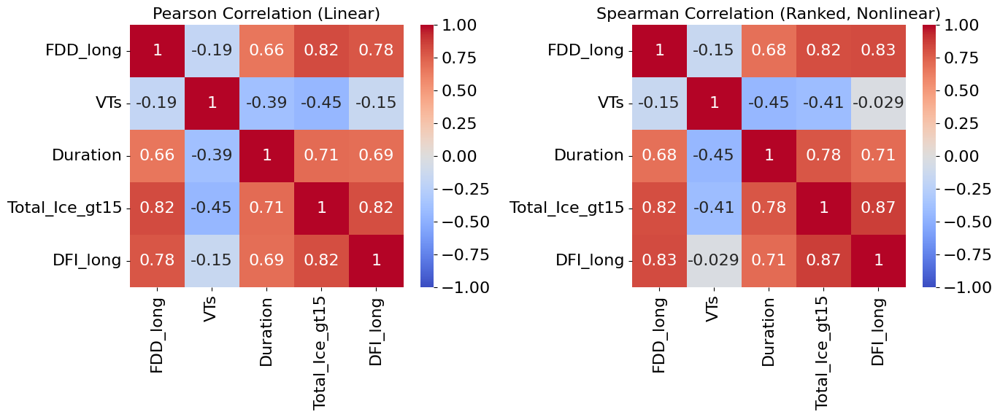

In [109]:
# Select only variables of interest
cols = ["FDD_long", "VTs", "Duration", "Total_Ice_gt15", "DFI_long"]

df_corr_pearson = df[cols].corr(method="pearson")
df_corr_spearman = df[cols].corr(method="spearman")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(df_corr_pearson, annot=True, cmap="coolwarm",
            vmin=-1, vmax=1, ax=axes[0])
axes[0].set_title("Pearson Correlation (Linear)")

sns.heatmap(df_corr_spearman, annot=True, cmap="coolwarm",
            vmin=-1, vmax=1, ax=axes[1])
axes[1].set_title("Spearman Correlation (Ranked, Nonlinear)")

plt.tight_layout()
plt.show()


### spearman

/tmp/ipykernel_53377/1016584114.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


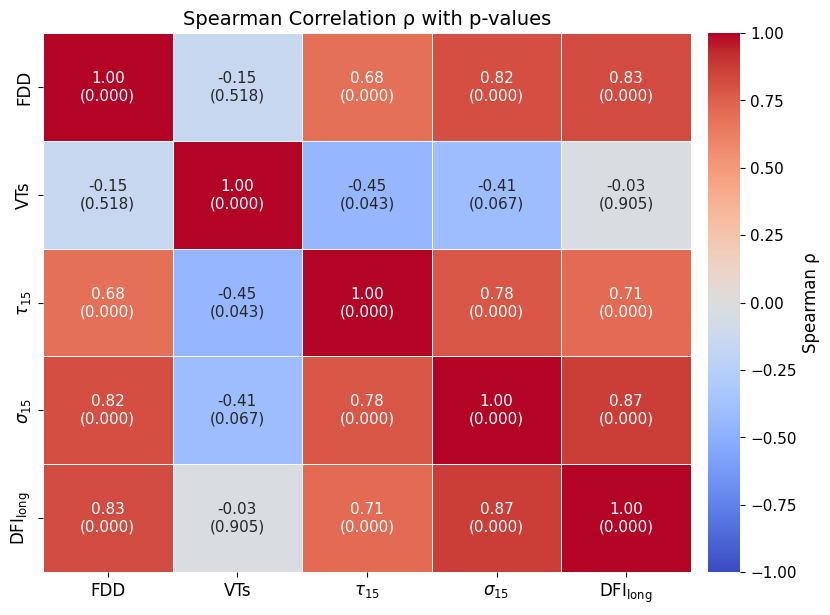

In [110]:

# --------------------------------------------------
# Adjustable parameters
# --------------------------------------------------
label_size = 12       # axis tick labels
annot_size = 11       # numbers inside heatmap
title_size = 14
cbar_label_size = 12
cbar_tick_size = 11

# --------------------------------------------------
# Rename columns for plotting
# --------------------------------------------------
df_ren = df.rename(columns={
    "FDD_long": "FDD",
    "VTs": "VTs",
    "Duration": r"$\tau_{15}$",
    "Total_Ice_gt15": r"$\sigma_{15}$",
    "DFI_long": r"$\mathrm{DFI}_{\mathrm{long}}$"
})

# Make sure vars_plot matches the NEW column names exactly!
vars_plot = [
    "FDD", 
    "VTs", 
    r"$\tau_{15}$", 
    r"$\sigma_{15}$", 
    r"$\mathrm{DFI}_{\mathrm{long}}$"
]

# --------------------------------------------------
# Compute Spearman correlation + p-values
# --------------------------------------------------
corr  = pd.DataFrame(index=vars_plot, columns=vars_plot, dtype=float)
pval  = pd.DataFrame(index=vars_plot, columns=vars_plot, dtype=float)
annot = pd.DataFrame(index=vars_plot, columns=vars_plot, dtype=str)

for v1 in vars_plot:
    for v2 in vars_plot:
        x = df_ren[v1].values
        y = df_ren[v2].values
        mask = ~(np.isnan(x) | np.isnan(y))

        rho, p = spearmanr(x[mask], y[mask])

        corr.loc[v1, v2] = rho
        pval.loc[v1, v2] = p
        annot.loc[v1, v2] = f"{rho:.2f}\n({p:.3f})"

# --------------------------------------------------
# Plot with manual colorbar control
# --------------------------------------------------
fig, (ax, cax) = plt.subplots(
    ncols=2,
    figsize=(9, 7),
    gridspec_kw={"width_ratios": [20, 1], "wspace": 0.05}
)

sns.heatmap(
    corr.astype(float),
    ax=ax,
    annot=annot,
    fmt="",
    cmap="coolwarm",
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar=True,
    cbar_ax=cax,
    annot_kws={"size": annot_size}
)

# Axis label sizes
ax.tick_params(axis="x", labelsize=label_size, rotation=0)
ax.tick_params(axis="y", labelsize=label_size)

# Title
ax.set_title("Spearman Correlation ρ with p-values", fontsize=title_size)

# Colorbar formatting
cax.set_ylabel("Spearman ρ", fontsize=cbar_label_size)
cax.tick_params(labelsize=cbar_tick_size)

plt.tight_layout()
plt.show()


### include number of pairs

/tmp/ipykernel_53377/3651611142.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


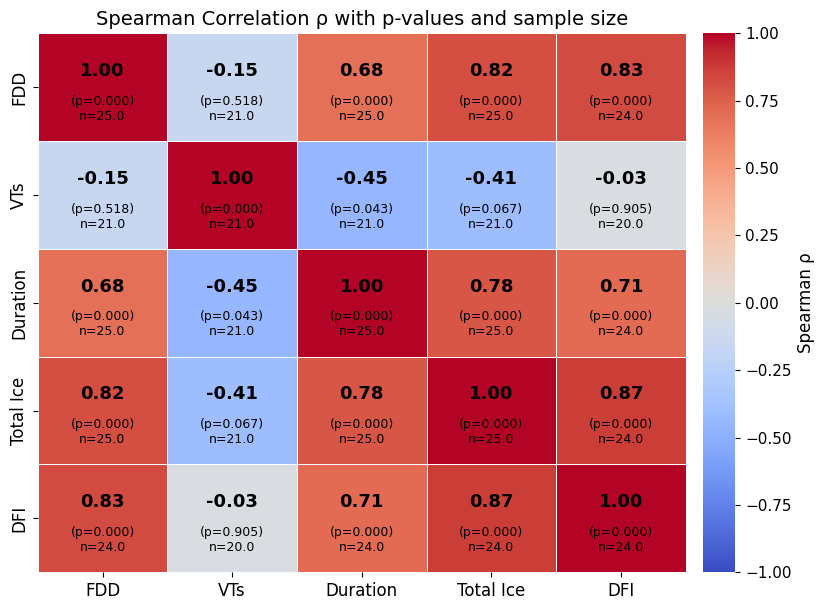

In [111]:

# --------------------------------------------------
# Adjustable parameters
# --------------------------------------------------
label_size = 12
rho_size = 13        # larger correlation font
stats_size = 9       # smaller p + n font
title_size = 14
cbar_label_size = 12
cbar_tick_size = 11

# --------------------------------------------------
# Rename columns
# --------------------------------------------------
df_ren = df.rename(columns={
    "FDD_long": "FDD",
    "VTs": "VTs",
    "Duration": "Duration",
    "Total_Ice_gt15": "Total Ice",
    "DFI_long": "DFI"
})

vars_plot = ["FDD", "VTs", "Duration", "Total Ice", "DFI"]

# --------------------------------------------------
# Compute correlation, p-values, n
# --------------------------------------------------
corr = pd.DataFrame(index=vars_plot, columns=vars_plot, dtype=float)
pval = pd.DataFrame(index=vars_plot, columns=vars_plot, dtype=float)
nobs = pd.DataFrame(index=vars_plot, columns=vars_plot, dtype=int)

for v1 in vars_plot:
    for v2 in vars_plot:
        x = df_ren[v1].values
        y = df_ren[v2].values
        mask = ~(np.isnan(x) | np.isnan(y))
        n = mask.sum()

        if n > 1:
            rho, p = spearmanr(x[mask], y[mask])
        else:
            rho, p = np.nan, np.nan

        corr.loc[v1, v2] = rho
        pval.loc[v1, v2] = p
        nobs.loc[v1, v2] = n

# --------------------------------------------------
# Plot heatmap WITHOUT annotations
# --------------------------------------------------
fig, (ax, cax) = plt.subplots(
    ncols=2,
    figsize=(9, 7),
    gridspec_kw={"width_ratios": [20, 1], "wspace": 0.05}
)

sns.heatmap(
    corr.astype(float),
    ax=ax,
    cmap="coolwarm",
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar=True,
    cbar_ax=cax,
    annot=False
)

# --------------------------------------------------
# Manual annotations
# --------------------------------------------------
for i in range(len(vars_plot)):
    for j in range(len(vars_plot)):
        rho = corr.iloc[i, j]
        p = pval.iloc[i, j]
        n = nobs.iloc[i, j]

        # Large correlation number
        ax.text(j + 0.5, i + 0.35,
                f"{rho:.2f}",
                ha='center', va='center',
                fontsize=rho_size, fontweight='bold')

        # Smaller p + n below
        ax.text(j + 0.5, i + 0.70,
                f"(p={p:.3f})\nn={n}",
                ha='center', va='center',
                fontsize=stats_size)

# Axis formatting
ax.tick_params(axis="x", labelsize=label_size, rotation=0)
ax.tick_params(axis="y", labelsize=label_size)

ax.set_title("Spearman Correlation ρ with p-values and sample size",
             fontsize=title_size)

cax.set_ylabel("Spearman ρ", fontsize=cbar_label_size)
cax.tick_params(labelsize=cbar_tick_size)

plt.tight_layout()
plt.show()

### lag correlation test (but do it with the unshifted one - so go up and comment the vt + 1 line out)

In [113]:
# Variables needed for lag correlation
cols_lag = [
    "FDD_long",
    "VTs",
    "Duration",
    "Total_Ice_gt15",
    "DFI_long"
]

# Create lag-correlation dataframe
df_lagCorrelation = df[cols_lag].dropna()

print(df_lagCorrelation.head())
print(df_lagCorrelation.tail())
print("Years used:", df_lagCorrelation.index.min(), "-", df_lagCorrelation.index.max())


      FDD_long       VTs  Duration  Total_Ice_gt15   DFI_long
year                                                         
2001    1567.5  2.573713       192    3.810421e+11  27.709145
2002    1929.4  1.470228       237    3.323532e+11  30.976753
2003    1917.2  3.179452       219    3.194445e+11  40.031805
2004    1946.6  2.367941       238    3.944857e+11  79.968340
2005    1513.3  1.090121       221    3.685711e+11  33.892220
      FDD_long       VTs  Duration  Total_Ice_gt15   DFI_long
year                                                         
2016     718.7  2.330042       162    7.108284e+10  12.748615
2017    1169.9  3.537885       183    5.217681e+10  13.775617
2018     959.9  3.766787       157    1.576292e+11  25.375068
2019    1232.9  3.029548       155    1.180860e+11  24.233287
2020    1915.8  3.388016       209    2.992780e+11  46.808831
Years used: 2001 - 2020


### plot

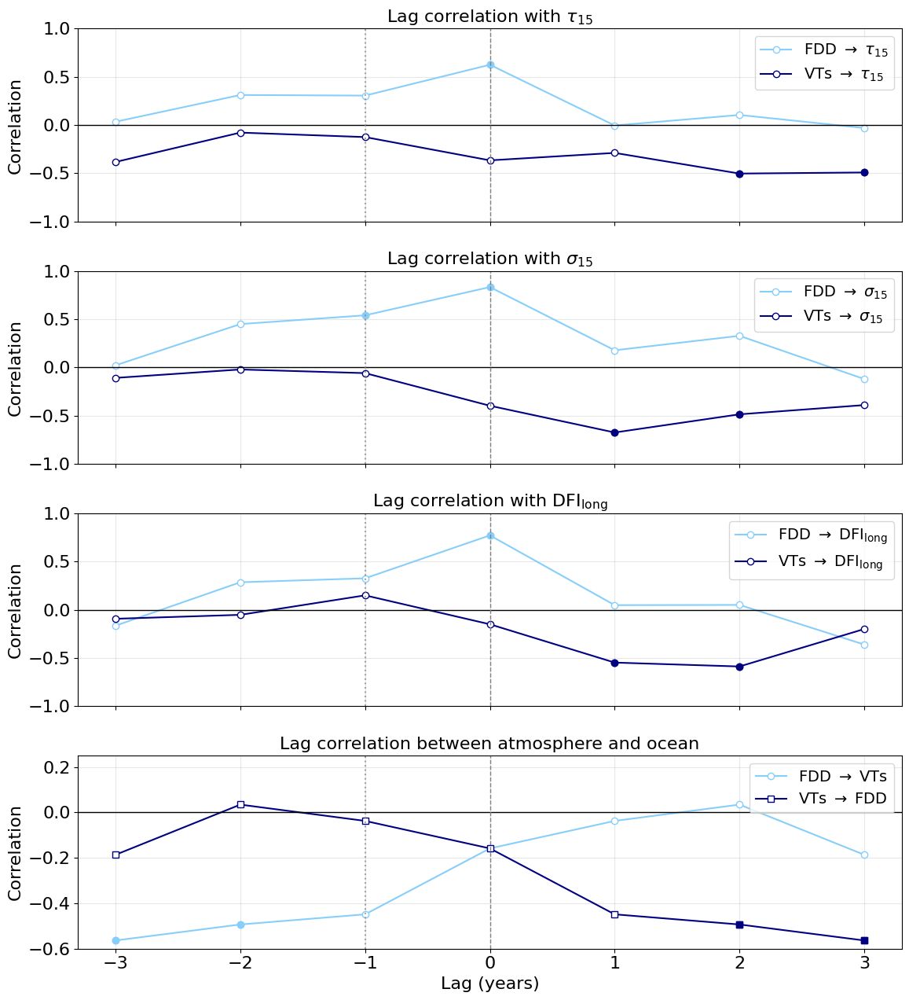

In [114]:

# --------------------------------------------------
# Updated Lag Correlation Function
# --------------------------------------------------
def lag_corr(x, y, max_lag=3):
    """
    Lag correlation between x (driver) and y (response).
    Note: See explanation below regarding the shift direction!
    """
    lags = np.arange(-max_lag, max_lag + 1)
    corrs = []
    pvals = []

    for lag in lags:
        if lag < 0:
            xs = x[:lag]
            ys = y[-lag:]
        elif lag > 0:
            xs = x[lag:]
            ys = y[:-lag]
        else:
            xs = x
            ys = y

        # Remove NaNs
        mask = ~(np.isnan(xs) | np.isnan(ys))
        xs = xs[mask]
        ys = ys[mask]

        if len(xs) > 2:
            res = pearsonr(xs, ys)
            corrs.append(res[0])
            pvals.append(res[1])
        else:
            corrs.append(np.nan)
            pvals.append(np.nan)

    return lags, np.array(corrs), np.array(pvals)

# --------------------------------------------------
# Plotting Setup
# --------------------------------------------------
y_lim = 1

ice_vars_map = {
    "Duration": r"$\tau_{15}$",
    "Total_Ice_gt15": r"$\sigma_{15}$",
    "DFI_long": r"$\mathrm{DFI}_{\mathrm{long}}$"
}

drivers = {
    "FDD": ("FDD_long", "lightskyblue"),
    "VTs": ("VTs", "navy")
}

fig, axes = plt.subplots(
    nrows=4, ncols=1,
    figsize=(12, 13),
    sharex=True
)

# --------------------------------------------------
# Ice response subplots (Top 3)
# --------------------------------------------------
for ax, (col_name, tex_label) in zip(axes[:3], ice_vars_map.items()):

    for label, (drv, color) in drivers.items():

        lags, corrs, pvals = lag_corr(
            df_lagCorrelation[drv].values,
            df_lagCorrelation[col_name].values,
            max_lag=3
        )

        # 1. Main line (Open circles for non-significant)
        ax.plot(
            lags, corrs,
            marker="o",
            markerfacecolor="white", 
            color=color,
            label=fr"{label} $\rightarrow$ {tex_label}"
        )

        # 2. Filled circles for significant points (p < 0.05)
        sig_mask = pvals < 0.05
        if np.any(sig_mask):
            ax.plot(
                lags[sig_mask], corrs[sig_mask],
                marker="o",
                color=color,
                linestyle="None" 
            )

    ax.axhline(0, color="black", lw=1)
    ax.axvline(0, color="gray", ls="--", lw=1)
    ax.axvline(-1, color="gray", ls=":", lw=1.5, alpha=0.7) 
    
    ax.grid(True, alpha=0.3)
    ax.set_ylabel("Correlation")
    ax.set_title(f"Lag correlation with {tex_label}")
    ax.set_ylim(-y_lim, y_lim)
    ax.legend(loc="upper right") 

# --------------------------------------------------
# Atmosphere ↔ Ocean subplot (Bottom 1)
# --------------------------------------------------
ax = axes[3]

# FDD → VTs
lags, cor_FDD_VTs, p_FDD_VTs = lag_corr(
    df_lagCorrelation["FDD_long"].values,
    df_lagCorrelation["VTs"].values,
    max_lag=3
)

ax.plot(
    lags, cor_FDD_VTs,
    color="lightskyblue",
    marker="o",
    markerfacecolor="white",
    label=r"FDD $\rightarrow$ VTs"
)
# Significance for FDD → VTs
mask_FDD_VTs = p_FDD_VTs < 0.05
if np.any(mask_FDD_VTs):
    ax.plot(
        lags[mask_FDD_VTs], cor_FDD_VTs[mask_FDD_VTs],
        marker="o",
        color="lightskyblue",
        linestyle="None"
    )

# VTs → FDD
lags, cor_VTs_FDD, p_VTs_FDD = lag_corr(
    df_lagCorrelation["VTs"].values,
    df_lagCorrelation["FDD_long"].values,
    max_lag=3
)

ax.plot(
    lags, cor_VTs_FDD,
    color="navy",
    marker="s",
    markerfacecolor="white",
    label=r"VTs $\rightarrow$ FDD"
)
# Significance for VTs → FDD
mask_VTs_FDD = p_VTs_FDD < 0.05
if np.any(mask_VTs_FDD):
    ax.plot(
        lags[mask_VTs_FDD], cor_VTs_FDD[mask_VTs_FDD],
        marker="s",
        color="navy",
        linestyle="None"
    )

ax.axhline(0, color="black", lw=1)
ax.axvline(0, color="gray", ls="--", lw=1)
ax.axvline(-1, color="gray", ls=":", lw=1.5, alpha=0.7)

ax.grid(True, alpha=0.3)
ax.set_ylabel("Correlation")
ax.set_title("Lag correlation between atmosphere and ocean")
ax.set_ylim(-0.6, 0.25)
ax.legend(loc="upper right")

# --------------------------------------------------
axes[-1].set_xlabel("Lag (years)")
plt.tight_layout()
plt.show()